## **Medical Segmentation Decathlon: Effective VNet-based 3D Segmentation Model of the Liver**

---


*   VNet was used as my backbone network to solve this decathlon "liver tumour" task (https://arxiv.org/abs/1606.04797)
*   Use the Generalised Dice Score as my loss function (https://arxiv.org/abs/1707.03237)



**The data for this specific task can be downloaded from here:**

 https://drive.google.com/open?id=1jyVGUGyxKBXV6_9ivuZapQS8eUJXCIpu


## **Imports**

---



In [ ]:
!pip install monai
import matplotlib
import monai
from monai.utils import first, set_determinism
from monai.transforms import (
    AsDiscrete,
    AsDiscreted,
    EnsureChannelFirstd,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    Resized,
    RandCropByPosNegLabeld,
    SaveImaged,
    ScaleIntensityRanged,
    Spacingd,
    Invertd,
    RandAffined,
)
from monai.handlers.utils import from_engine
from monai.networks.nets import VNet
from monai.metrics import DiceMetric
from monai.losses import GeneralizedDiceLoss
from monai.inferers import sliding_window_inference
from monai.data import CacheDataset, DataLoader,ThreadDataLoader, Dataset, decollate_batch
from monai.config import print_config
from monai.apps import download_and_extract
import torch
import matplotlib.pyplot as plt
import tempfile
import shutil
import os
import glob
import nibabel as nib
import random
import numpy as np


print_config()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
MONAI version: 1.1.0
Numpy version: 1.22.4
Pytorch version: 1.13.1+cu116
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: a2ec3752f54bfc3b40e7952234fbeb5452ed63e3
MONAI __file__: /usr/local/lib/python3.9/dist-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: 0.4.11
Nibabel version: 3.0.2
scikit-image version: 0.19.3
Pillow version: 8.4.0
Tensorboard version: 2.11.2
gdown version: 4.6.4
TorchVision version: 0.14.1+cu116
tqdm version: 4.65.0
lmdb version: NOT INSTALLED or UNKNOWN VERSION.
psutil version: 5.9.4
pandas version: 1.4.4
einops version: NOT INSTALLED or UNKNOWN VERSION.
transformers version: NOT INSTALLED or UNKNOWN VERSION.
mlflow version: NOT INSTALLED or UNKNOWN VERSION.
pynrrd version: NOT INSTALLED or UNKNOWN VERSION.

For details about installing the optional dependencies, please visit:
    https://docs.monai.i

# **Data divsion**

---



**The following code is only run for the first time, for the purpose of dividing the data set. Later can be directly used**

---



In [ ]:
# original_imagesTr = "/content/drive/My Drive/AML_Final_Project/Data/imagesTr"
# original_labelsTr = "/content/drive/My Drive/AML_Final_Project/Data/labelsTr"

# train_imagesTr = "/content/drive/My Drive/AML_Final_Project/Data/Train/imagesTr"
# train_labelsTr = "/content/drive/My Drive/AML_Final_Project/Data/Train/labelsTr"

# test_imagesTr = "/content/drive/My Drive/AML_Final_Project/Data/Test/imagesTr"
# test_labelsTr = "/content/drive/My Drive/AML_Final_Project/Data/Test/labelsTr"

# os.makedirs(train_imagesTr, exist_ok=True)
# os.makedirs(train_labelsTr, exist_ok=True)
# os.makedirs(test_imagesTr, exist_ok=True)
# os.makedirs(test_labelsTr, exist_ok=True)

# # List all files in the original folders
# all_images = os.listdir(original_imagesTr)
# all_labels = os.listdir(original_labelsTr)

# # Shuffle the list of files
# random.seed(42)
# random.shuffle(all_images)

# # Split the files into training and testing sets
# train_images = all_images[:89]
# test_images = all_images[89:]

# # Copy the files to the destination folders
# for file in train_images:
#     shutil.copy(os.path.join(original_imagesTr, file), os.path.join(train_imagesTr, file))
#     shutil.copy(os.path.join(original_labelsTr, file), os.path.join(train_labelsTr, file))

# for file in test_images:
#     shutil.copy(os.path.join(original_imagesTr, file), os.path.join(test_imagesTr, file))
#     shutil.copy(os.path.join(original_labelsTr, file), os.path.join(test_labelsTr, file))

# **Pipeline**

---





## **Data loading**

---

131 3D volumes (89 Training + 42 Testing)

In [ ]:
# Mount the drive to colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
root_dir = os.path.join("/content/drive/My Drive/AML_Final_Project")
print(root_dir)
data_dir = os.path.join(root_dir, "Data")
print(data_dir)

/content/drive/My Drive/AML_Final_Project
/content/drive/My Drive/AML_Final_Project/Data


In [ ]:
# Set Liver dataset path
train_images = sorted(glob.glob(os.path.join(data_dir, "Train/imagesTr", "*.nii.gz")))
train_labels = sorted(glob.glob(os.path.join(data_dir, "Train/labelsTr", "*.nii.gz")))
data_dicts = [{"image": image_name, "label": label_name} for image_name, label_name in zip(train_images, train_labels)]
train_files, valid_files = data_dicts[:-19], data_dicts[-19:]

## **Preprocessing**

---



In [ ]:
# Set deterministic training for reproducibility
set_determinism(seed=0)

In [ ]:
# Set transforms for training and validation
train_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]), # Load the liver CT images and labels from NIfTI format files
        EnsureChannelFirstd(keys=["image", "label"]), # Ensure the original data to construct "channel first" shape
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-200,
            a_max=200,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ), # Extract intensity range [-200, 200] and scales to [0, 1]
        CropForegroundd(keys=["image", "label"], source_key="image"), # Remove the background region from the label data
        Orientationd(keys=["image", "label"], axcodes="RAS"), # Unify the data orientation based on the affine matrix
        Spacingd(keys=["image", "label"], pixdim=(1.5, 1.5, 1.0), mode=("bilinear", "nearest")), # Adjust the spacing by pixdim based on the affine matrix
        RandCropByPosNegLabeld(
            keys=["image", "label"],
            label_key="label",
            spatial_size=(128, 128, 64),
            pos=1,
            neg=1,
            num_samples=4,
            image_key="image",
            image_threshold=0,
        ), # Randomly crop patch samples from big image based on pos / neg ratio
    ]
)
valid_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        EnsureChannelFirstd(keys=["image", "label"]),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-200,
            a_max=200,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(keys=["image", "label"], pixdim=(1.5, 1.5, 1.0), mode=("bilinear", "nearest")),
    ]
)

## **Dataset and DataLoader**

---



In [ ]:
# Define CacheDataset and DataLoader for training and validation
train_ds = CacheDataset(data=train_files, transform=train_transforms, cache_rate=1.0, num_workers=4) # set cache_rate=1.0 to cache all the data

# Use batch_size=2 to load images and use RandCropByPosNegLabeld to generate 2 x 4 images for network training
train_loader = DataLoader(train_ds, batch_size=2, shuffle=True, num_workers=4)

valid_ds = CacheDataset(data=valid_files, transform=valid_transforms, cache_rate=1.0, num_workers=4)
valid_loader = DataLoader(valid_ds, batch_size=1, num_workers=4)

Loading dataset: 100%|██████████| 19/19 [01:33<00:00,  4.91s/it]


## **Model structure, Loss function and Optimizer**

---



In [ ]:
# Set the device to GPU
device = torch.device("cuda:0")

# Implement the VNet model with dropout_prob = 0.48
model = VNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=3,
    dropout_prob=0.48
).to(device)


# Implements the GeneralizedDiceLoss function from MONAI,
# which is set to calculate the loss using one-hot encoded ground truth labels and sigmoid probabilities
loss_fn = GeneralizedDiceLoss(to_onehot_y=True, sigmoid=True)

# Initializes the Adam optimizer with a learning rate of 1e-5 for model training
optimizer = torch.optim.Adam(model.parameters(), 1e-5)


# Implements the DiceMetric from MONAI,
# which excludes the background and takes the mean of the dice scores for evaluation
dice_score = DiceMetric(include_background=False, reduction="mean")

## **Train**

---



In [ ]:
# Set the number of maximum epochs to 300 and the validation interval to 2
max_epochs = 300
valid_interval = 2

# Keep track of the best metric value and its corresponding epoch
best_metric = -1
best_metric_epoch = -1

# Store epoch loss values and metric values
epoch_loss_values = []
metric_values = []

# Process the model's output and ground truth labels
pred = Compose([AsDiscrete(argmax=True, to_onehot=3)])
label = Compose([AsDiscrete(to_onehot=3)])

for epoch in range(max_epochs):
    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")

    # Set the model to training mode
    model.train()

    # Initializes the epoch loss and step
    epoch_loss = 0
    step = 0

    # Iterate through the training data loader
    for batch_data in train_loader:
        step += 1
        inputs, labels = (
            batch_data["image"].to(device),
            batch_data["label"].to(device),
        )

        # Forward pass
        optimizer.zero_grad()
        outputs = model(inputs)

        # Calculate the loss
        loss = loss_fn(outputs, labels)
        loss.backward()

        # Update the model's weights using the optimizer
        optimizer.step()

        epoch_loss += loss.item()
        print(f"{step}/{len(train_ds) // train_loader.batch_size}, " f"train_loss: {loss.item():.4f}")

    # Calculate the average epoch loss and appends it to the epoch_loss_values list
    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}")

    # If the current epoch is a validation epoch, it sets the model to evaluation mode
    if (epoch + 1) % valid_interval == 0:
        model.eval()
        with torch.no_grad():
            for valid_data in valid_loader:
                valid_inputs, valid_labels = (
                    valid_data["image"].to(device),
                    valid_data["label"].to(device),
                )

                # Representing the size of the sliding window to generate predictions for each patch
                roi_size = (128, 128, 64)

                # Representing the batch size for sliding window inference
                sw_batch_size = 4

                # Performs inference on the validation dataset using sliding_window_inference
                valid_outputs = sliding_window_inference(valid_inputs, roi_size, sw_batch_size, model)

                # Calculate the Dice metric for the model's predictions
                valid_outputs = [pred(i) for i in decollate_batch(valid_outputs)]
                valid_labels = [label(i) for i in decollate_batch(valid_labels)]
                # compute metric for current iteration
                dice_score(y_pred=valid_outputs, y=valid_labels)

            # aggregate the final mean dice result
            metric = dice_score.aggregate().item()
            # reset the status for next validation round
            dice_score.reset()

            # Update the best metric and its corresponding epoch if necessary
            metric_values.append(metric)
            if metric > best_metric:
                best_metric = metric
                best_metric_epoch = epoch + 1

                #  Save the model with the best metric
                torch.save(model.state_dict(), os.path.join(root_dir, "best_metric_model1.pth"))
                print("saved new best metric model")
            print(
                f"current epoch: {epoch + 1} current mean dice: {metric:.4f}"
                f"\nbest mean dice: {best_metric:.4f} "
                f"at epoch: {best_metric_epoch}"
            )

流式输出内容被截断，只能显示最后 5000 行内容。
32/35, train_loss: 0.3765
33/35, train_loss: 0.2120
34/35, train_loss: 0.1632
35/35, train_loss: 0.3478
epoch 172 average loss: 0.3108
current epoch: 172 current mean dice: 0.1768
best mean dice: 0.3584 at epoch: 136
----------
epoch 173/300
1/35, train_loss: 0.3028
2/35, train_loss: 0.1344
3/35, train_loss: 0.3157
4/35, train_loss: 0.3500
5/35, train_loss: 0.3067
6/35, train_loss: 0.2697
7/35, train_loss: 0.1536
8/35, train_loss: 0.2487
9/35, train_loss: 0.2190
10/35, train_loss: 0.4056
11/35, train_loss: 0.4188
12/35, train_loss: 0.4172
13/35, train_loss: 0.2282
14/35, train_loss: 0.2359
15/35, train_loss: 0.2191
16/35, train_loss: 0.3077
17/35, train_loss: 0.4046
18/35, train_loss: 0.3651
19/35, train_loss: 0.1970
20/35, train_loss: 0.3331
21/35, train_loss: 0.3690
22/35, train_loss: 0.3680
23/35, train_loss: 0.3054
24/35, train_loss: 0.2805
25/35, train_loss: 0.2703
26/35, train_loss: 0.2896
27/35, train_loss: 0.2789
28/35, train_loss: 0.3483
29/35, train

In [ ]:
print(f"train completed, best_metric: {best_metric:.4f} " f"at epoch: {best_metric_epoch}")

train completed, best_metric: 0.4001 at epoch: 256


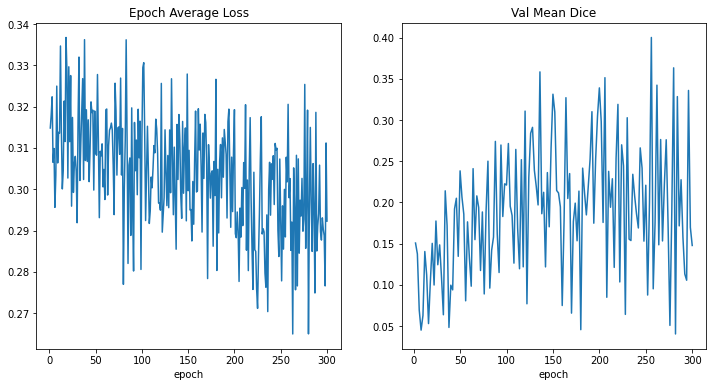

In [ ]:
plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Epoch Average Loss")
x = [i + 1 for i in range(len(epoch_loss_values))]
y = epoch_loss_values
plt.xlabel("epoch")
plt.plot(x, y)
plt.subplot(1, 2, 2)
plt.title("Val Mean Dice")
x = [valid_interval * (i + 1) for i in range(len(metric_values))]
y = metric_values
plt.xlabel("epoch")
plt.plot(x, y)
plt.show()

## Report

---



A pipeline of 3D segmentation algorithms based on VNet as a model and a generalised sieve loss function as a loss function was constructed using the MONAI open source library for the "liver tumour" task.

The 131 CT scans in imagesTr were first divided into training and test data.Then, set up deterministic training for repeatability and set up transitions for training and validation. Using the MONAI open source database of LoadImaged, EnsureChannelFirstd, Orientationd, Spacingd, ScaleIntensityRanged, CropForegroundd, RandCropByPosNegLabeld and RandAffined transformations are used to augment the dataset. Load liver CT images and labels from NIfTI format files. Ensure that the raw data constructs a 'channel-first' shape and unifies the data orientation on the basis of the bionic matrix. Adjust the spacing based on the bionic matrix by pixdim=(1.5, 1.5, 1.). The intensity range [-200, 200] was extracted and scaled to [0, 1]. Also remove all zero borders to focus on the effective subject area of the image and label. Randomly crop patch samples from large images based on pos/neg ratios. where the negative samples must have the centre of the image in the valid subject area. For subsequent applications of data enhancement techniques, the PyTorch-based affine transform is retained.

For the use of datasets, I used the CacheDataset and DataLoader from the MONAI database for training and validation. Because the CacheDataset is used to speed up the training and validation process, it is 10 times faster than a normal dataset. For best performance, I set cache_rate to 1.0 to cache all the data. The num_workers setting is to enable multithreading during caching. I use the VNet model as the backbone network to solve this task, and for the loss function I use the Generalised Dice Score function. For the optimizer, I use the Adam optimizer.

The training loop iterated through a maximum of 300 epochs. For each epoch, the model's weights were updated using the optimizer based on the calculated loss. The training loss values were recorded for each epoch. Model evaluation occurred every 2 epochs (as determined by the val_interval parameter), using the validation dataset. During the validation phase, the model's performance was evaluated using sliding window inference, which processes the input image in smaller patches to generate predictions. The Dice metric (excluding the background) was used to assess the model's segmentation performance. The best metric value and its corresponding epoch were tracked throughout the training process, and the model with the best metric was saved as best_metric_model.pth.

After 300 epochs, the best metric is 0.4001 at epoch 256. Based on the results, the segmentation algorithm pipeline is performing as expected, with training losses converging gradually and the model gradually learning the data and predicting it, but the model may be over-fitted.

# **Data Enhancement**

---

Use MONAI's built-in transformers to add noise, contrast, and elastic deformation transformations to my data augmentation pipeline










In [ ]:
from monai.transforms import RandGaussianNoised, RandAdjustContrastd, Rand3DElasticd

In [ ]:
# Applying random Gaussian noise, contrast adjustment, and 3D elastic deformation for data augmentation
train_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        EnsureChannelFirstd(keys=["image", "label"]),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-200,
            a_max=200,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(keys=["image", "label"], pixdim=(1.5, 1.5, 1.0), mode=("bilinear", "nearest")),

        RandGaussianNoised(keys=["image"], prob=0.05, std=0.1),  # Add Gaussian noise to the image with a probability of 0.05 and a standard deviation of 0.1
        RandAdjustContrastd(keys=["image"], prob=0.05, gamma=(0.9, 1.0)),  # Randomly adjust the contrast of the image with a probability of 0.05 and a gamma value range of [0.9, 1.0]
        Rand3DElasticd(
            keys=["image", "label"],
            prob=0.05,
            sigma_range=(4, 5),
            magnitude_range=(50, 80),
            rotate_range=(0, 0, np.pi / 30),
            mode=("bilinear", "nearest"),
            padding_mode="border",
        ), # Apply elastic deformation to the image and label with a probability of 0.05

        RandCropByPosNegLabeld(
            keys=["image", "label"],
            label_key="label",
            spatial_size=(128, 128, 64),
            pos=1,
            neg=1,
            num_samples=1,
            image_key="image",
            image_threshold=0,
        ),
    ]
)

In [ ]:
# valid transforms remains the same
valid_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        EnsureChannelFirstd(keys=["image", "label"]),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-200,
            a_max=200,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(keys=["image", "label"], pixdim=(1.5, 1.5, 1.0), mode=("bilinear", "nearest")),
    ]
)

In [ ]:
# Define CacheDataset and DataLoader for training and validation
train_ds = CacheDataset(data=train_files, transform=train_transforms, cache_rate=1.0, num_workers=4) # set cache_rate=1.0 to cache all the data

# Use batch_size=2 to load images and use RandCropByPosNegLabeld to generate 2 x 1 images for network training
train_loader = DataLoader(train_ds, batch_size=2, shuffle=True, num_workers=4)

valid_ds = CacheDataset(data=valid_files, transform=valid_transforms, cache_rate=1.0, num_workers=4)
valid_loader = DataLoader(valid_ds, batch_size=1, num_workers=4)

Loading dataset: 100%|██████████| 19/19 [01:26<00:00,  4.56s/it]


## Train

---



In [ ]:
# Train again
# Set the number of maximum epochs to 300 and the validation interval to 2
max_epochs = 300
valid_interval = 2

# Keep track of the best metric value and its corresponding epoch
best_metric = -1
best_metric_epoch = -1

# Store epoch loss values and metric values
epoch_loss_values = []
metric_values = []

# Process the model's output and ground truth labels
pred = Compose([AsDiscrete(argmax=True, to_onehot=3)])
label = Compose([AsDiscrete(to_onehot=3)])

for epoch in range(max_epochs):
    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")

    # Set the model to training mode
    model.train()

    # Initializes the epoch loss and step
    epoch_loss = 0
    step = 0

    # Iterate through the training data loader
    for batch_data in train_loader:
        step += 1
        inputs, labels = (
            batch_data["image"].to(device),
            batch_data["label"].to(device),
        )

        # Forward pass
        optimizer.zero_grad()
        outputs = model(inputs)

        # Calculate the loss
        loss = loss_fn(outputs, labels)
        loss.backward()

        # Update the model's weights using the optimizer
        optimizer.step()

        epoch_loss += loss.item()
        print(f"{step}/{len(train_ds) // train_loader.batch_size}, " f"train_loss: {loss.item():.4f}")

    # Calculate the average epoch loss and appends it to the epoch_loss_values list
    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}")

    # If the current epoch is a validation epoch, it sets the model to evaluation mode
    if (epoch + 1) % valid_interval == 0:
        model.eval()
        with torch.no_grad():
            for valid_data in valid_loader:
                valid_inputs, valid_labels = (
                    valid_data["image"].to(device),
                    valid_data["label"].to(device),
                )

                # Representing the size of the sliding window to generate predictions for each patch
                roi_size = (128, 128, 64)

                # Representing the batch size for sliding window inference
                sw_batch_size = 4

                # Performs inference on the validation dataset using sliding_window_inference
                valid_outputs = sliding_window_inference(valid_inputs, roi_size, sw_batch_size, model)

                # Calculate the Dice metric for the model's predictions
                valid_outputs = [pred(i) for i in decollate_batch(valid_outputs)]
                valid_labels = [label(i) for i in decollate_batch(valid_labels)]
                # compute metric for current iteration
                dice_score(y_pred=valid_outputs, y=valid_labels)

            # aggregate the final mean dice result
            metric = dice_score.aggregate().item()
            # reset the status for next validation round
            dice_score.reset()

            # Update the best metric and its corresponding epoch if necessary
            metric_values.append(metric)
            if metric > best_metric:
                best_metric = metric
                best_metric_epoch = epoch + 1

                #  Save the model with the best metric
                torch.save(model.state_dict(), os.path.join(root_dir, "best_metric_model2.pth"))
                print("saved new best metric model")
            print(
                f"current epoch: {epoch + 1} current mean dice: {metric:.4f}"
                f"\nbest mean dice: {best_metric:.4f} "
                f"at epoch: {best_metric_epoch}"
            )

流式输出内容被截断，只能显示最后 5000 行内容。
35/35, train_loss: 0.3791
epoch 172 average loss: 0.1949
current epoch: 172 current mean dice: 0.3163
best mean dice: 0.5665 at epoch: 148
----------
epoch 173/300
1/35, train_loss: 0.1935
2/35, train_loss: 0.4051
3/35, train_loss: 0.1880
4/35, train_loss: 0.1435
5/35, train_loss: 0.1809
6/35, train_loss: 0.0817
7/35, train_loss: 0.0529
8/35, train_loss: 0.2018
9/35, train_loss: 0.2102
10/35, train_loss: 0.1045
11/35, train_loss: 0.1859
12/35, train_loss: 0.2864
13/35, train_loss: 0.3622
14/35, train_loss: 0.0939
15/35, train_loss: 0.0220
16/35, train_loss: 0.1001
17/35, train_loss: 0.0480
18/35, train_loss: 0.2718
19/35, train_loss: 0.1134
20/35, train_loss: 0.1352
21/35, train_loss: 0.1871
22/35, train_loss: 0.2663
23/35, train_loss: 0.4615
24/35, train_loss: 0.0670
25/35, train_loss: 0.1793
26/35, train_loss: 0.3477
27/35, train_loss: 0.4455
28/35, train_loss: 0.0375
29/35, train_loss: 0.0270
30/35, train_loss: 0.1004
31/35, train_loss: 0.3229
32/35, train

In [ ]:
print(f"train completed, best_metric: {best_metric:.4f} " f"at epoch: {best_metric_epoch}")

train completed, best_metric: 0.6320 at epoch: 296


## **Test**

---



In [ ]:
test_images = sorted(glob.glob(os.path.join(data_dir, "Test/imagesTr", "*.nii.gz")))

test_data = [{"image": image} for image in test_images]

test_org_transforms = Compose(
    [
        LoadImaged(keys="image"),
        EnsureChannelFirstd(keys="image"),
        Orientationd(keys=["image"], axcodes="RAS"),
        Spacingd(keys=["image"], pixdim=(1.5, 1.5, 1.0), mode="bilinear"),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-200,
            a_max=200,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image"], source_key="image"),
    ]
)

test_org_ds = Dataset(data=test_data, transform=test_org_transforms)
# test_org_ds = CacheDataset(data=test_data, transform=test_org_transforms, cache_rate=1.0, num_workers=4)

test_org_loader = DataLoader(test_org_ds, batch_size=1, num_workers=4)

post_transforms = Compose(
    [
        Invertd(
            keys="pred",
            transform=test_org_transforms,
            orig_keys="image",
            meta_keys="pred_meta_dict",
            orig_meta_keys="image_meta_dict",
            meta_key_postfix="meta_dict",
            nearest_interp=False,
            to_tensor=True,
        ),
        AsDiscreted(keys="pred", argmax=True, to_onehot=3),
        SaveImaged(keys="pred", meta_keys="pred_meta_dict", output_dir="./out", output_postfix="seg", resample=False),
    ]
)

2023-03-25 22:26:51,109 INFO image_writer.py:194 - writing: out/liver_0/liver_0_seg.nii.gz


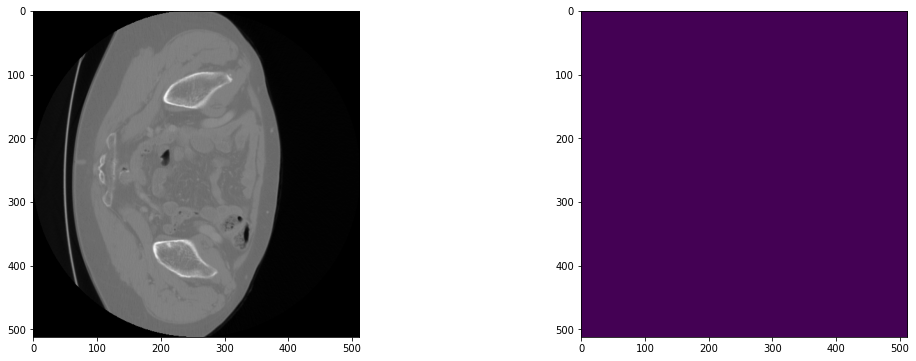

2023-03-25 22:26:57,532 INFO image_writer.py:194 - writing: out/liver_100/liver_100_seg.nii.gz


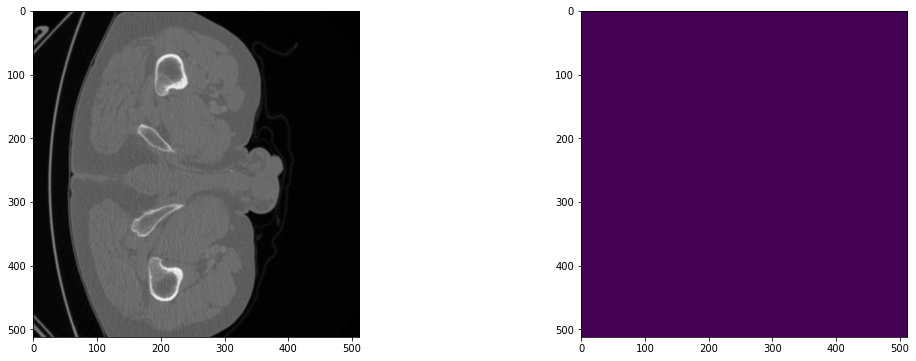

2023-03-25 22:27:39,481 INFO image_writer.py:194 - writing: out/liver_103/liver_103_seg.nii.gz


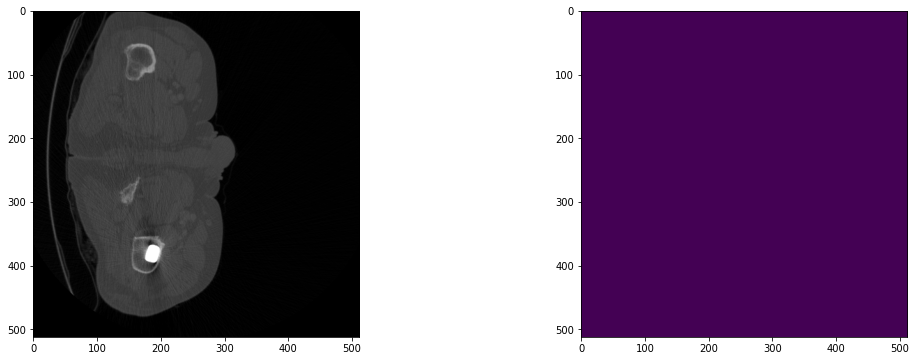

2023-03-25 22:28:22,060 INFO image_writer.py:194 - writing: out/liver_104/liver_104_seg.nii.gz


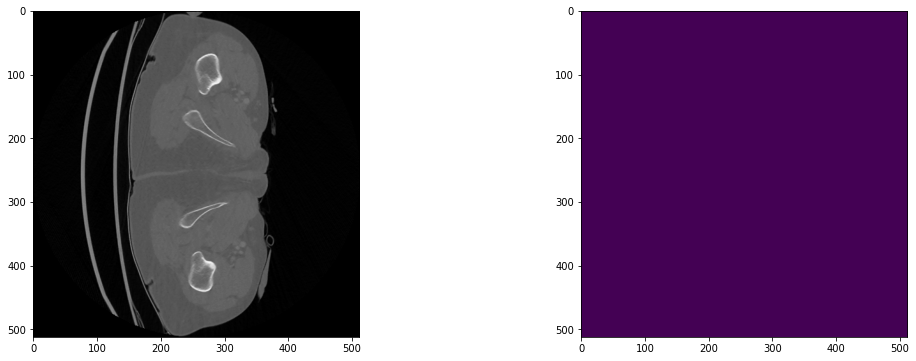

2023-03-25 22:29:08,873 INFO image_writer.py:194 - writing: out/liver_106/liver_106_seg.nii.gz


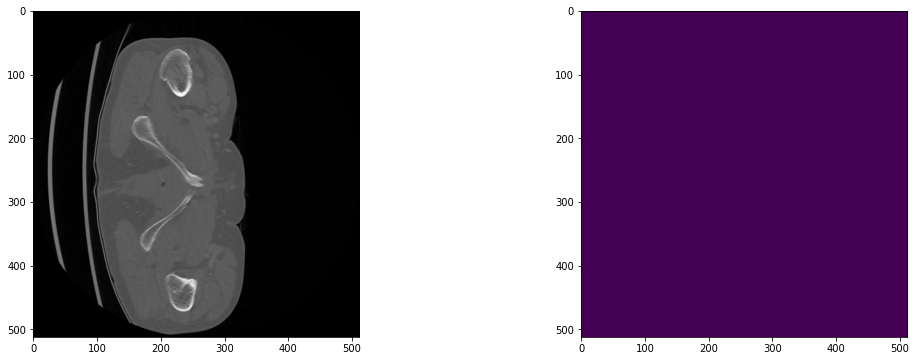

2023-03-25 22:29:56,229 INFO image_writer.py:194 - writing: out/liver_111/liver_111_seg.nii.gz


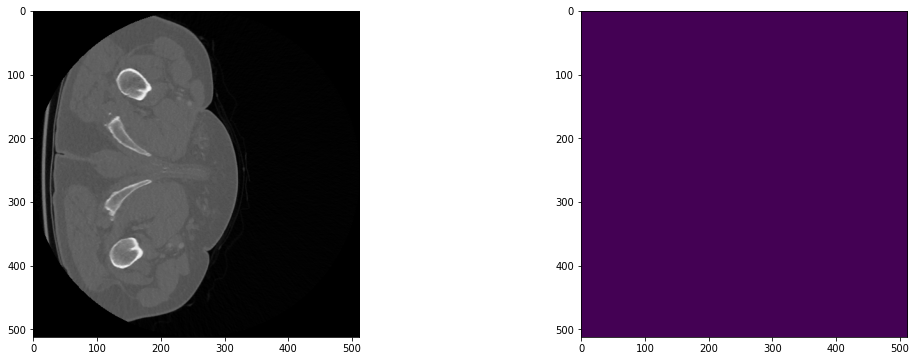

2023-03-25 22:30:43,936 INFO image_writer.py:194 - writing: out/liver_113/liver_113_seg.nii.gz


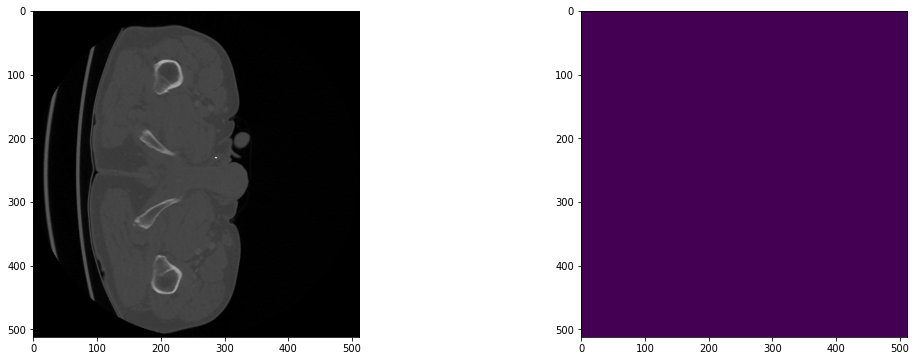

2023-03-25 22:31:33,885 INFO image_writer.py:194 - writing: out/liver_117/liver_117_seg.nii.gz


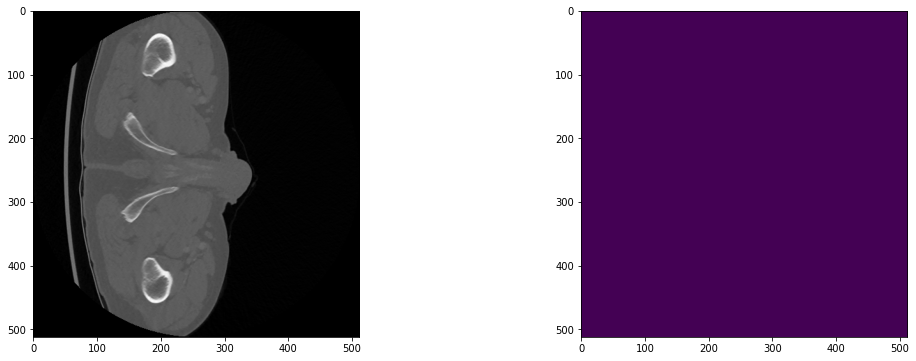

2023-03-25 22:32:25,639 INFO image_writer.py:194 - writing: out/liver_119/liver_119_seg.nii.gz


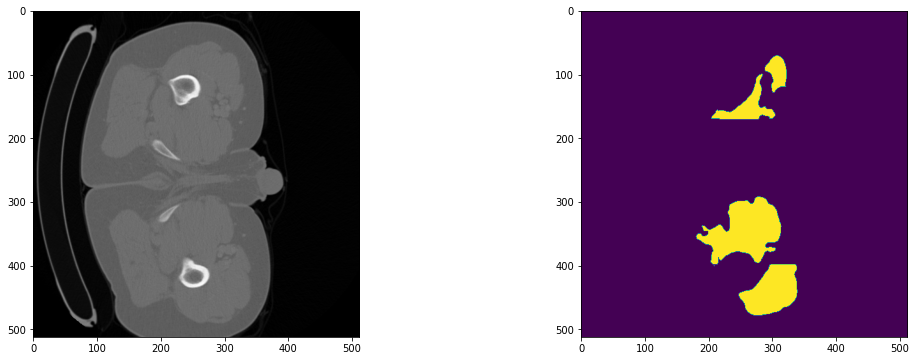

2023-03-25 22:32:53,817 INFO image_writer.py:194 - writing: out/liver_120/liver_120_seg.nii.gz


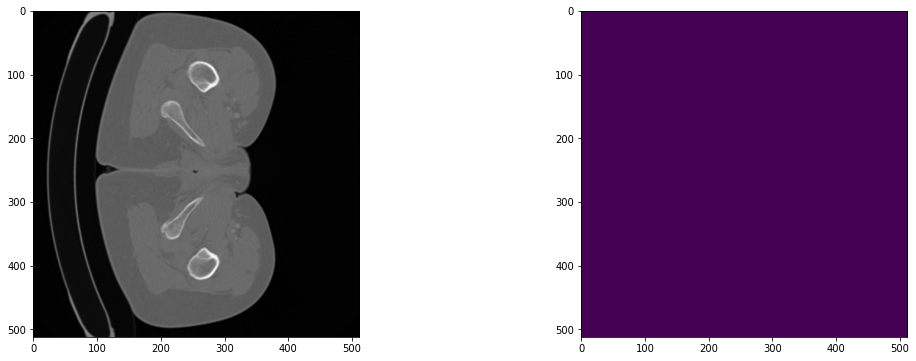

2023-03-25 22:33:19,764 INFO image_writer.py:194 - writing: out/liver_125/liver_125_seg.nii.gz


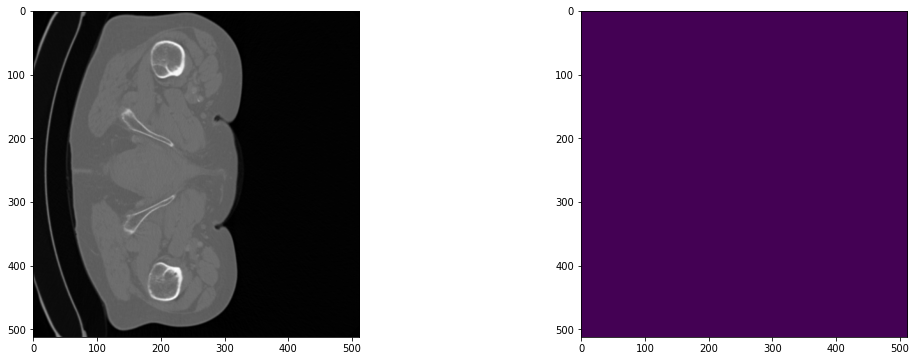

2023-03-25 22:33:45,396 INFO image_writer.py:194 - writing: out/liver_127/liver_127_seg.nii.gz


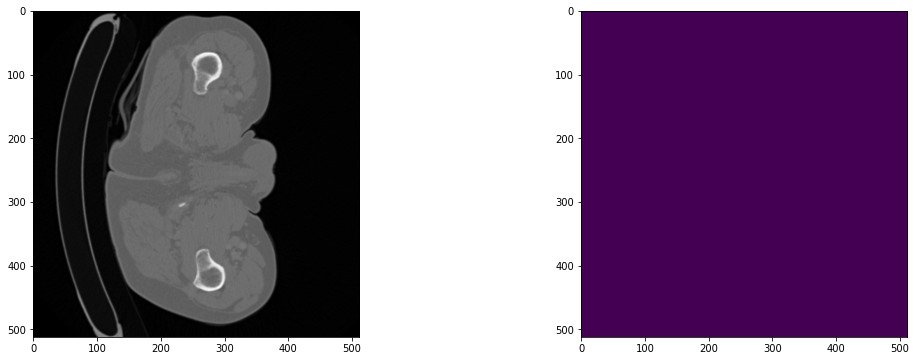

2023-03-25 22:34:44,966 INFO image_writer.py:194 - writing: out/liver_128/liver_128_seg.nii.gz


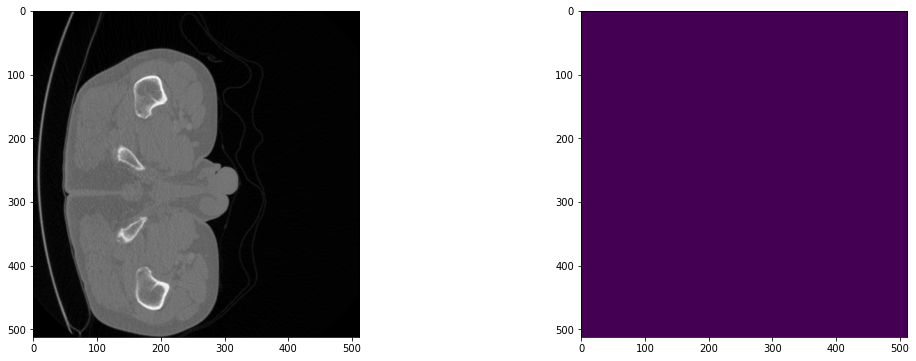

2023-03-25 22:35:24,500 INFO image_writer.py:194 - writing: out/liver_129/liver_129_seg.nii.gz


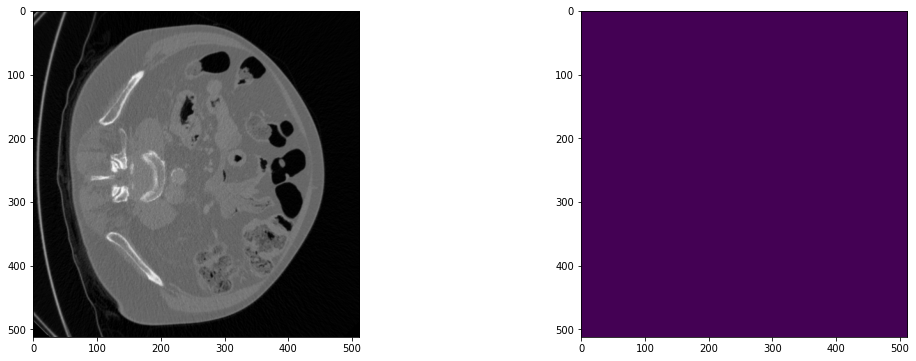

2023-03-25 22:35:46,218 INFO image_writer.py:194 - writing: out/liver_14/liver_14_seg.nii.gz


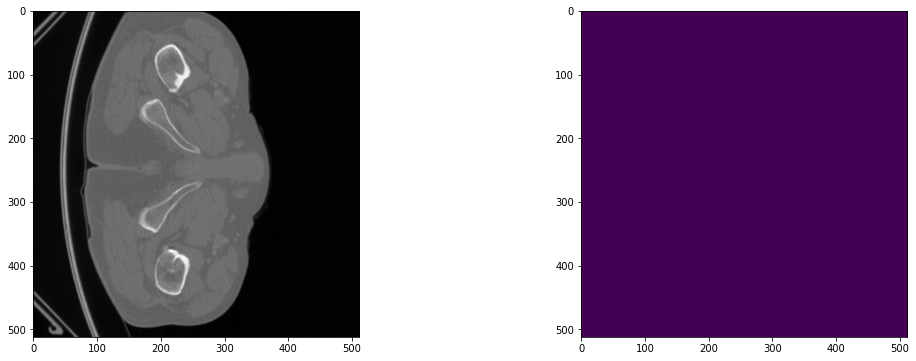

2023-03-25 22:36:22,543 INFO image_writer.py:194 - writing: out/liver_17/liver_17_seg.nii.gz


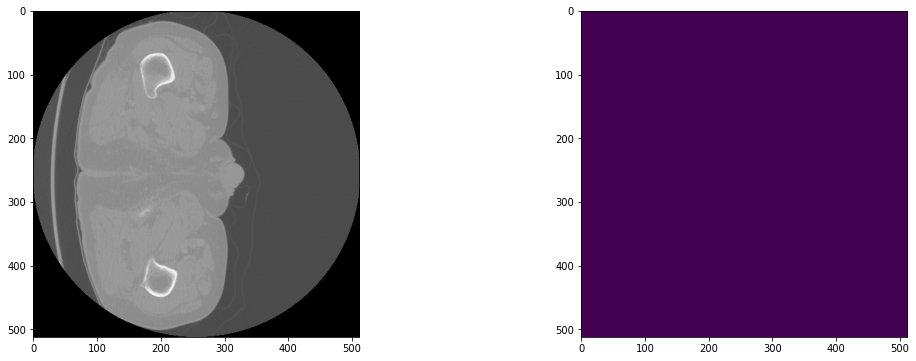

2023-03-25 22:37:13,301 INFO image_writer.py:194 - writing: out/liver_2/liver_2_seg.nii.gz


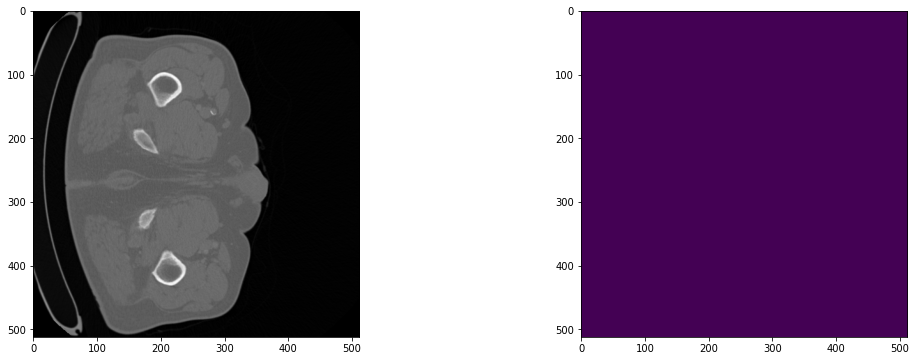

2023-03-25 22:37:44,099 INFO image_writer.py:194 - writing: out/liver_21/liver_21_seg.nii.gz


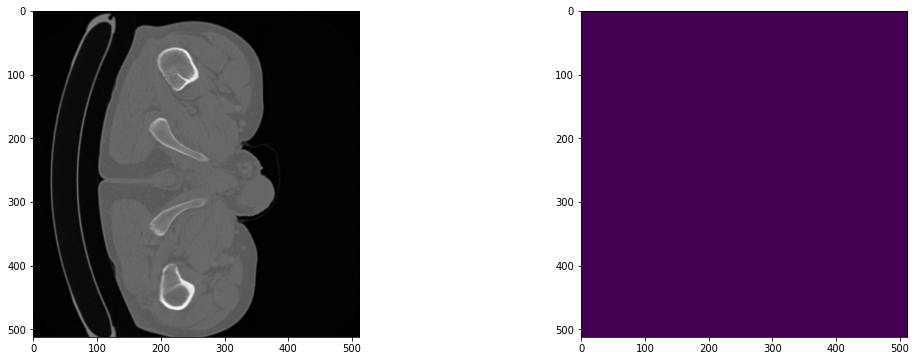

2023-03-25 22:38:09,835 INFO image_writer.py:194 - writing: out/liver_24/liver_24_seg.nii.gz


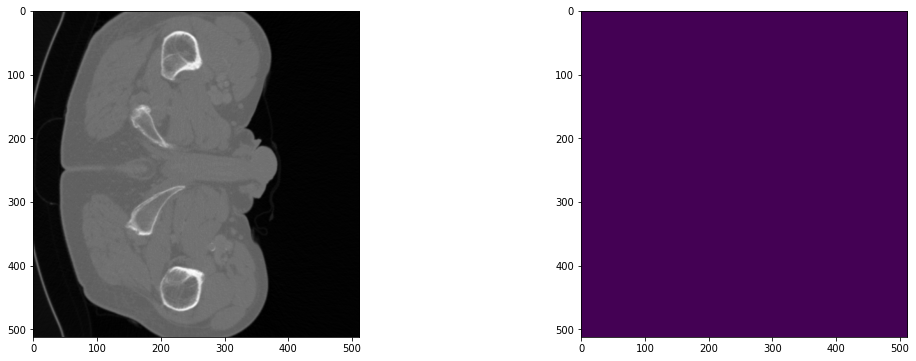

2023-03-25 22:38:27,024 INFO image_writer.py:194 - writing: out/liver_27/liver_27_seg.nii.gz


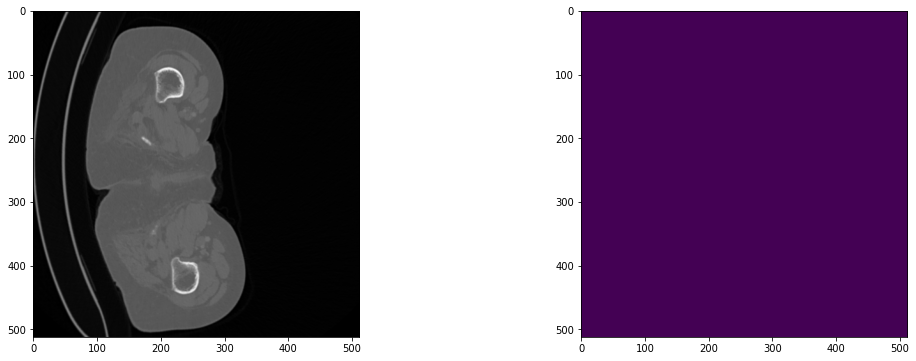

2023-03-25 22:39:18,870 INFO image_writer.py:194 - writing: out/liver_30/liver_30_seg.nii.gz


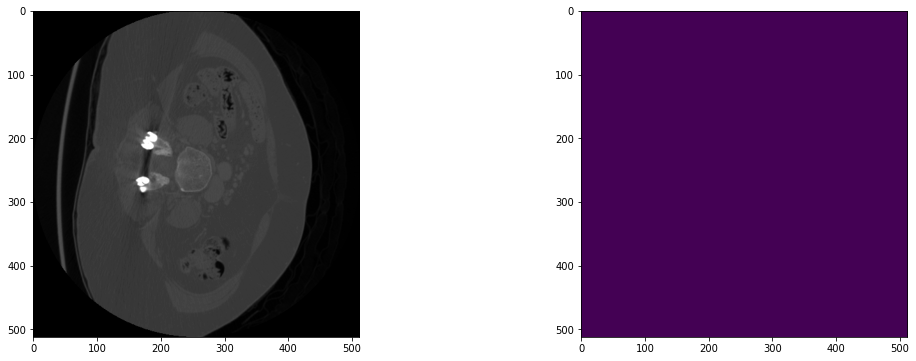

2023-03-25 22:39:29,998 INFO image_writer.py:194 - writing: out/liver_32/liver_32_seg.nii.gz


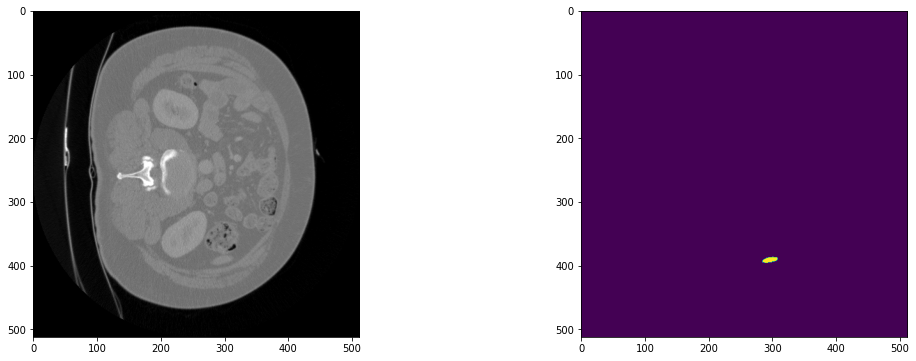

2023-03-25 22:39:38,033 INFO image_writer.py:194 - writing: out/liver_34/liver_34_seg.nii.gz


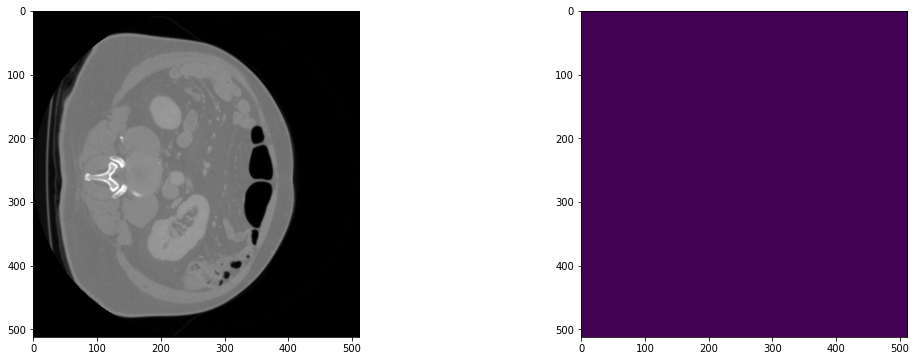

2023-03-25 22:39:46,796 INFO image_writer.py:194 - writing: out/liver_35/liver_35_seg.nii.gz


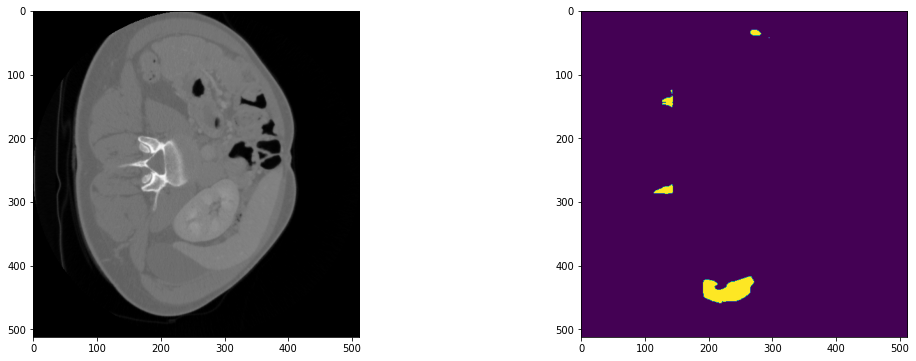

2023-03-25 22:39:53,811 INFO image_writer.py:194 - writing: out/liver_36/liver_36_seg.nii.gz


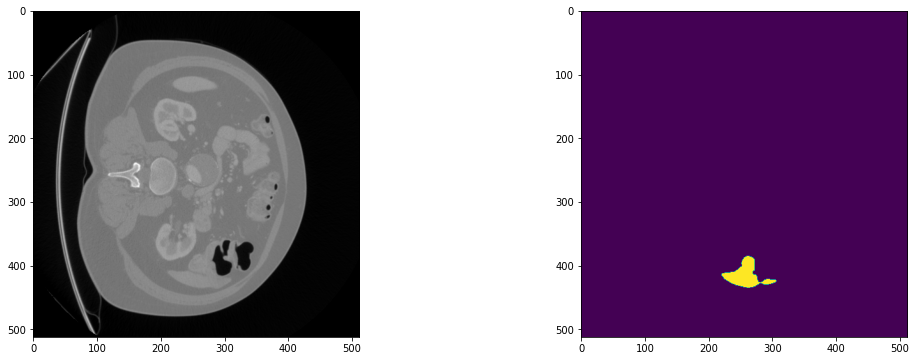

2023-03-25 22:40:00,418 INFO image_writer.py:194 - writing: out/liver_37/liver_37_seg.nii.gz


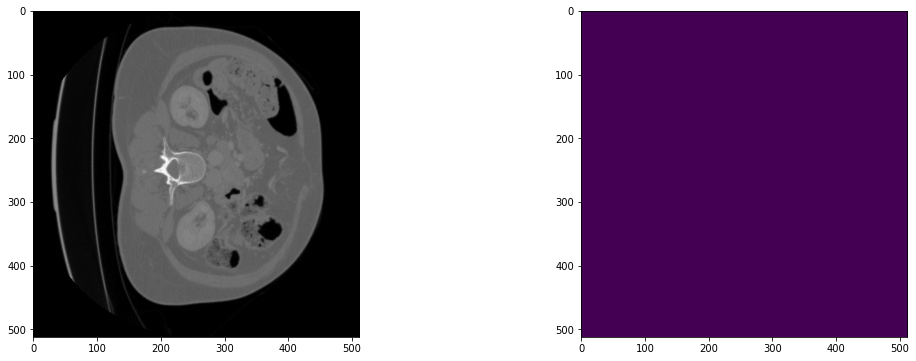

2023-03-25 22:40:07,719 INFO image_writer.py:194 - writing: out/liver_38/liver_38_seg.nii.gz


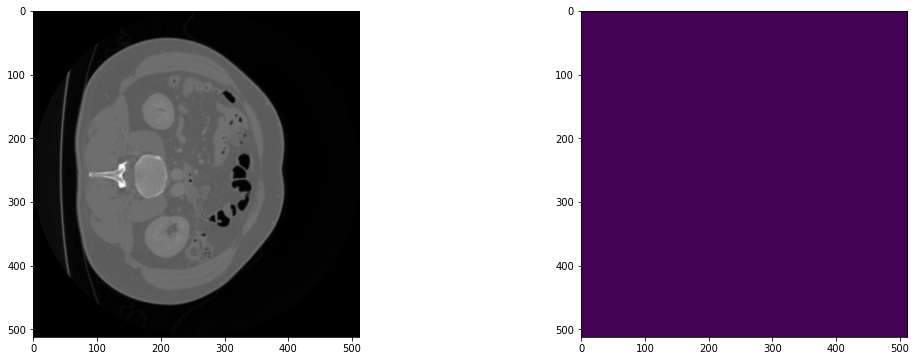

2023-03-25 22:40:15,113 INFO image_writer.py:194 - writing: out/liver_42/liver_42_seg.nii.gz


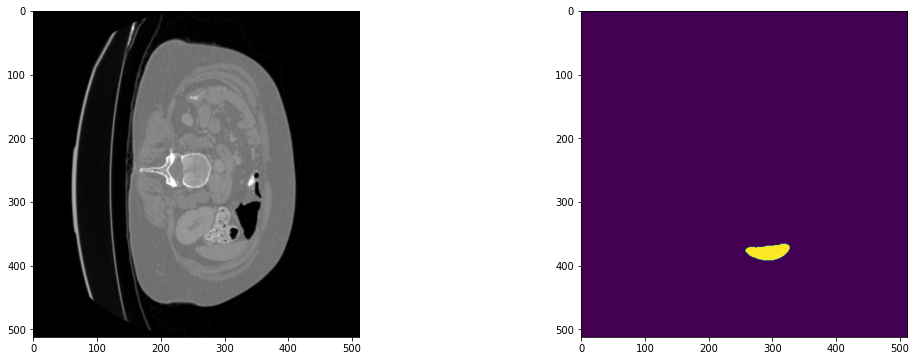

2023-03-25 22:40:22,375 INFO image_writer.py:194 - writing: out/liver_44/liver_44_seg.nii.gz


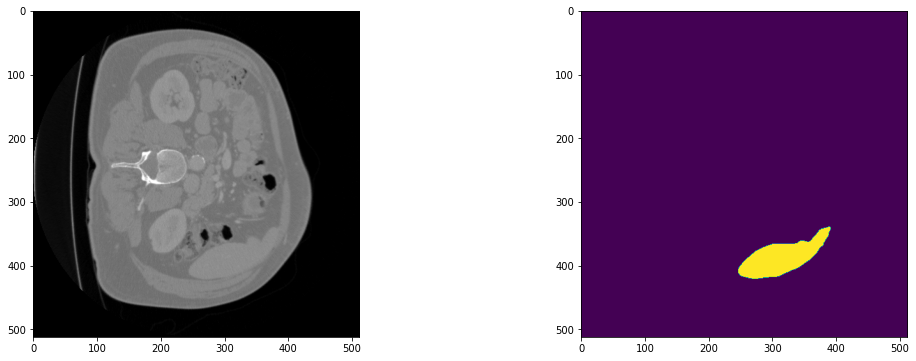

2023-03-25 22:40:31,202 INFO image_writer.py:194 - writing: out/liver_50/liver_50_seg.nii.gz


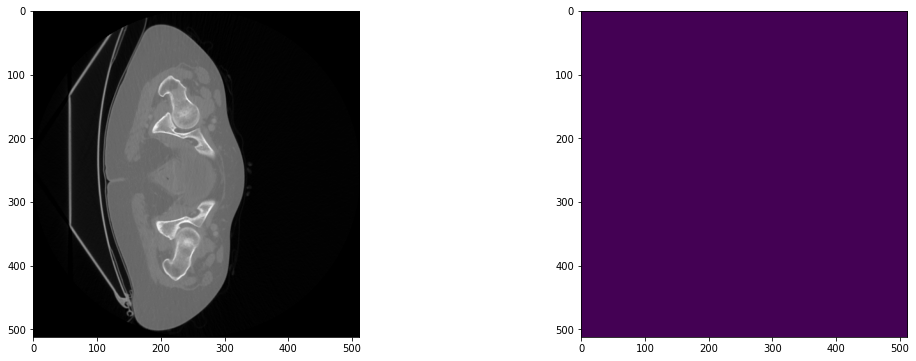

2023-03-25 22:40:45,379 INFO image_writer.py:194 - writing: out/liver_57/liver_57_seg.nii.gz


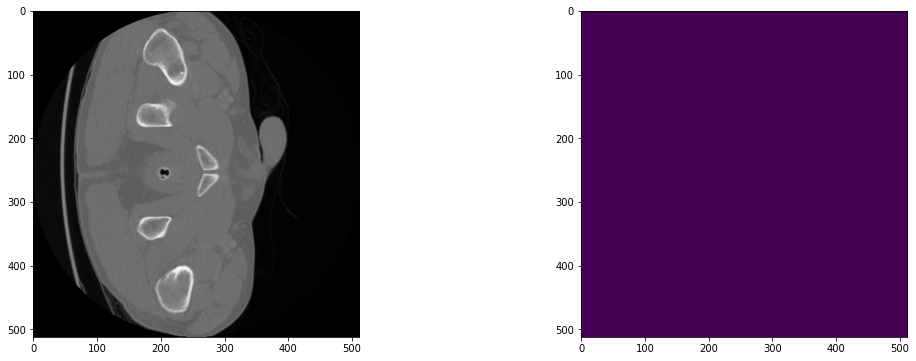

2023-03-25 22:41:07,571 INFO image_writer.py:194 - writing: out/liver_65/liver_65_seg.nii.gz


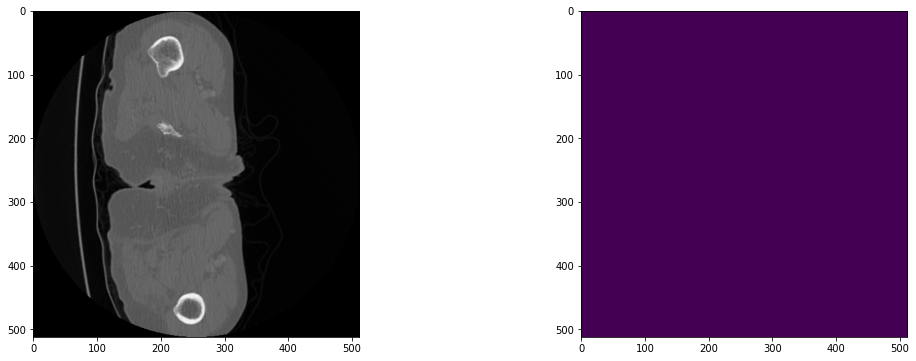

2023-03-25 22:41:39,088 INFO image_writer.py:194 - writing: out/liver_75/liver_75_seg.nii.gz


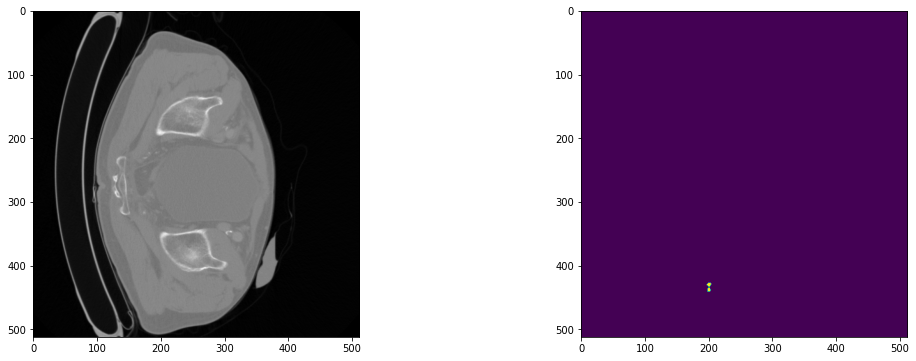

2023-03-25 22:41:45,576 INFO image_writer.py:194 - writing: out/liver_76/liver_76_seg.nii.gz


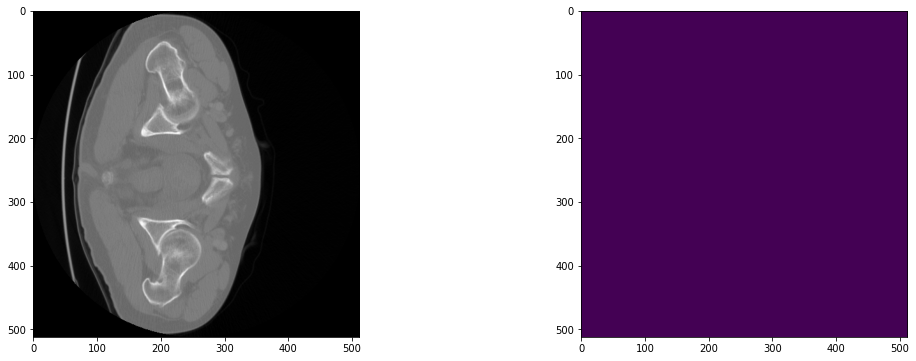

2023-03-25 22:41:56,984 INFO image_writer.py:194 - writing: out/liver_79/liver_79_seg.nii.gz


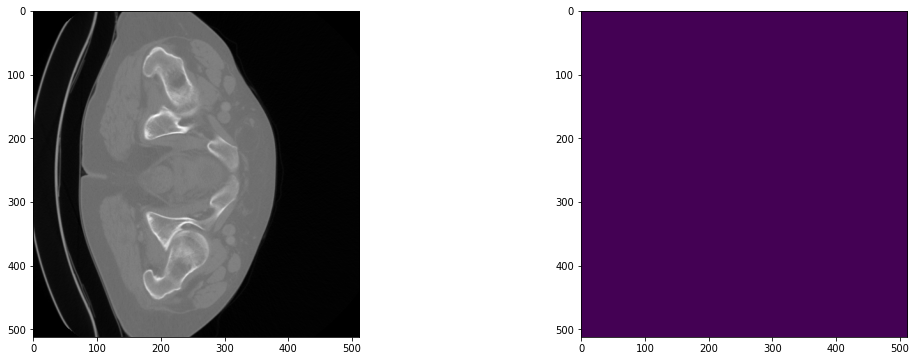

2023-03-25 22:42:07,558 INFO image_writer.py:194 - writing: out/liver_84/liver_84_seg.nii.gz


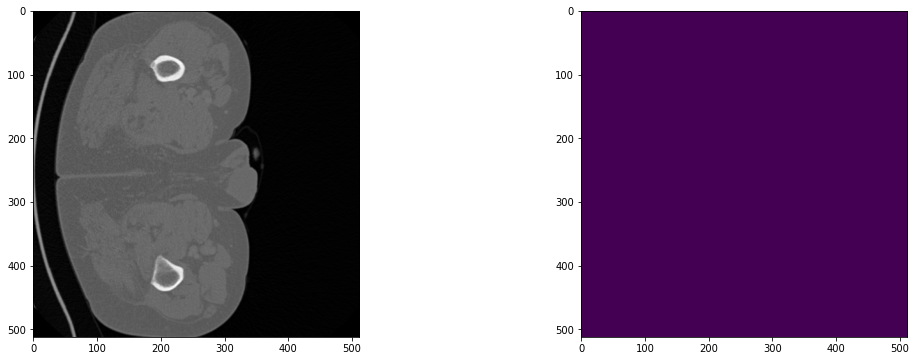

2023-03-25 22:42:52,125 INFO image_writer.py:194 - writing: out/liver_86/liver_86_seg.nii.gz


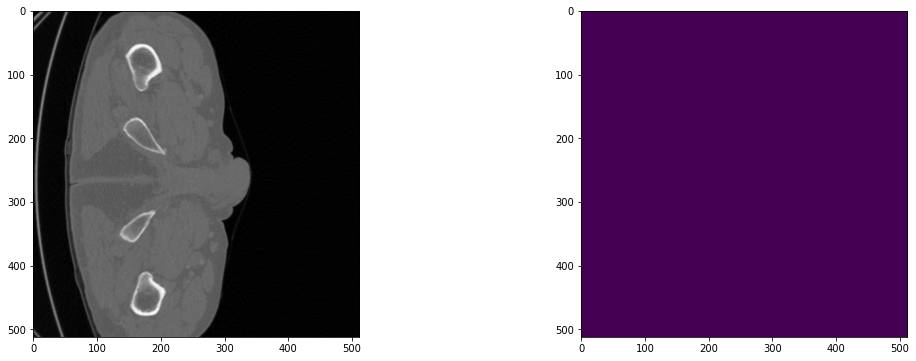

2023-03-25 22:43:33,655 INFO image_writer.py:194 - writing: out/liver_91/liver_91_seg.nii.gz


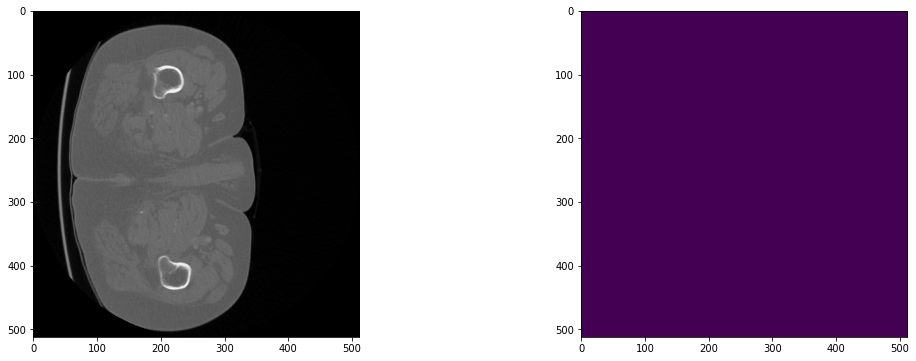

2023-03-25 22:44:20,426 INFO image_writer.py:194 - writing: out/liver_92/liver_92_seg.nii.gz


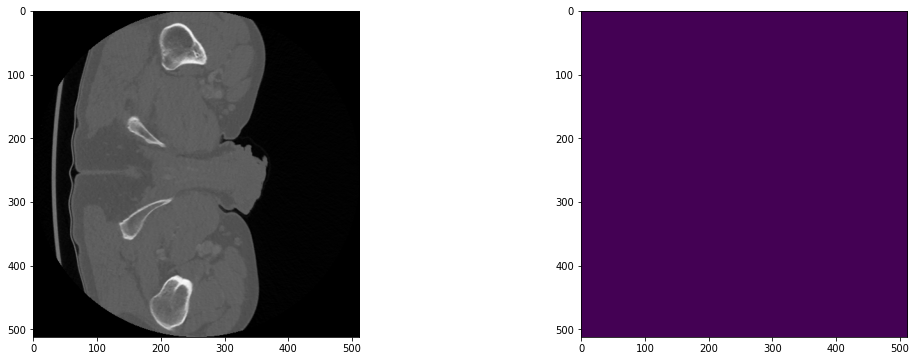

2023-03-25 22:45:12,847 INFO image_writer.py:194 - writing: out/liver_93/liver_93_seg.nii.gz


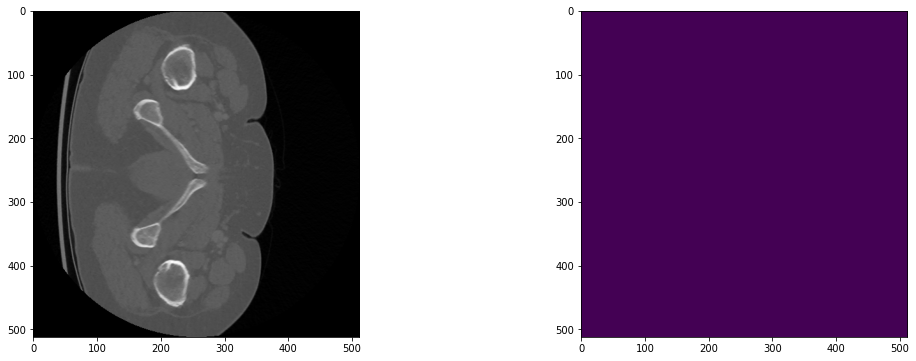

2023-03-25 22:45:55,049 INFO image_writer.py:194 - writing: out/liver_97/liver_97_seg.nii.gz


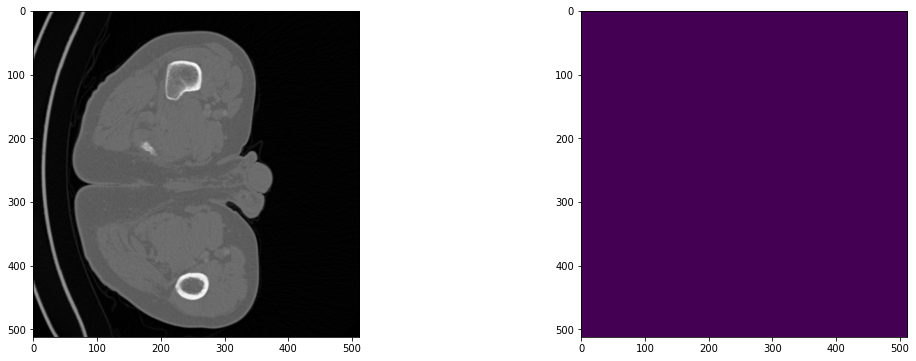

2023-03-25 22:46:37,050 INFO image_writer.py:194 - writing: out/liver_99/liver_99_seg.nii.gz


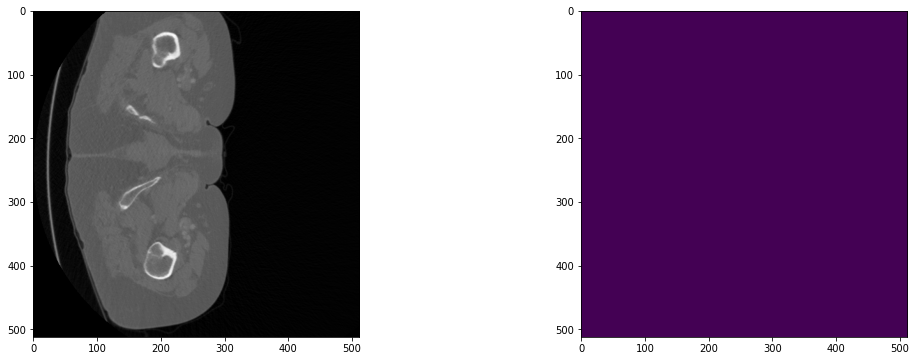

In [ ]:
# Test again
# liver category is represented by channel 0 and the tumor category is represented by channel 1
model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model2.pth")))
model.eval()

with torch.no_grad():
    for test_data in test_org_loader:
        test_inputs = test_data["image"].to(device)
        roi_size = (128, 128, 64)
        sw_batch_size = 4
        test_data["pred"] = sliding_window_inference(test_inputs, roi_size, sw_batch_size, model)

        test_data = [post_transforms(i) for i in decollate_batch(test_data)]

        # Visualize the predicted results
        test_output = from_engine(["pred"])(test_data)
        original_image = nib.load(test_output[0].meta["filename_or_obj"]).get_fdata()

        plt.figure("check", (18, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(original_image[:, :, 20], cmap="gray")
        plt.subplot(1, 2, 2)
        plt.imshow(test_output[0].detach().cpu()[1, :, :, 20])
        plt.show()

## **Report**

---



Since common data enhancement techniques already exist in the MONAI open source library, I directly invoke data enhancement techniques for Gaussian noise, contrast, and Elastic deformation.

RandGaussianNoised: Adds Gaussian noise to the image with a probability of 0.05 and a standard deviation of 0.1. This helps to simulate the noise present in real-world medical images, which can improve the robustness of the model.

RandAdjustContrastd: Randomly adjusts the contrast of the image with a probability of 0.05 and a gamma value range of [0.9, 1.0]. This helps to simulate the variability in contrast present in real-world medical images, which can also improve the robustness of the model.

Rand3DElasticd: Applies elastic deformation to the image and label with a probability of 0.05. Elastic deformation simulates the tissue deformation that can occur during medical imaging and can help the model to better capture variations in the shape and size of structures in the image.

By using these data augmentation techniques, the model is exposed to a wider range of variations in the input data, which can improve its generalization performance and help it to better adapt to new and unseen data.After 300 epochs, it was found that the best dice score was obtained at epoch 296 for 0.6320. This is a better performance of the model compared to previous training without the use of data enhancement techniques, rising from a best dice score of 0.4001 to 0.6320, indicating that the training process is more robust to against overfitting and generalize better to unseen data. In tests, the generation of prediction maps worked well.

# **Optimise**

---



In [ ]:
# Define CacheDataset and DataLoader for training and validation
train_ds = CacheDataset(data=train_files, transform=train_transforms, cache_rate=1.0, num_workers=4) # set cache_rate=1.0 to cache all the data

# Use batch_size=2 to load images and use RandCropByPosNegLabeld to generate 2 x 4 images for network training
train_loader = DataLoader(train_ds, batch_size=2, shuffle=True, num_workers=4)

valid_ds = CacheDataset(data=valid_files, transform=valid_transforms, cache_rate=1.0, num_workers=4)
valid_loader = DataLoader(valid_ds, batch_size=1, num_workers=4)

Loading dataset: 100%|██████████| 19/19 [01:34<00:00,  4.96s/it]


In [ ]:
# Set the device to GPU
device = torch.device("cuda:0")

# Implement the VNet model and Change the dropout rate to 0.5
model = VNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=3,
    dropout_prob=0.5,
).to(device)

# Implements the GeneralizedDiceLoss function from MONAI,
# which is set to calculate the loss using one-hot encoded ground truth labels and softmax probabilities
loss_fn = GeneralizedDiceLoss(to_onehot_y=True, softmax=True)

# Initializes the Adam optimizer with a learning rate of 1e-4 for model training
optimizer = torch.optim.Adam(model.parameters(), 1e-4)

# Implements the DiceMetric from MONAI,
# which excludes the background and takes the mean of the dice scores for evaluation
dice_score = DiceMetric(include_background=False, reduction="mean")

## **Train**

---



In [ ]:
# The training process after optimising
max_epochs = 600
valid_interval = 2

# Keep track of the best metric value and its corresponding epoch
best_metric = -1
best_metric_epoch = -1

# Store epoch loss values and metric values
epoch_loss_values = []
metric_values = []

# Process the model's output and ground truth labels
pred = Compose([AsDiscrete(argmax=True, to_onehot=3)])
label = Compose([AsDiscrete(to_onehot=3)])

for epoch in range(max_epochs):
    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")

    # Set the model to training mode
    model.train()

    # Initializes the epoch loss and step
    epoch_loss = 0
    step = 0

    # Iterate through the training data loader
    for batch_data in train_loader:
        step += 1
        inputs, labels = (
            batch_data["image"].to(device),
            batch_data["label"].to(device),
        )

        # Forward pass
        optimizer.zero_grad()
        outputs = model(inputs)

        # Calculate the loss
        loss = loss_fn(outputs, labels)
        loss.backward()

        # Update the model's weights using the optimizer
        optimizer.step()

        epoch_loss += loss.item()
        print(f"{step}/{len(train_ds) // train_loader.batch_size}, " f"train_loss: {loss.item():.4f}")

    # Calculate the average epoch loss and appends it to the epoch_loss_values list
    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}")

    # If the current epoch is a validation epoch, it sets the model to evaluation mode
    if (epoch + 1) % valid_interval == 0:
        model.eval()
        with torch.no_grad():
            for valid_data in valid_loader:
                valid_inputs, valid_labels = (
                    valid_data["image"].to(device),
                    valid_data["label"].to(device),
                )

                # Representing the size of the sliding window to generate predictions for each patch
                roi_size = (128, 128, 64)

                # Representing the batch size for sliding window inference
                sw_batch_size = 4

                # Performs inference on the validation dataset using sliding_window_inference
                valid_outputs = sliding_window_inference(valid_inputs, roi_size, sw_batch_size, model)

                # Calculate the Dice metric for the model's predictions
                valid_outputs = [pred(i) for i in decollate_batch(valid_outputs)]
                valid_labels = [label(i) for i in decollate_batch(valid_labels)]
                # compute metric for current iteration
                dice_score(y_pred=valid_outputs, y=valid_labels)

            # aggregate the final mean dice result
            metric = dice_score.aggregate().item()
            # reset the status for next validation round
            dice_score.reset()

            # Update the best metric and its corresponding epoch if necessary
            metric_values.append(metric)
            if metric > best_metric:
                best_metric = metric
                best_metric_epoch = epoch + 1

                #  Save the model with the best metric
                torch.save(model.state_dict(), os.path.join(root_dir, "best_metric_model3.pth"))
                print("saved new best metric model")
            print(
                f"current epoch: {epoch + 1} current mean dice: {metric:.4f}"
                f"\nbest mean dice: {best_metric:.4f} "
                f"at epoch: {best_metric_epoch}"
            )

流式输出内容被截断，只能显示最后 5000 行内容。
33/35, train_loss: 0.0339
34/35, train_loss: 0.1238
35/35, train_loss: 0.1292
epoch 472 average loss: 0.0824
current epoch: 472 current mean dice: 0.6759
best mean dice: 0.7294 at epoch: 466
----------
epoch 473/600
1/35, train_loss: 0.0338
2/35, train_loss: 0.0392
3/35, train_loss: 0.0650
4/35, train_loss: 0.1690
5/35, train_loss: 0.1280
6/35, train_loss: 0.0978
7/35, train_loss: 0.0735
8/35, train_loss: 0.0642
9/35, train_loss: 0.0459
10/35, train_loss: 0.0969
11/35, train_loss: 0.1331
12/35, train_loss: 0.0160
13/35, train_loss: 0.0762
14/35, train_loss: 0.0656
15/35, train_loss: 0.0117
16/35, train_loss: 0.1132
17/35, train_loss: 0.0326
18/35, train_loss: 0.1750
19/35, train_loss: 0.0812
20/35, train_loss: 0.0439
21/35, train_loss: 0.0866
22/35, train_loss: 0.0827
23/35, train_loss: 0.0593
24/35, train_loss: 0.1222
25/35, train_loss: 0.0660
26/35, train_loss: 0.2145
27/35, train_loss: 0.0614
28/35, train_loss: 0.0584
29/35, train_loss: 0.0924
30/35, train

In [ ]:
print(f"train completed, best_metric: {best_metric:.4f} " f"at epoch: {best_metric_epoch}")

train completed, best_metric: 0.7358 at epoch: 588


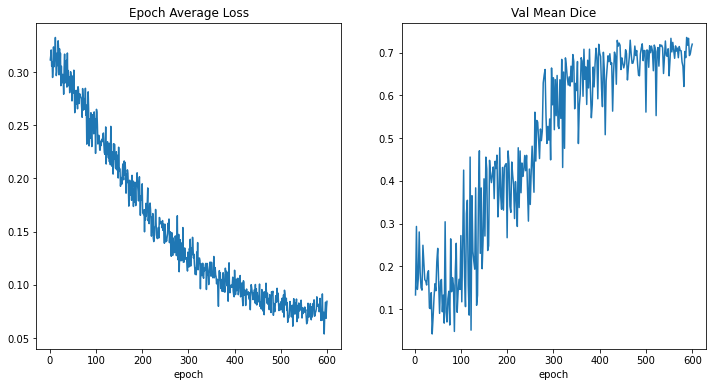

In [ ]:
plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Epoch Average Loss")
x = [i + 1 for i in range(len(epoch_loss_values))]
y = epoch_loss_values
plt.xlabel("epoch")
plt.plot(x, y)
plt.subplot(1, 2, 2)
plt.title("Val Mean Dice")
x = [valid_interval * (i + 1) for i in range(len(metric_values))]
y = metric_values
plt.xlabel("epoch")
plt.plot(x, y)
plt.show()

## **Test**

---



In [ ]:
test_images = sorted(glob.glob(os.path.join(data_dir, "Test/imagesTr", "*.nii.gz")))

test_data = [{"image": image} for image in test_images]

test_org_transforms = Compose(
    [
        LoadImaged(keys="image"),
        EnsureChannelFirstd(keys="image"),
        Orientationd(keys=["image"], axcodes="RAS"),
        Spacingd(keys=["image"], pixdim=(1.5, 1.5, 1.0), mode="bilinear"),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-200,
            a_max=200,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image"], source_key="image"),
    ]
)

test_org_ds = Dataset(data=test_data, transform=test_org_transforms)

test_org_loader = DataLoader(test_org_ds, batch_size=1, num_workers=4)

post_transforms = Compose(
    [
        Invertd(
            keys="pred",
            transform=test_org_transforms,
            orig_keys="image",
            meta_keys="pred_meta_dict",
            orig_meta_keys="image_meta_dict",
            meta_key_postfix="meta_dict",
            nearest_interp=False,
            to_tensor=True,
        ),
        AsDiscreted(keys="pred", argmax=True, to_onehot=3),
        SaveImaged(keys="pred", meta_keys="pred_meta_dict", output_dir="./out", output_postfix="seg", resample=False),
    ]
)

2023-03-21 21:59:10,705 INFO image_writer.py:194 - writing: out/liver_0/liver_0_seg.nii.gz


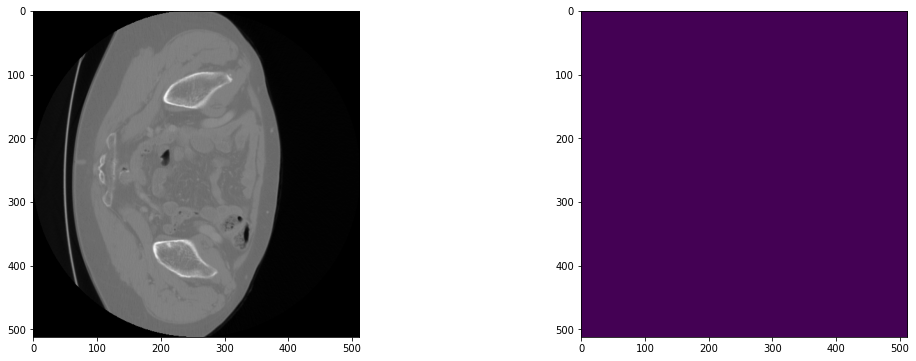

2023-03-21 21:59:20,960 INFO image_writer.py:194 - writing: out/liver_100/liver_100_seg.nii.gz


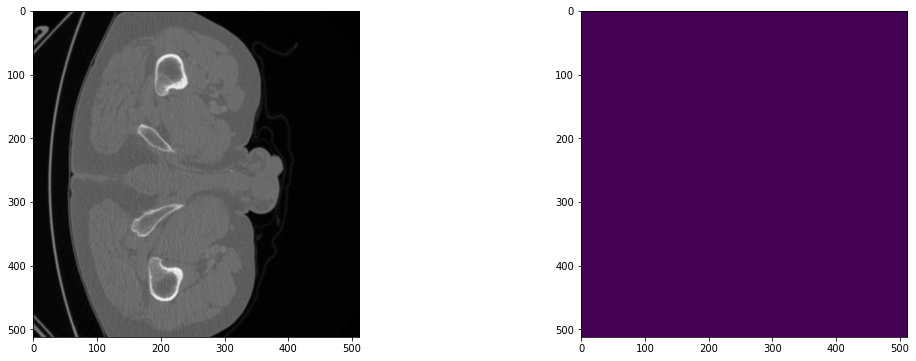

2023-03-21 22:00:03,311 INFO image_writer.py:194 - writing: out/liver_103/liver_103_seg.nii.gz


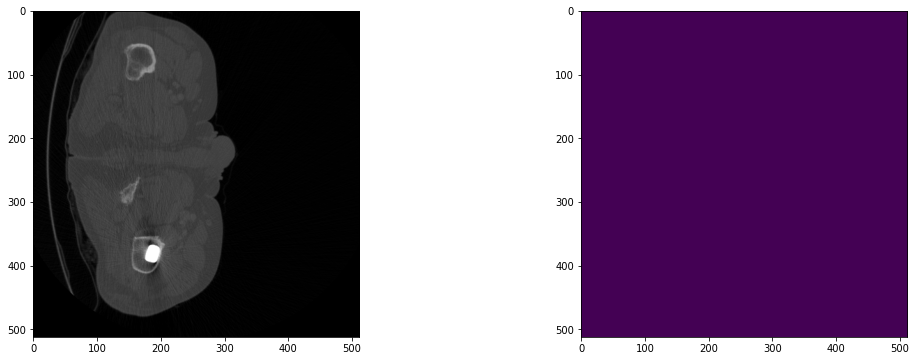

2023-03-21 22:00:42,238 INFO image_writer.py:194 - writing: out/liver_104/liver_104_seg.nii.gz


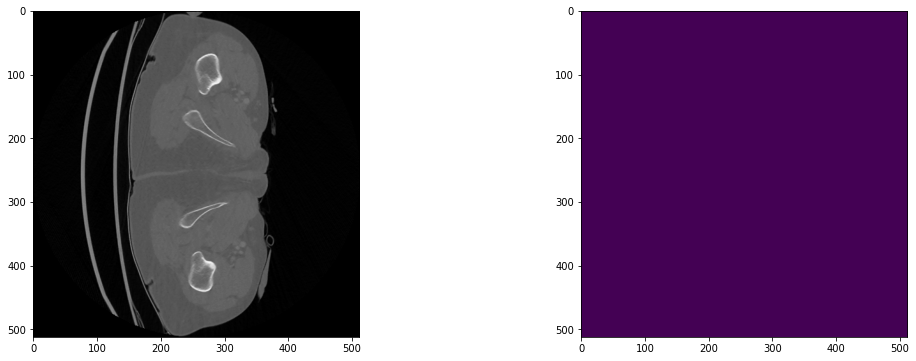

2023-03-21 22:01:27,784 INFO image_writer.py:194 - writing: out/liver_106/liver_106_seg.nii.gz


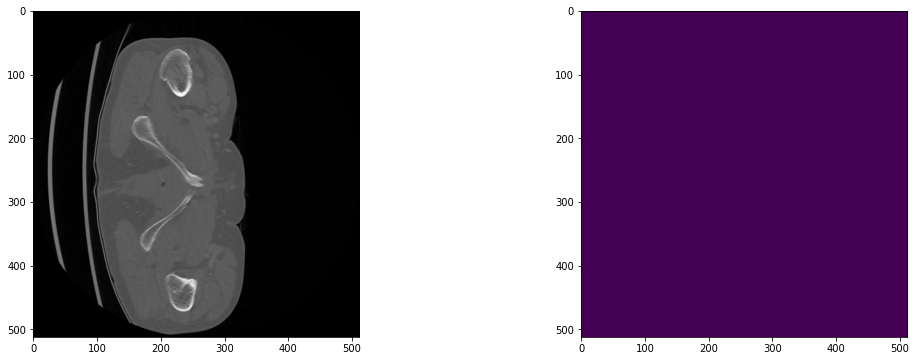

2023-03-21 22:02:14,317 INFO image_writer.py:194 - writing: out/liver_111/liver_111_seg.nii.gz


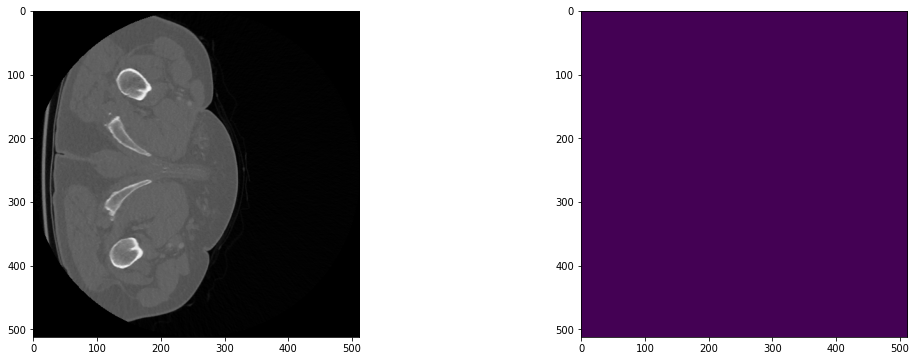

2023-03-21 22:02:58,760 INFO image_writer.py:194 - writing: out/liver_113/liver_113_seg.nii.gz


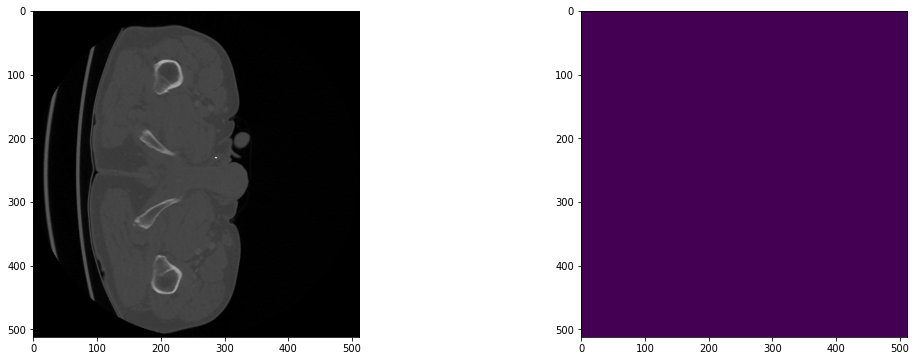

2023-03-21 22:03:47,189 INFO image_writer.py:194 - writing: out/liver_117/liver_117_seg.nii.gz


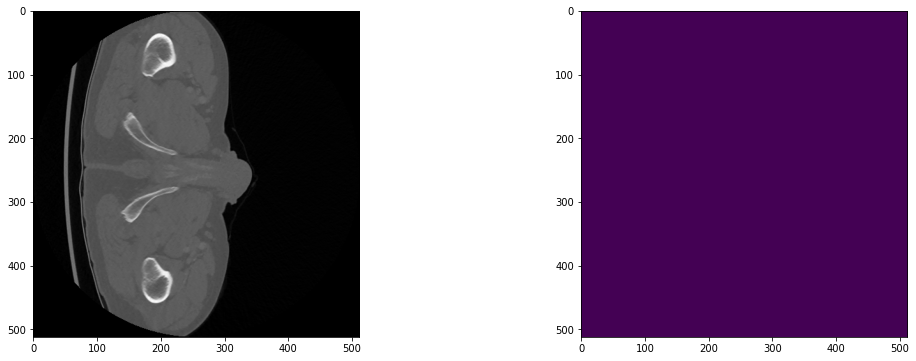

2023-03-21 22:04:36,066 INFO image_writer.py:194 - writing: out/liver_119/liver_119_seg.nii.gz


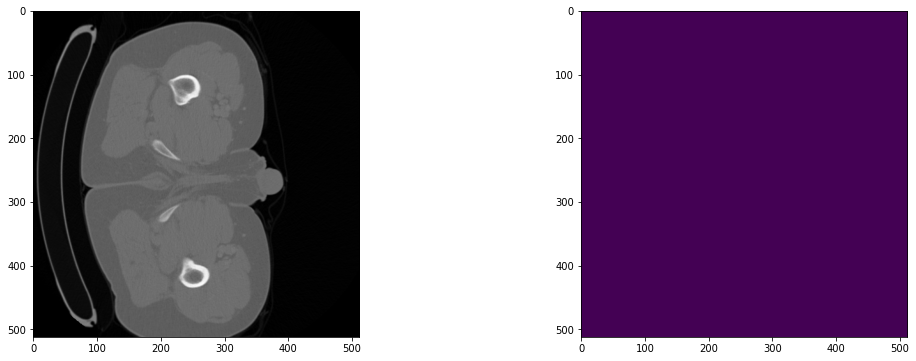

2023-03-21 22:05:01,736 INFO image_writer.py:194 - writing: out/liver_120/liver_120_seg.nii.gz


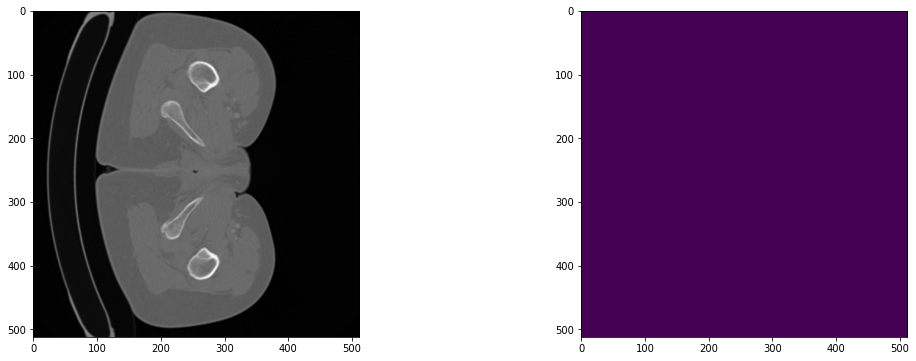

2023-03-21 22:05:25,995 INFO image_writer.py:194 - writing: out/liver_125/liver_125_seg.nii.gz


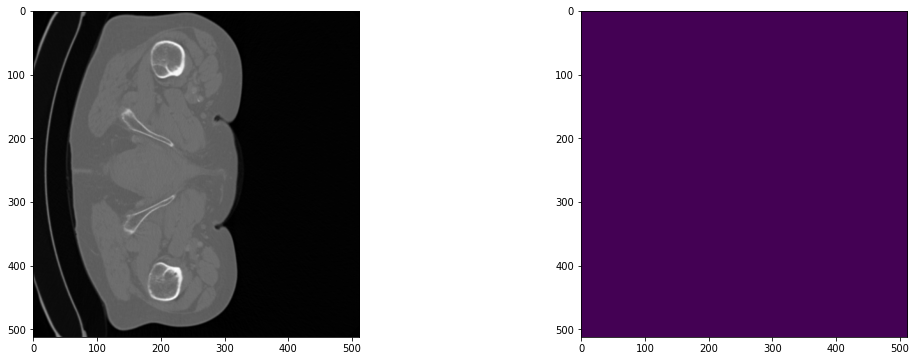

2023-03-21 22:05:50,753 INFO image_writer.py:194 - writing: out/liver_127/liver_127_seg.nii.gz


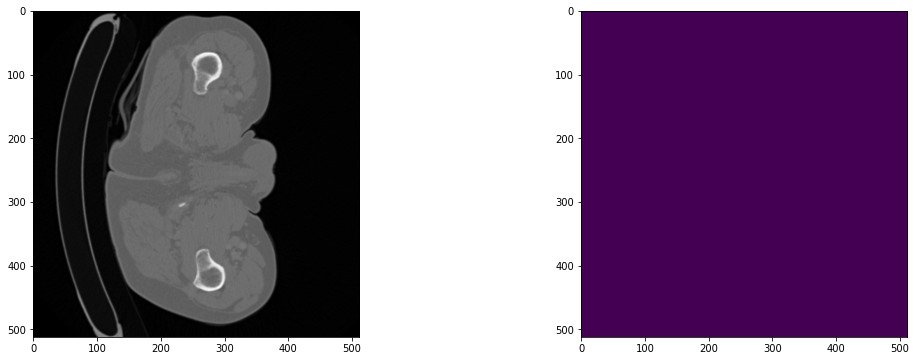

2023-03-21 22:06:44,815 INFO image_writer.py:194 - writing: out/liver_128/liver_128_seg.nii.gz


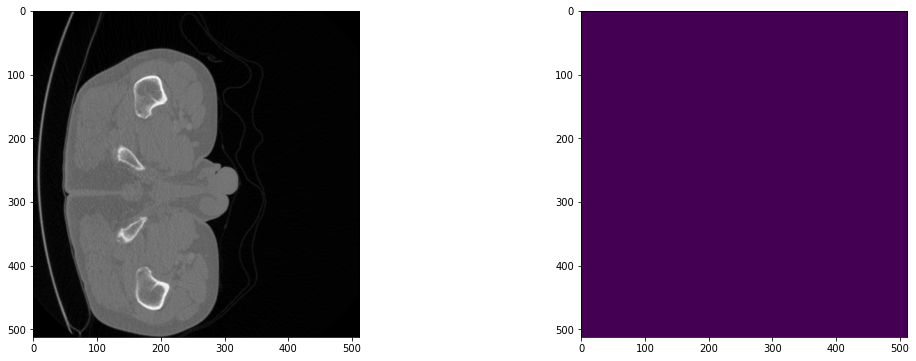

2023-03-21 22:07:19,828 INFO image_writer.py:194 - writing: out/liver_129/liver_129_seg.nii.gz


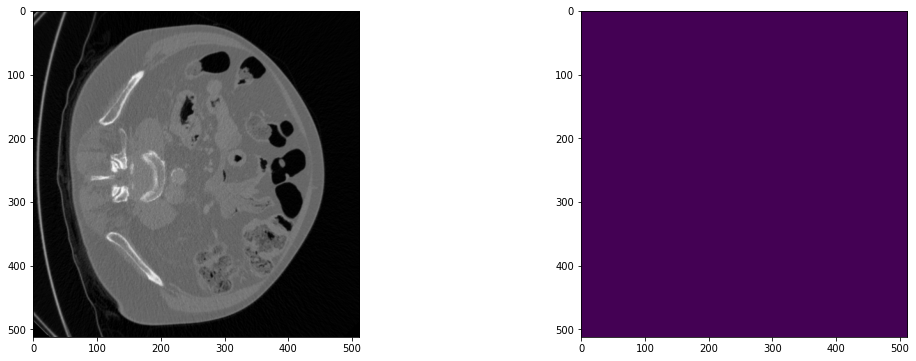

2023-03-21 22:07:39,590 INFO image_writer.py:194 - writing: out/liver_14/liver_14_seg.nii.gz


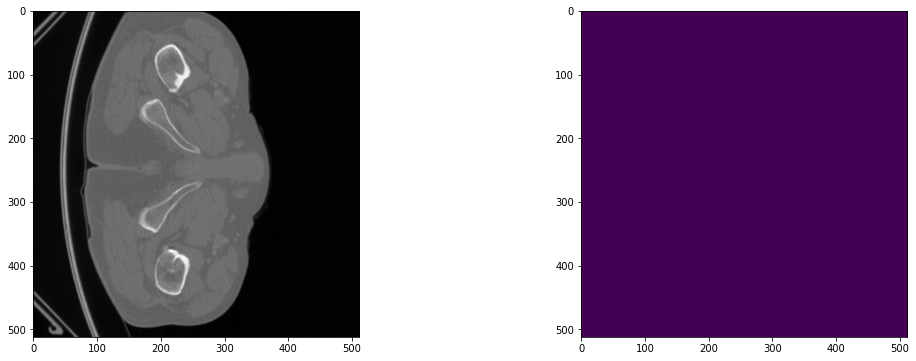

2023-03-21 22:08:13,324 INFO image_writer.py:194 - writing: out/liver_17/liver_17_seg.nii.gz


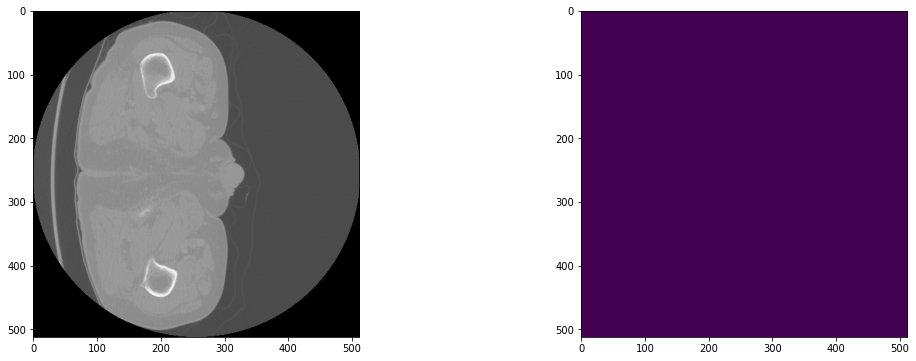

2023-03-21 22:09:00,124 INFO image_writer.py:194 - writing: out/liver_2/liver_2_seg.nii.gz


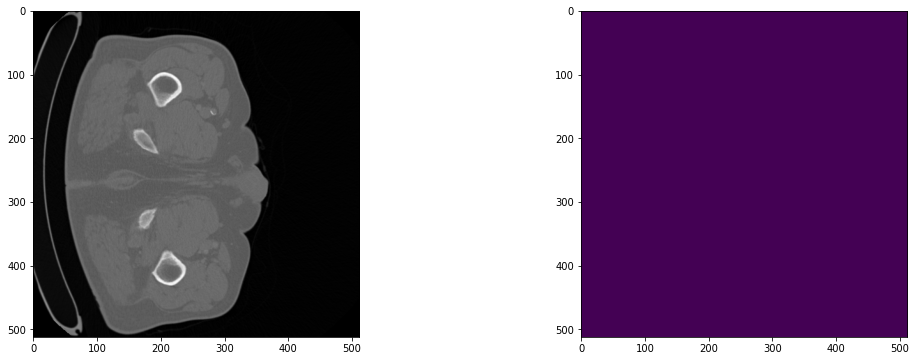

2023-03-21 22:09:28,678 INFO image_writer.py:194 - writing: out/liver_21/liver_21_seg.nii.gz


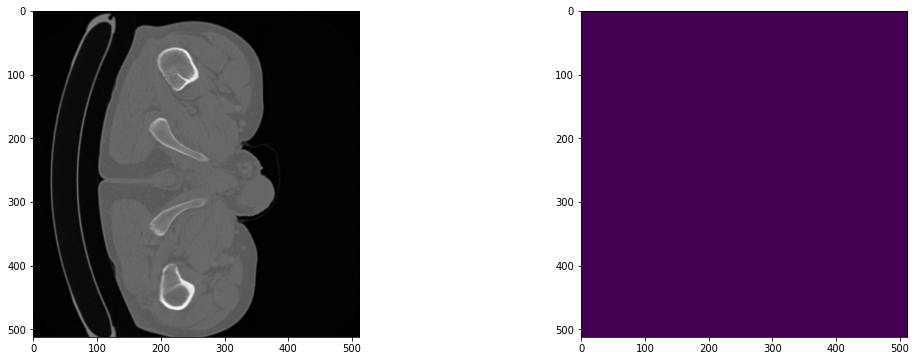

2023-03-21 22:09:52,982 INFO image_writer.py:194 - writing: out/liver_24/liver_24_seg.nii.gz


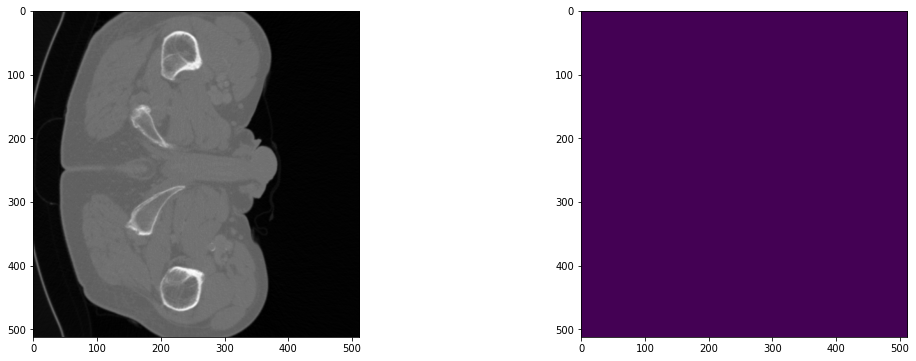

2023-03-21 22:10:09,813 INFO image_writer.py:194 - writing: out/liver_27/liver_27_seg.nii.gz


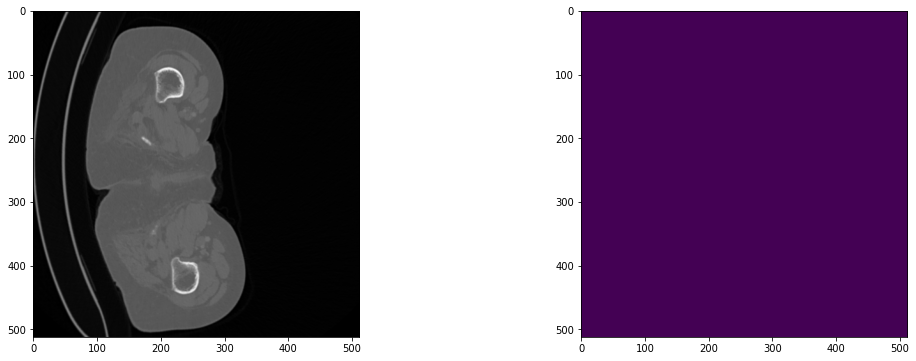

2023-03-21 22:10:59,593 INFO image_writer.py:194 - writing: out/liver_30/liver_30_seg.nii.gz


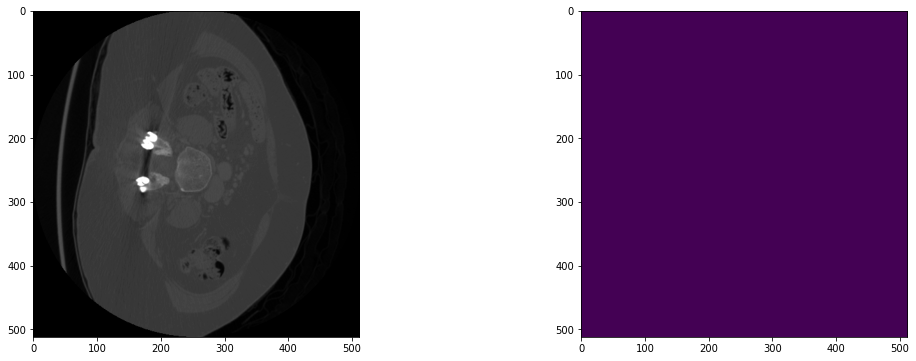

2023-03-21 22:11:10,519 INFO image_writer.py:194 - writing: out/liver_32/liver_32_seg.nii.gz


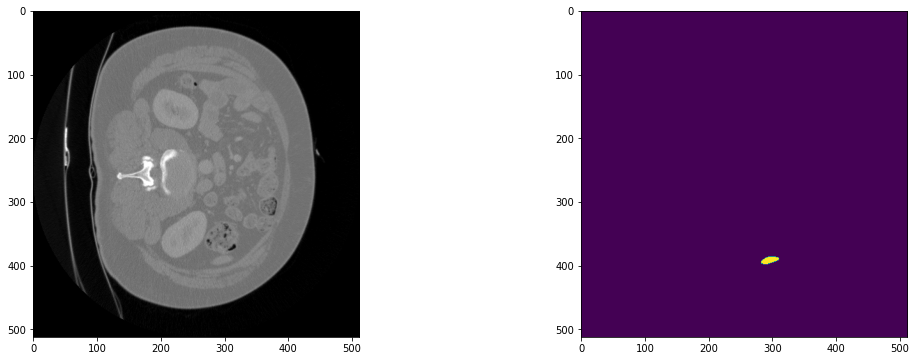

2023-03-21 22:11:18,109 INFO image_writer.py:194 - writing: out/liver_34/liver_34_seg.nii.gz


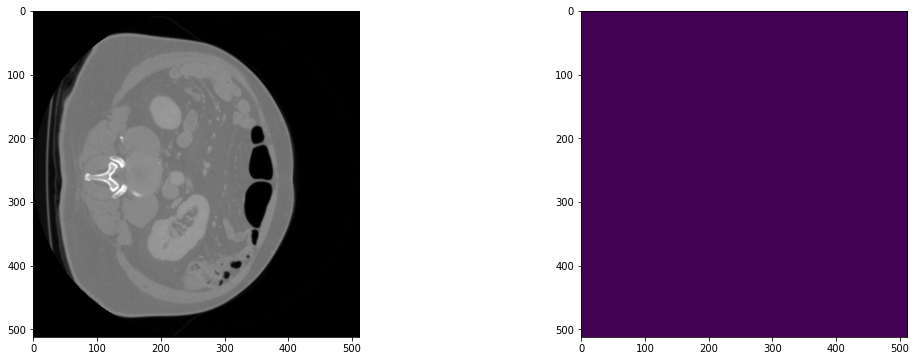

2023-03-21 22:11:26,391 INFO image_writer.py:194 - writing: out/liver_35/liver_35_seg.nii.gz


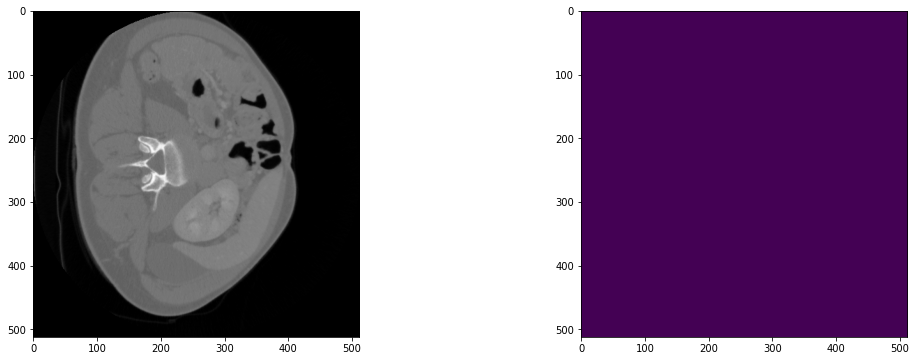

2023-03-21 22:11:33,218 INFO image_writer.py:194 - writing: out/liver_36/liver_36_seg.nii.gz


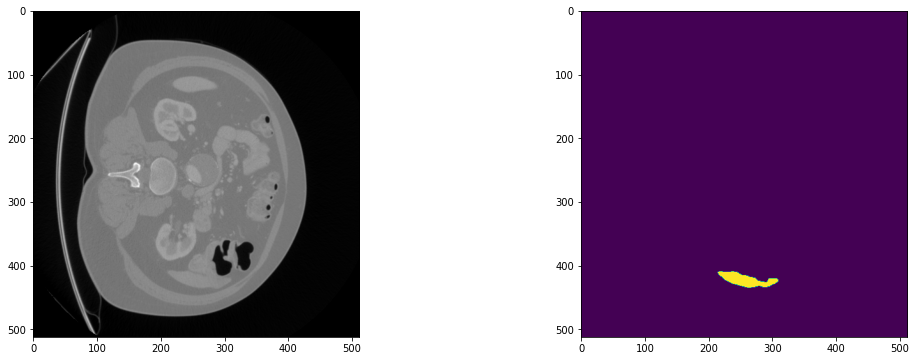

2023-03-21 22:11:39,573 INFO image_writer.py:194 - writing: out/liver_37/liver_37_seg.nii.gz


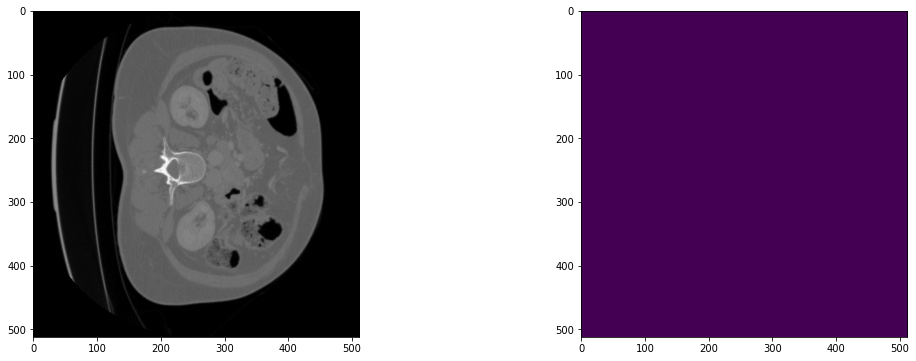

2023-03-21 22:11:46,398 INFO image_writer.py:194 - writing: out/liver_38/liver_38_seg.nii.gz


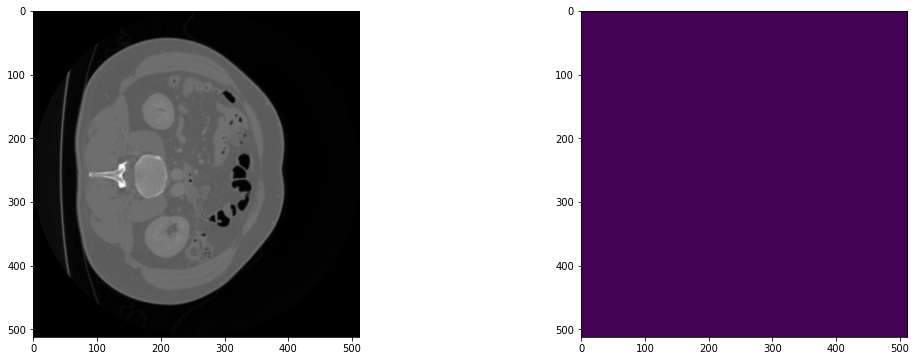

2023-03-21 22:11:53,765 INFO image_writer.py:194 - writing: out/liver_42/liver_42_seg.nii.gz


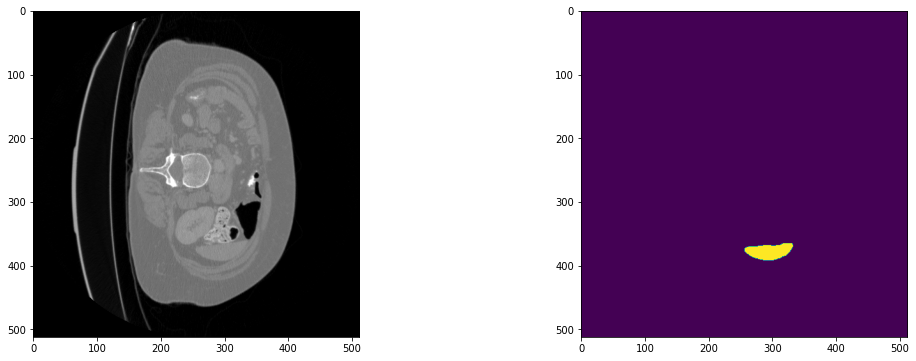

2023-03-21 22:12:00,824 INFO image_writer.py:194 - writing: out/liver_44/liver_44_seg.nii.gz


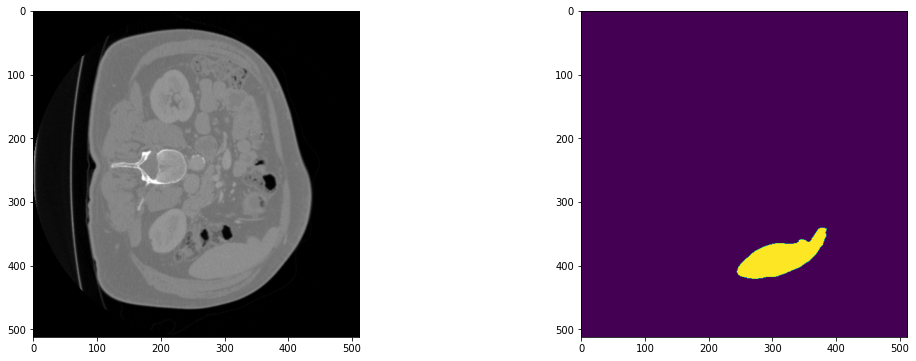

2023-03-21 22:12:09,354 INFO image_writer.py:194 - writing: out/liver_50/liver_50_seg.nii.gz


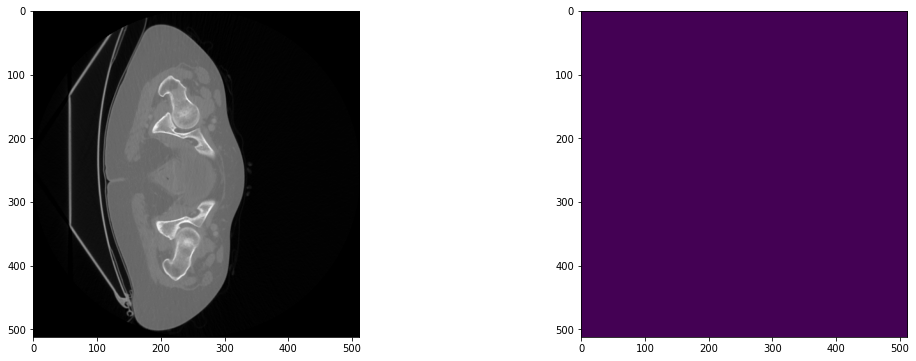

2023-03-21 22:12:22,836 INFO image_writer.py:194 - writing: out/liver_57/liver_57_seg.nii.gz


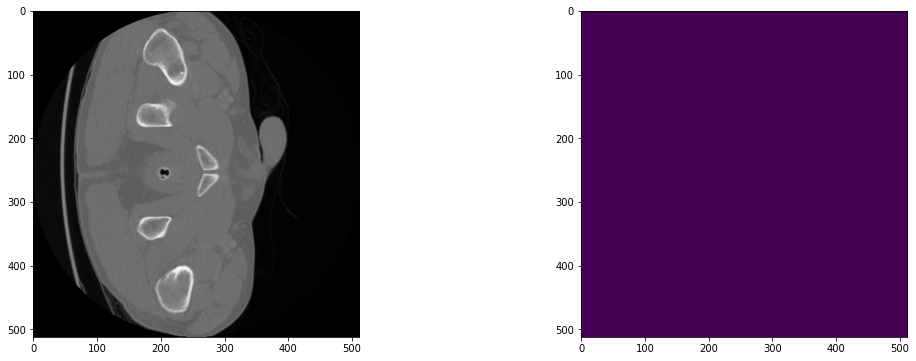

2023-03-21 22:12:43,460 INFO image_writer.py:194 - writing: out/liver_65/liver_65_seg.nii.gz


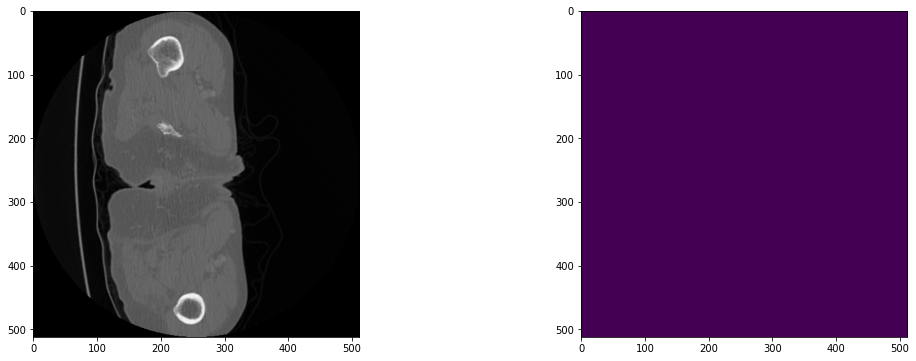

2023-03-21 22:13:13,501 INFO image_writer.py:194 - writing: out/liver_75/liver_75_seg.nii.gz


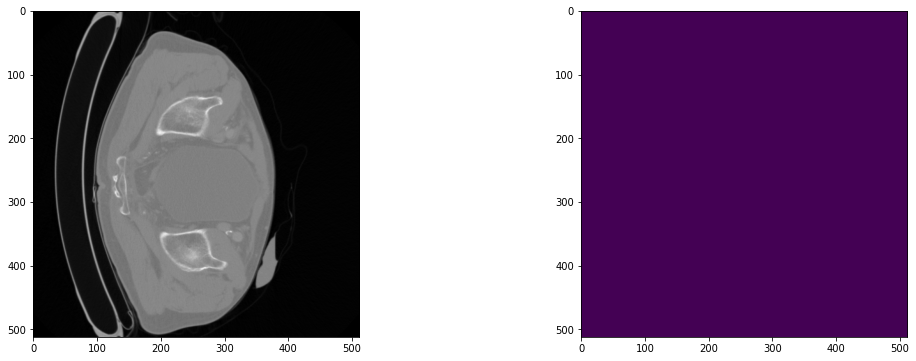

2023-03-21 22:13:19,632 INFO image_writer.py:194 - writing: out/liver_76/liver_76_seg.nii.gz


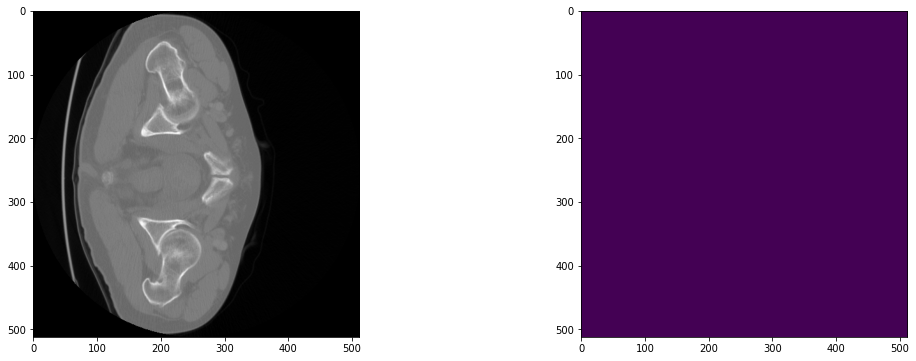

2023-03-21 22:13:30,624 INFO image_writer.py:194 - writing: out/liver_79/liver_79_seg.nii.gz


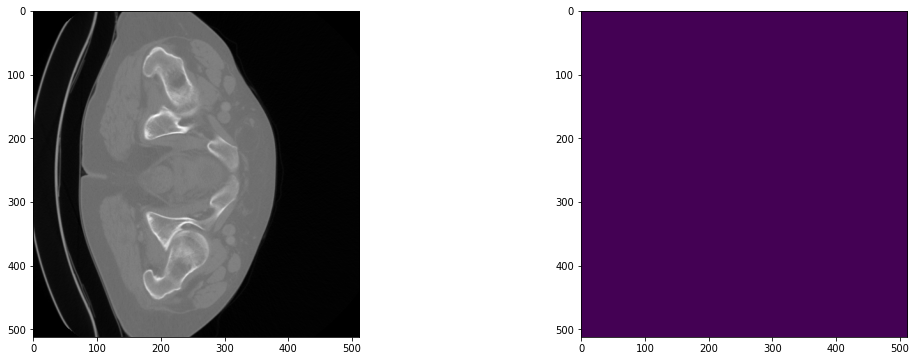

2023-03-21 22:13:40,658 INFO image_writer.py:194 - writing: out/liver_84/liver_84_seg.nii.gz


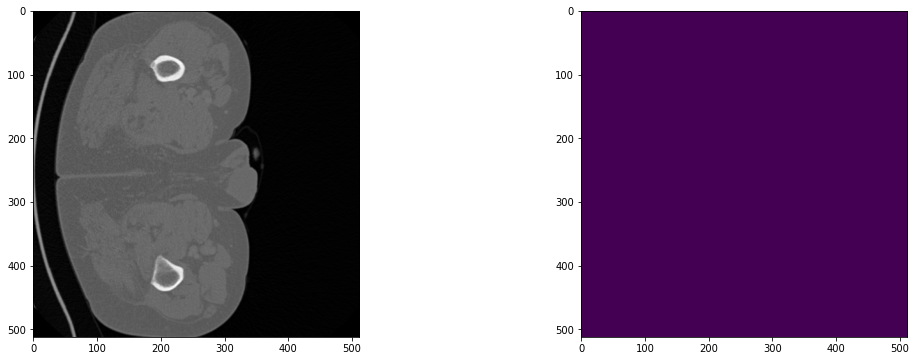

2023-03-21 22:14:19,716 INFO image_writer.py:194 - writing: out/liver_86/liver_86_seg.nii.gz


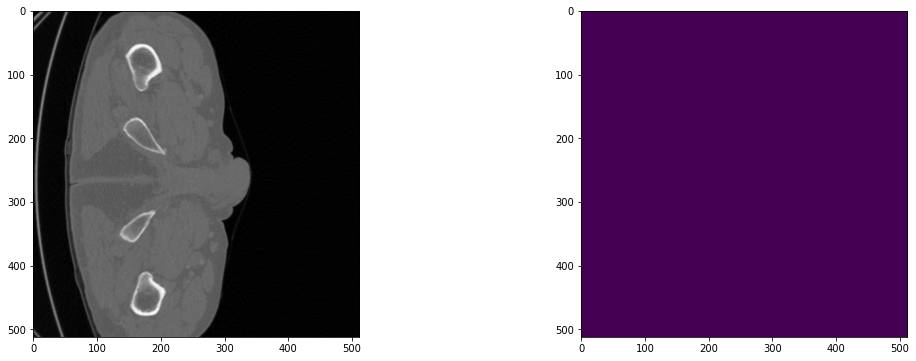

2023-03-21 22:14:57,283 INFO image_writer.py:194 - writing: out/liver_91/liver_91_seg.nii.gz


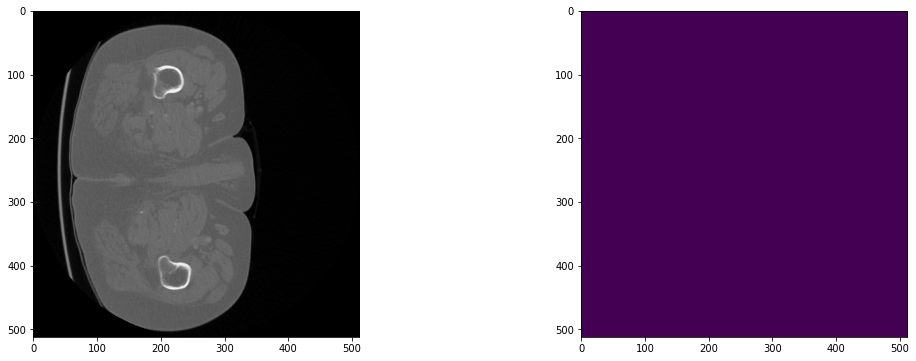

2023-03-21 22:15:38,367 INFO image_writer.py:194 - writing: out/liver_92/liver_92_seg.nii.gz


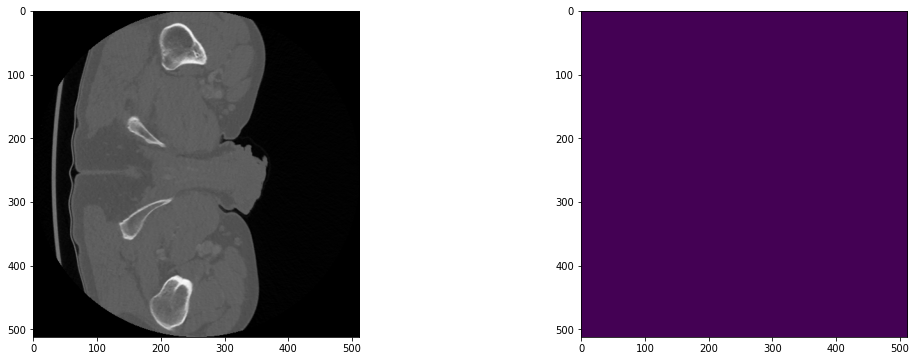

2023-03-21 22:16:24,682 INFO image_writer.py:194 - writing: out/liver_93/liver_93_seg.nii.gz


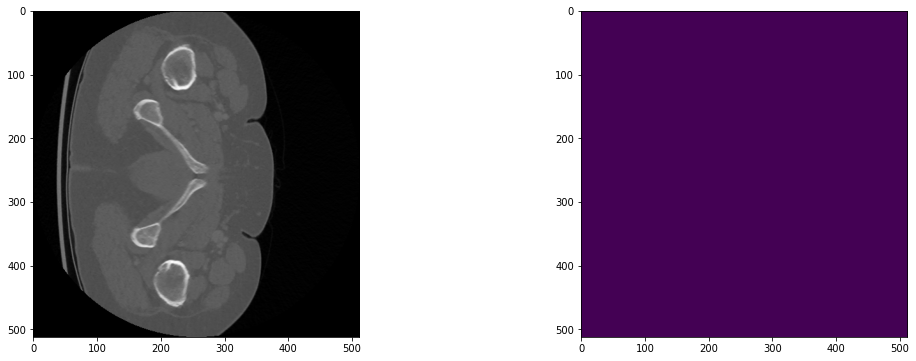

2023-03-21 22:17:04,903 INFO image_writer.py:194 - writing: out/liver_97/liver_97_seg.nii.gz


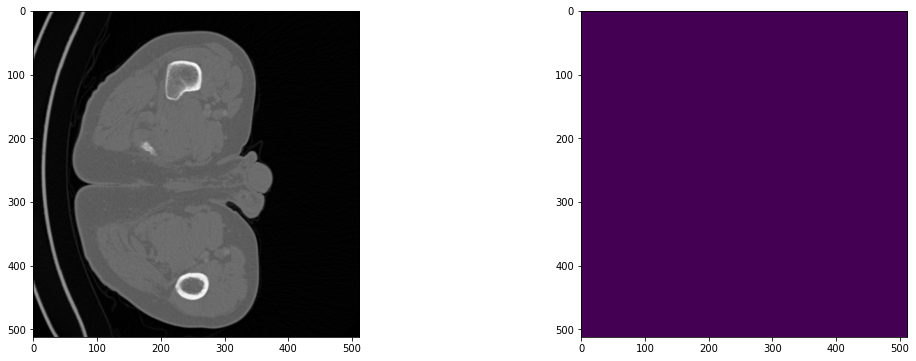

2023-03-21 22:17:42,584 INFO image_writer.py:194 - writing: out/liver_99/liver_99_seg.nii.gz


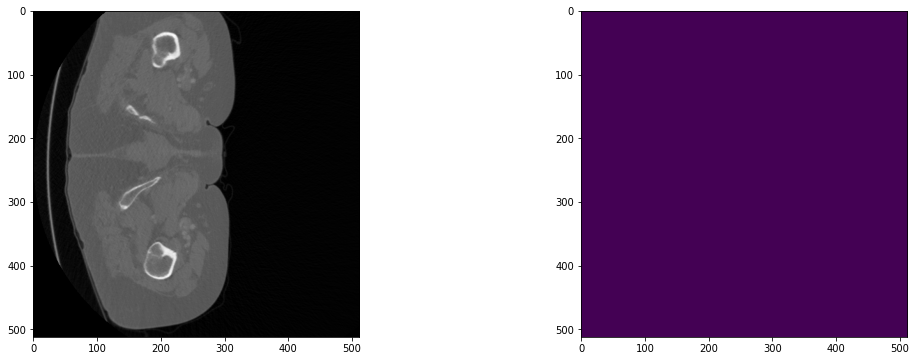

In [ ]:
# liver category is represented by channel 0 and the tumor category is represented by channel 1
model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model3.pth")))
model.eval()

with torch.no_grad():
    for test_data in test_org_loader:
        test_inputs = test_data["image"].to(device)
        roi_size = (128, 128, 64)
        sw_batch_size = 4
        test_data["pred"] = sliding_window_inference(test_inputs, roi_size, sw_batch_size, model)

        test_data = [post_transforms(i) for i in decollate_batch(test_data)]

        # Visualize the predicted results
        test_output = from_engine(["pred"])(test_data)
        original_image = nib.load(test_output[0].meta["filename_or_obj"]).get_fdata()

        plt.figure("check", (18, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(original_image[:, :, 20], cmap="gray")
        plt.subplot(1, 2, 2)
        plt.imshow(test_output[0].detach().cpu()[1, :, :, 20])
        plt.show()

## **Report**

---






In the process of the optimisation, I changed the dropout probability in the VNet network parameters from 0.48 to 0.5, which helps the model to be more robust to overfitting. In the loss function section, I found that the sigmoid function used in the generalised sieve loss function did not perform well and I replaced it with a softmax probabilities to calculate the loss. In the optimiser section, I adjusted the learning rate from 1e-5 to 1e-4 to make the model converge more consistently.

As three data augmentation techniques were added to the previous transformation, I run the training loop again. Based on the results, a maximum of 600 runs gave the best sieve score, 0.7358, out of 588 epochs, indicating that the optimisation was effective and the model learning capability was significantly improved and it means that the model is able to segment the liver and tumor regions with a good accuracy.

Finally, the selected model is evaluated on the test set.The output tensor has 3 channels, where the first channel represents the background (label 0), the second channel represents the liver (label 1), and the third channel represents the tumor (label 2). Visualisation of results based on predictions, only a small number of tumour labels are shown in the colour map, possibly because the tumour area does not appear in most of the slices of the image, or it is too small to be seen in the image. This made it necessary to process the loss function later to improve the network's ability to segment small tumours.

# **Adjusting the loss function**

---


In [ ]:
from monai.losses import GeneralizedDiceFocalLoss

In [ ]:
# Define CacheDataset and DataLoader for training and validation
train_ds = CacheDataset(data=train_files, transform=train_transforms, cache_rate=1.0, num_workers=4) # set cache_rate=1.0 to cache all the data

# Use batch_size=2 to load images and use RandCropByPosNegLabeld to generate 2 x 4 images for network training
train_loader = DataLoader(train_ds, batch_size=2, shuffle=True, num_workers=4)

valid_ds = CacheDataset(data=valid_files, transform=valid_transforms, cache_rate=1.0, num_workers=4)
valid_loader = DataLoader(valid_ds, batch_size=1, num_workers=4)

Loading dataset: 100%|██████████| 19/19 [01:36<00:00,  5.10s/it]


In [ ]:
# Set the device to GPU
device = torch.device("cuda:0")

# Implement the VNet model
model = VNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=3,
).to(device)

# Apply GeneralizedDiceFocalLoss to improve the network's ability to cut small tumours
# Setting a weight of 2.0 for the 'cancer' class, a weight of 1.0 for the 'liver' class and a weight of 0 for the 'background' class
focal_weight = torch.tensor([0.0, 1.0, 2.0])
loss_fn = GeneralizedDiceFocalLoss(to_onehot_y=True, softmax=True, focal_weight=focal_weight)

# Initializes the Adam optimizer with a learning rate of 1e-4 for model training
optimizer = torch.optim.Adam(model.parameters(), 1e-4)

# Implements the DiceMetric from MONAI,
# which excludes the background and takes the mean of the dice scores for evaluation
dice_score = DiceMetric(include_background=False, reduction="mean")

In [ ]:
# Set the number of maximum epochs to 600 and the validation interval to 2
max_epochs = 600
valid_interval = 2

# Keep track of the best metric value and its corresponding epoch
best_metric = -1
best_metric_epoch = -1

# Store epoch loss values and metric values
epoch_loss_values = []
metric_values = []

# Process the model's output and ground truth labels
pred = Compose([AsDiscrete(argmax=True, to_onehot=3)])
label = Compose([AsDiscrete(to_onehot=3)])

for epoch in range(max_epochs):
    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")

    # Set the model to training mode
    model.train()

    # Initializes the epoch loss and step
    epoch_loss = 0
    step = 0

    # Iterate through the training data loader
    for batch_data in train_loader:
        step += 1
        inputs, labels = (
            batch_data["image"].to(device),
            batch_data["label"].to(device),
        )

        # Forward pass
        optimizer.zero_grad()
        outputs = model(inputs)

        # Calculate the loss
        loss = loss_fn(outputs, labels)
        loss.backward()

        # Update the model's weights using the optimizer
        optimizer.step()

        epoch_loss += loss.item()
        print(f"{step}/{len(train_ds) // train_loader.batch_size}, " f"train_loss: {loss.item():.4f}")

    # Calculate the average epoch loss and appends it to the epoch_loss_values list
    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}")

    # If the current epoch is a validation epoch, it sets the model to evaluation mode
    if (epoch + 1) % valid_interval == 0:
        model.eval()
        with torch.no_grad():
            for valid_data in valid_loader:
                valid_inputs, valid_labels = (
                    valid_data["image"].to(device),
                    valid_data["label"].to(device),
                )

                # Representing the size of the sliding window to generate predictions for each patch
                roi_size = (128, 128, 64)

                # Representing the batch size for sliding window inference
                sw_batch_size = 4

                # Performs inference on the validation dataset using sliding_window_inference
                valid_outputs = sliding_window_inference(valid_inputs, roi_size, sw_batch_size, model)

                # Calculate the Dice metric for the model's predictions
                valid_outputs = [pred(i) for i in decollate_batch(valid_outputs)]
                valid_labels = [label(i) for i in decollate_batch(valid_labels)]
                # compute metric for current iteration
                dice_score(y_pred=valid_outputs, y=valid_labels)

            # aggregate the final mean dice result
            metric = dice_score.aggregate().item()
            # reset the status for next validation round
            dice_score.reset()

            # Update the best metric and its corresponding epoch if necessary
            metric_values.append(metric)
            if metric > best_metric:
                best_metric = metric
                best_metric_epoch = epoch + 1

                #  Save the model with the best metric
                torch.save(model.state_dict(), os.path.join(root_dir, "best_metric_model4.pth"))
                print("saved new best metric model")
            print(
                f"current epoch: {epoch + 1} current mean dice: {metric:.4f}"
                f"\nbest mean dice: {best_metric:.4f} "
                f"at epoch: {best_metric_epoch}"
            )

流式输出内容被截断，只能显示最后 5000 行内容。
32/35, train_loss: 0.0671
33/35, train_loss: 0.0429
34/35, train_loss: 0.1340
35/35, train_loss: 0.1491
epoch 472 average loss: 0.0917
current epoch: 472 current mean dice: 0.7227
best mean dice: 0.7409 at epoch: 432
----------
epoch 473/600
1/35, train_loss: 0.0353
2/35, train_loss: 0.0484
3/35, train_loss: 0.0682
4/35, train_loss: 0.1686
5/35, train_loss: 0.1547
6/35, train_loss: 0.0979
7/35, train_loss: 0.1061
8/35, train_loss: 0.0700
9/35, train_loss: 0.0647
10/35, train_loss: 0.1220
11/35, train_loss: 0.1411
12/35, train_loss: 0.0244
13/35, train_loss: 0.0899
14/35, train_loss: 0.0730
15/35, train_loss: 0.0195
16/35, train_loss: 0.1444
17/35, train_loss: 0.0396
18/35, train_loss: 0.1241
19/35, train_loss: 0.0809
20/35, train_loss: 0.0647
21/35, train_loss: 0.0982
22/35, train_loss: 0.1007
23/35, train_loss: 0.0695
24/35, train_loss: 0.1197
25/35, train_loss: 0.0656
26/35, train_loss: 0.2186
27/35, train_loss: 0.0538
28/35, train_loss: 0.0802
29/35, train

In [ ]:
print(f"train completed, best_metric: {best_metric:.4f} " f"at epoch: {best_metric_epoch}")

train completed, best_metric: 0.7416 at epoch: 592

## **Test**

---



In [ ]:
test_images = sorted(glob.glob(os.path.join(data_dir, "Test/imagesTr", "*.nii.gz")))

test_data = [{"image": image} for image in test_images]

test_org_transforms = Compose(
    [
        LoadImaged(keys="image"),
        EnsureChannelFirstd(keys="image"),
        Orientationd(keys=["image"], axcodes="RAS"),
        Spacingd(keys=["image"], pixdim=(1.5, 1.5, 1.0), mode="bilinear"),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-200,
            a_max=200,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image"], source_key="image"),
    ]
)

In [ ]:
# Use Cacheddataset to speed up validation of test sets
test_org_ds = CacheDataset(data=test_data, transform=test_org_transforms, cache_rate=1.0, num_workers=4)
# test_org_ds = Dataset(data=test_data, transform=test_org_transforms)

test_org_loader = DataLoader(test_org_ds, batch_size=1, num_workers=4)

# Define post-processing transforms
post_transforms = Compose(
    [
        Invertd(
            keys="pred",
            transform=test_org_transforms,
            orig_keys="image",
            meta_keys="pred_meta_dict",
            orig_meta_keys="image_meta_dict",
            meta_key_postfix="meta_dict",
            nearest_interp=False,
            to_tensor=True,
        ), # Transformation applied to the input image before it was fed into the segmentation model
        AsDiscreted(keys="pred", argmax=True, to_onehot=3), # Convert the predicted probabilities for each class into discrete segmentations
        SaveImaged(keys="pred", meta_keys="pred_meta_dict", output_dir="./out", output_postfix="seg", resample=False), # Save the predicted segmentation as an image file
    ]
)

Loading dataset: 100%|██████████| 42/42 [01:59<00:00,  2.84s/it]


2023-03-24 10:46:28,073 INFO image_writer.py:194 - writing: out/liver_0/liver_0_seg.nii.gz


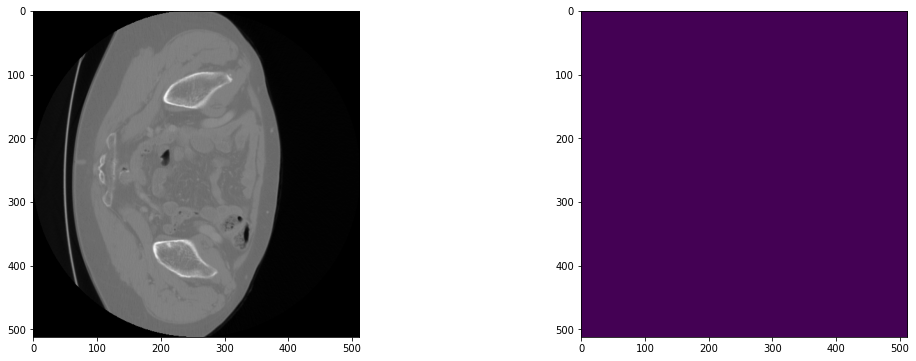

2023-03-24 10:46:34,072 INFO image_writer.py:194 - writing: out/liver_100/liver_100_seg.nii.gz


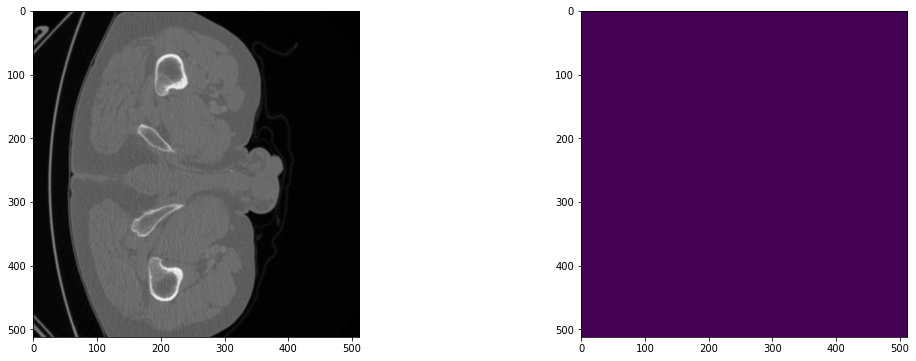

2023-03-24 10:47:15,244 INFO image_writer.py:194 - writing: out/liver_103/liver_103_seg.nii.gz


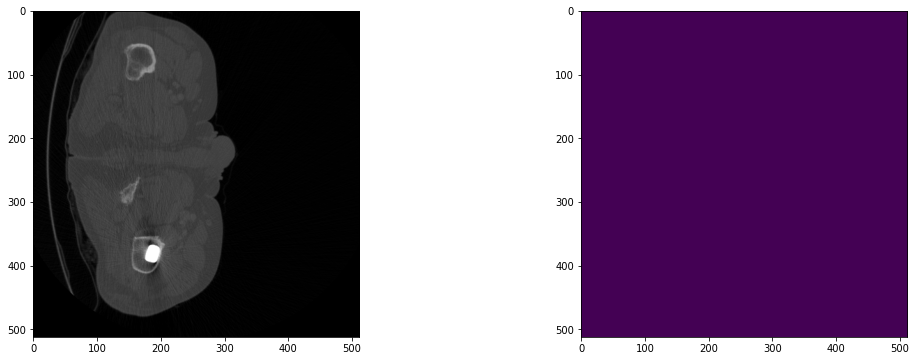

2023-03-24 10:47:56,481 INFO image_writer.py:194 - writing: out/liver_104/liver_104_seg.nii.gz


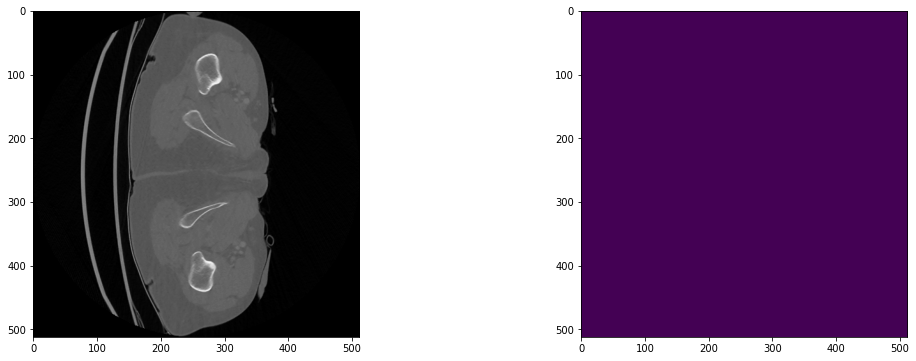

2023-03-24 10:48:43,918 INFO image_writer.py:194 - writing: out/liver_106/liver_106_seg.nii.gz


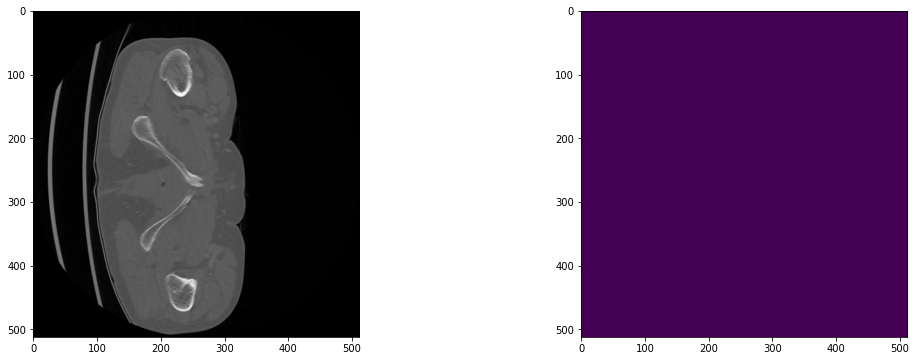

2023-03-24 10:49:30,091 INFO image_writer.py:194 - writing: out/liver_111/liver_111_seg.nii.gz


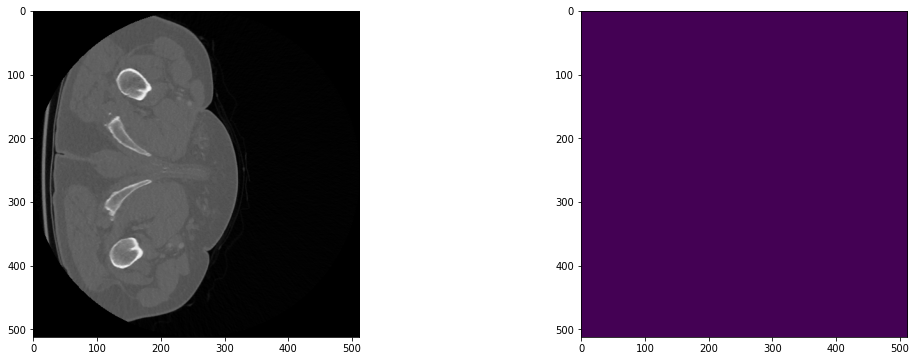

2023-03-24 10:50:17,414 INFO image_writer.py:194 - writing: out/liver_113/liver_113_seg.nii.gz


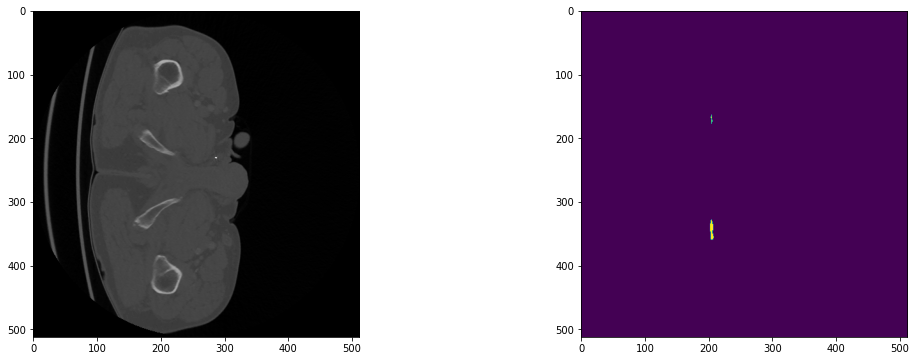

2023-03-24 10:51:07,343 INFO image_writer.py:194 - writing: out/liver_117/liver_117_seg.nii.gz


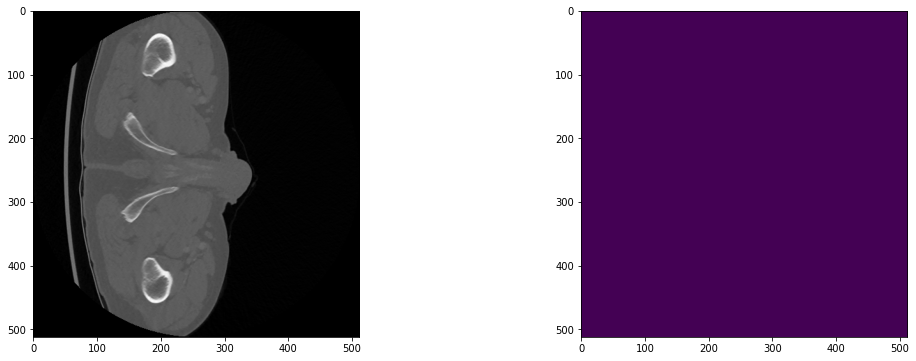

2023-03-24 10:51:57,808 INFO image_writer.py:194 - writing: out/liver_119/liver_119_seg.nii.gz


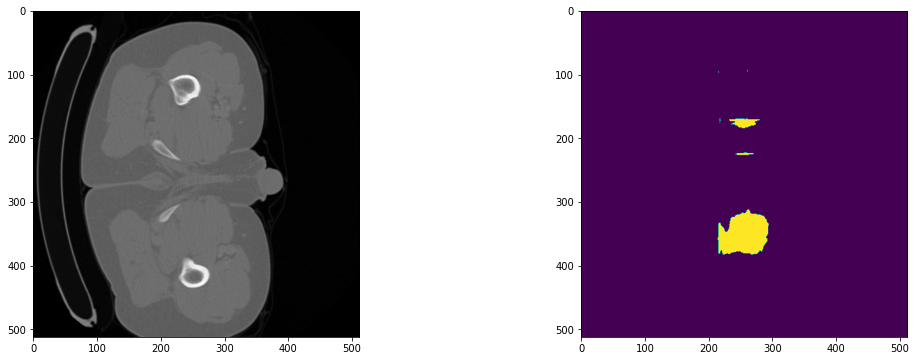

2023-03-24 10:52:25,376 INFO image_writer.py:194 - writing: out/liver_120/liver_120_seg.nii.gz


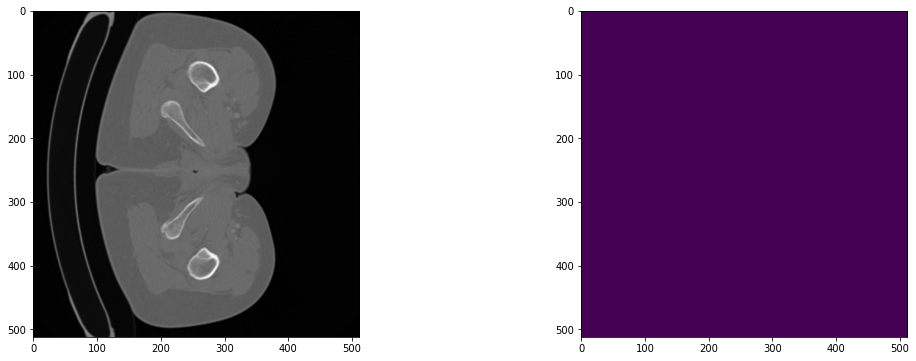

2023-03-24 10:52:49,777 INFO image_writer.py:194 - writing: out/liver_125/liver_125_seg.nii.gz


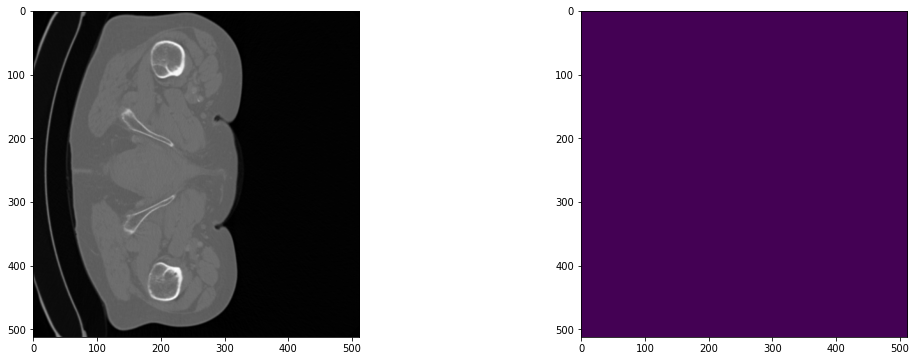

2023-03-24 10:53:15,858 INFO image_writer.py:194 - writing: out/liver_127/liver_127_seg.nii.gz


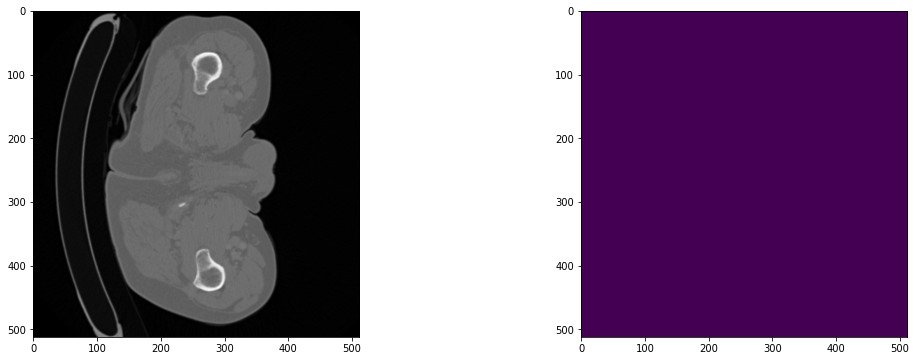

2023-03-24 10:54:14,050 INFO image_writer.py:194 - writing: out/liver_128/liver_128_seg.nii.gz


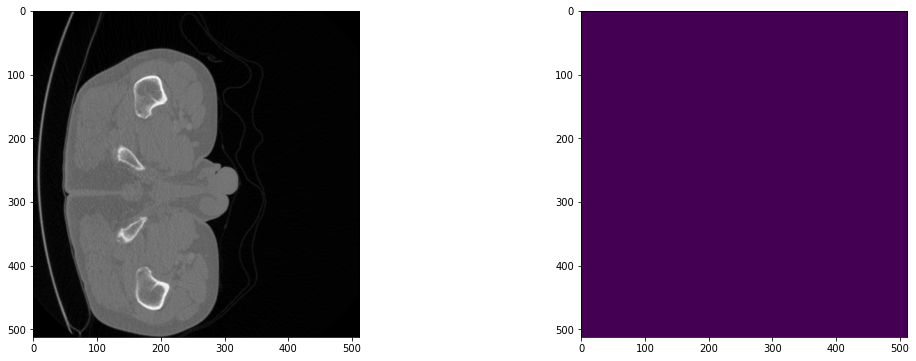

2023-03-24 10:54:51,689 INFO image_writer.py:194 - writing: out/liver_129/liver_129_seg.nii.gz


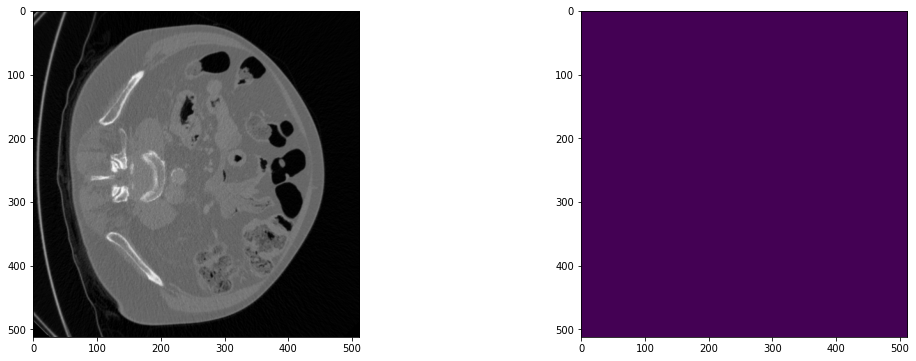

2023-03-24 10:55:12,456 INFO image_writer.py:194 - writing: out/liver_14/liver_14_seg.nii.gz


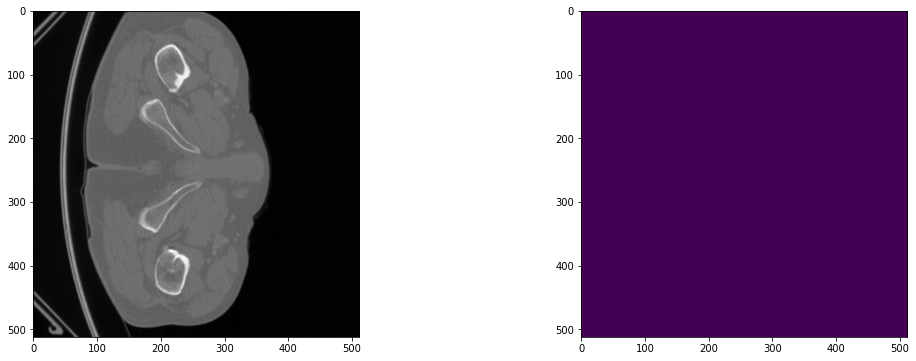

2023-03-24 10:55:47,492 INFO image_writer.py:194 - writing: out/liver_17/liver_17_seg.nii.gz


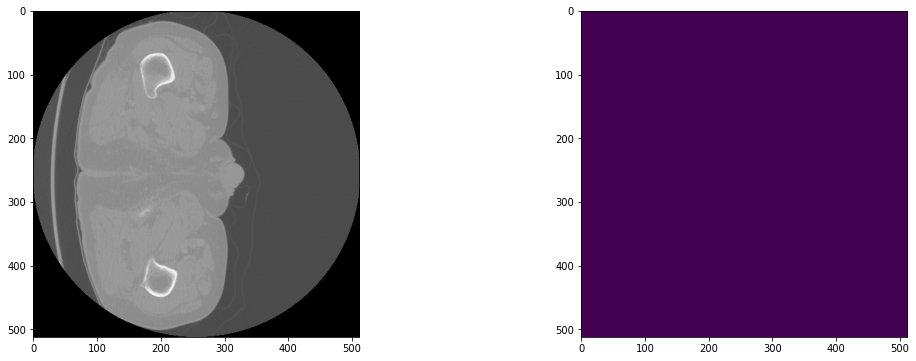

2023-03-24 10:56:36,908 INFO image_writer.py:194 - writing: out/liver_2/liver_2_seg.nii.gz


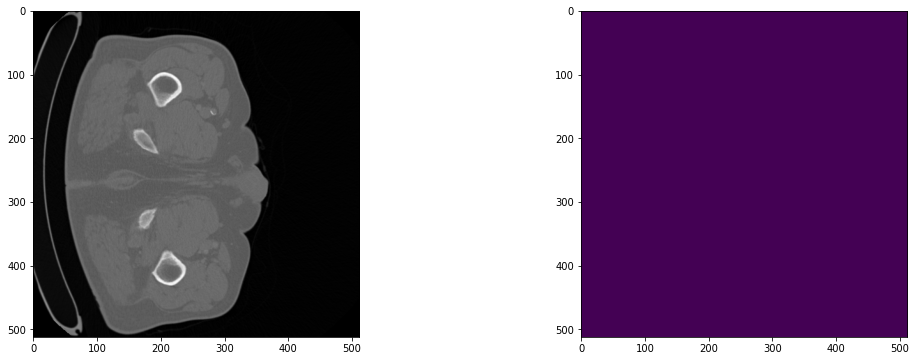

2023-03-24 10:57:07,481 INFO image_writer.py:194 - writing: out/liver_21/liver_21_seg.nii.gz


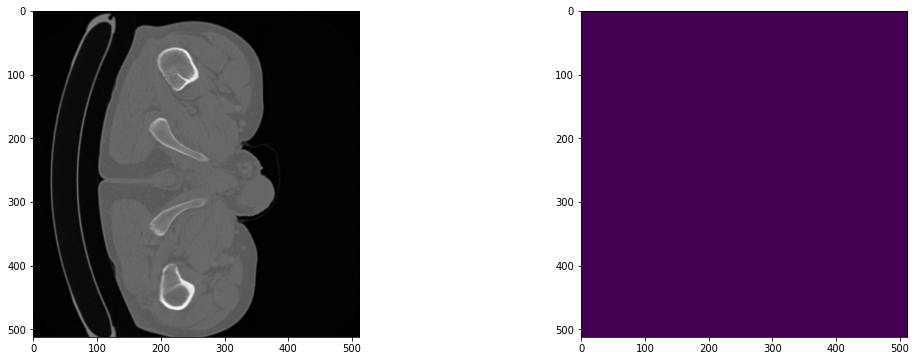

2023-03-24 10:57:32,640 INFO image_writer.py:194 - writing: out/liver_24/liver_24_seg.nii.gz


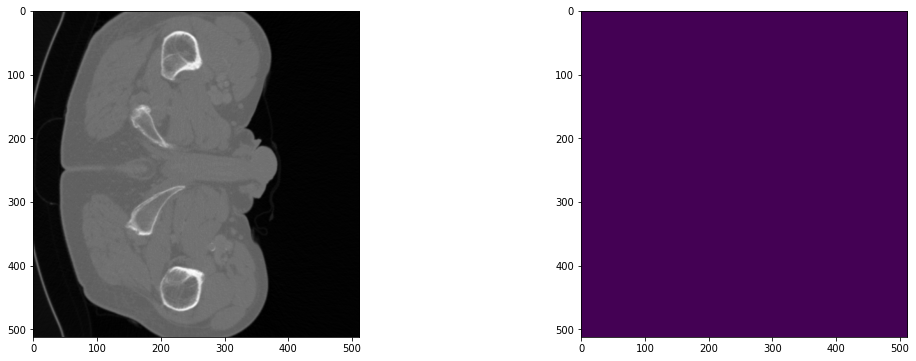

2023-03-24 10:57:49,395 INFO image_writer.py:194 - writing: out/liver_27/liver_27_seg.nii.gz


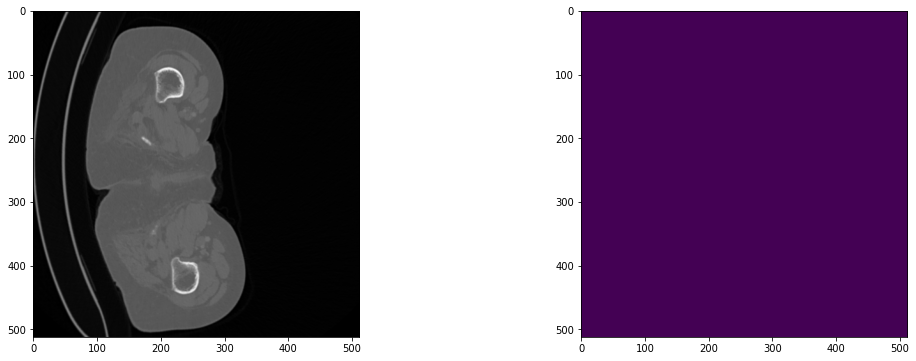

2023-03-24 10:58:41,157 INFO image_writer.py:194 - writing: out/liver_30/liver_30_seg.nii.gz


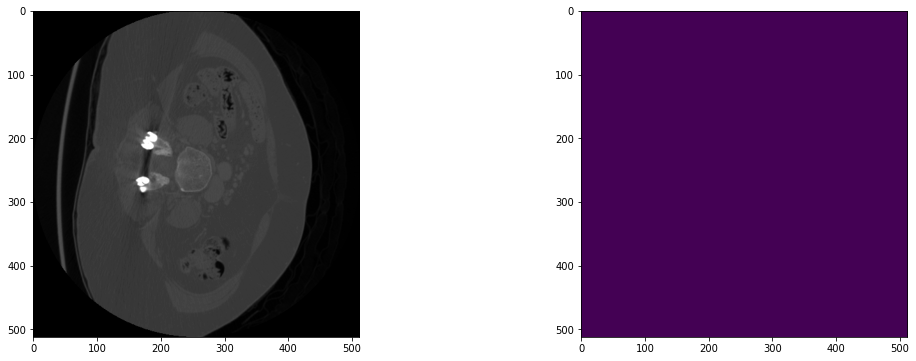

2023-03-24 10:58:52,280 INFO image_writer.py:194 - writing: out/liver_32/liver_32_seg.nii.gz


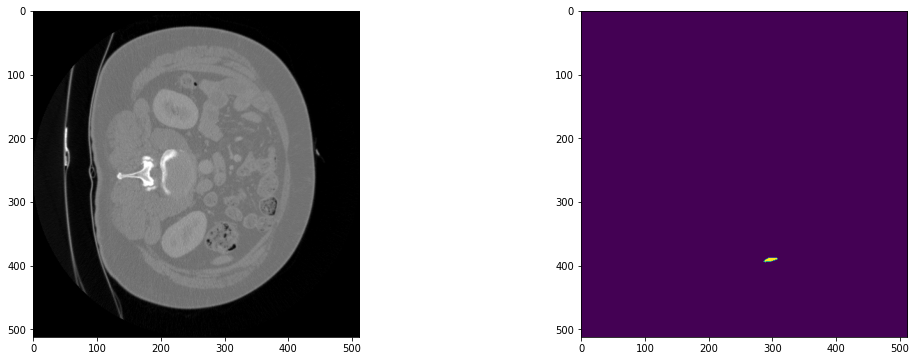

2023-03-24 10:59:00,164 INFO image_writer.py:194 - writing: out/liver_34/liver_34_seg.nii.gz


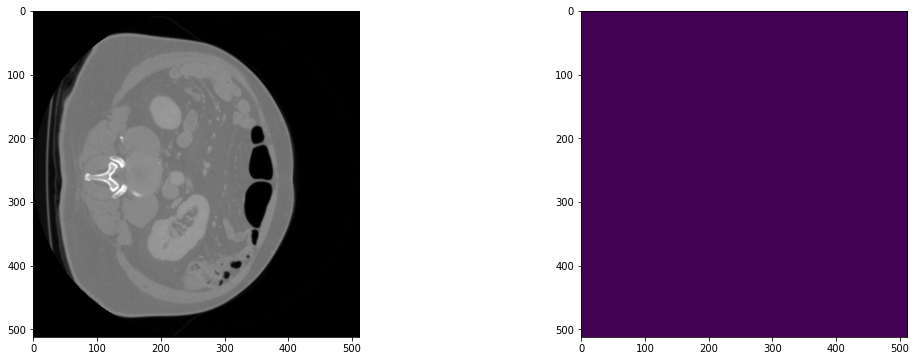

2023-03-24 10:59:08,740 INFO image_writer.py:194 - writing: out/liver_35/liver_35_seg.nii.gz


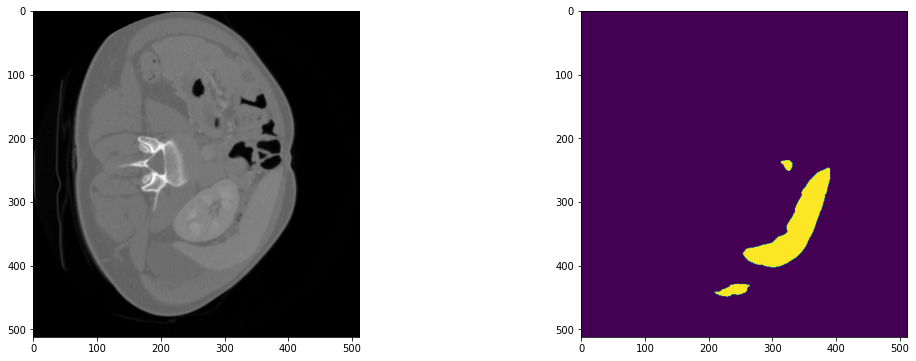

2023-03-24 10:59:15,460 INFO image_writer.py:194 - writing: out/liver_36/liver_36_seg.nii.gz


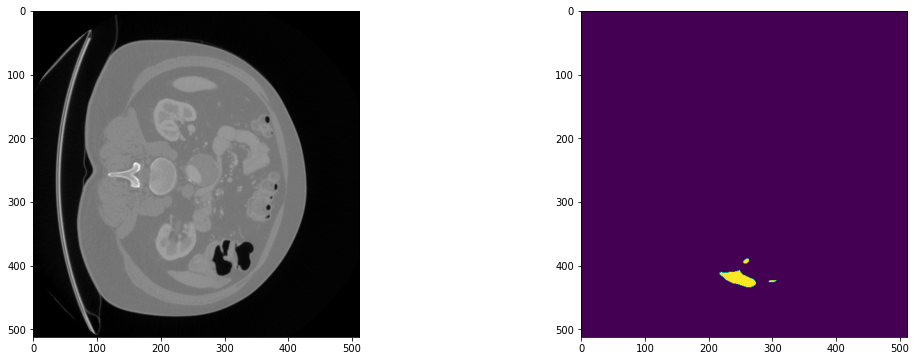

2023-03-24 10:59:21,723 INFO image_writer.py:194 - writing: out/liver_37/liver_37_seg.nii.gz


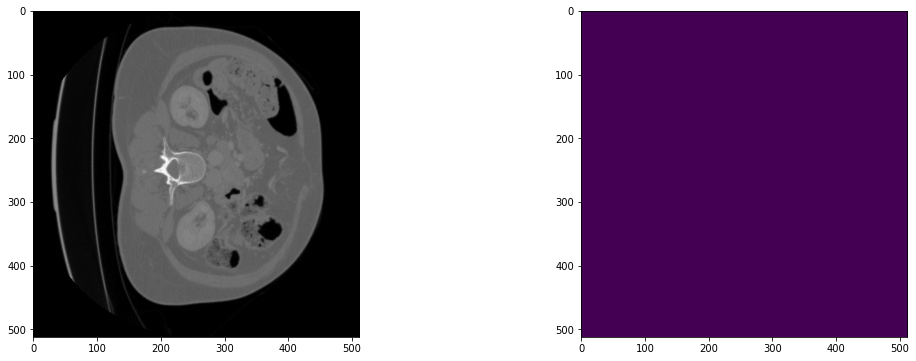

2023-03-24 10:59:28,453 INFO image_writer.py:194 - writing: out/liver_38/liver_38_seg.nii.gz


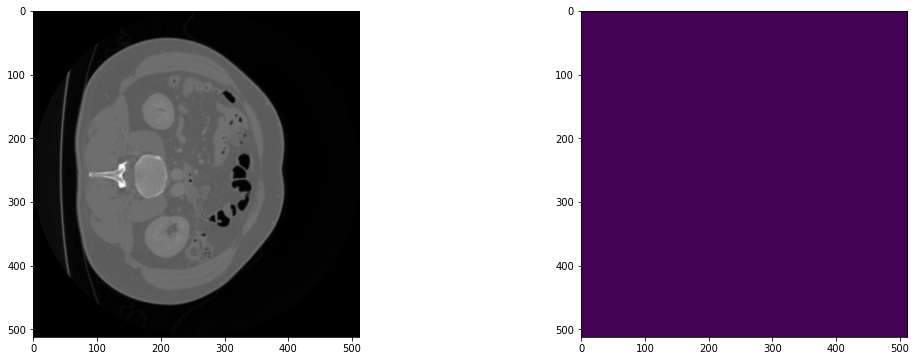

2023-03-24 10:59:35,820 INFO image_writer.py:194 - writing: out/liver_42/liver_42_seg.nii.gz


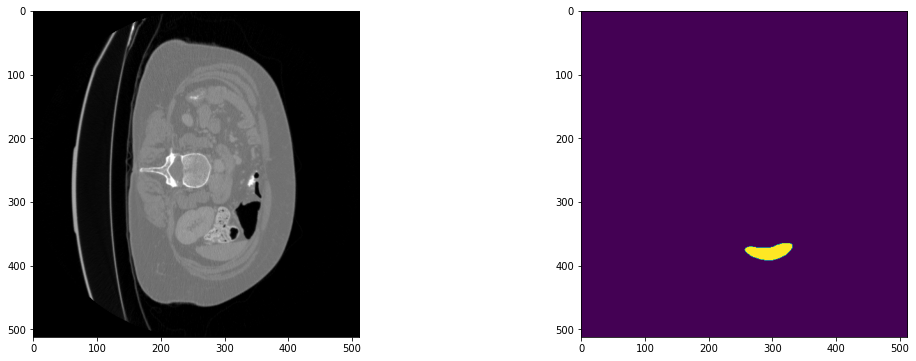

2023-03-24 10:59:43,222 INFO image_writer.py:194 - writing: out/liver_44/liver_44_seg.nii.gz


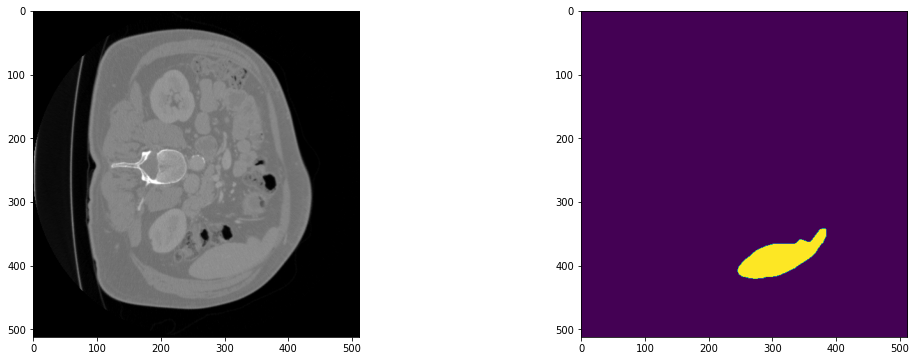

2023-03-24 10:59:51,655 INFO image_writer.py:194 - writing: out/liver_50/liver_50_seg.nii.gz


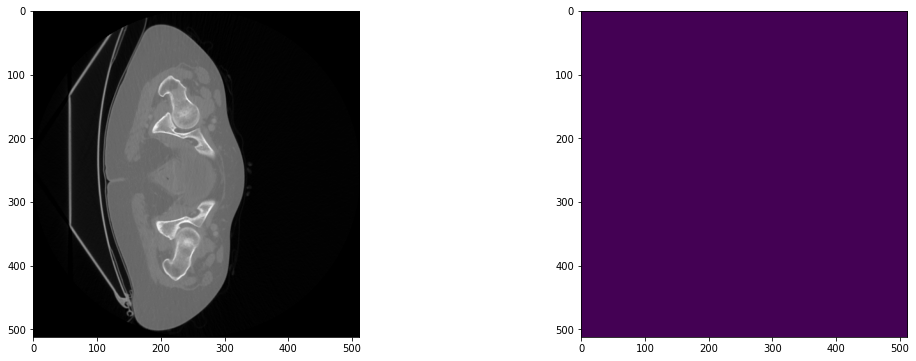

2023-03-24 11:00:05,355 INFO image_writer.py:194 - writing: out/liver_57/liver_57_seg.nii.gz


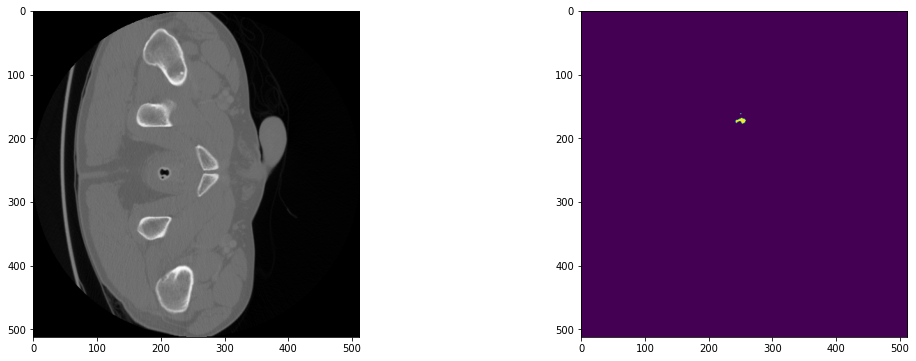

2023-03-24 11:00:26,319 INFO image_writer.py:194 - writing: out/liver_65/liver_65_seg.nii.gz


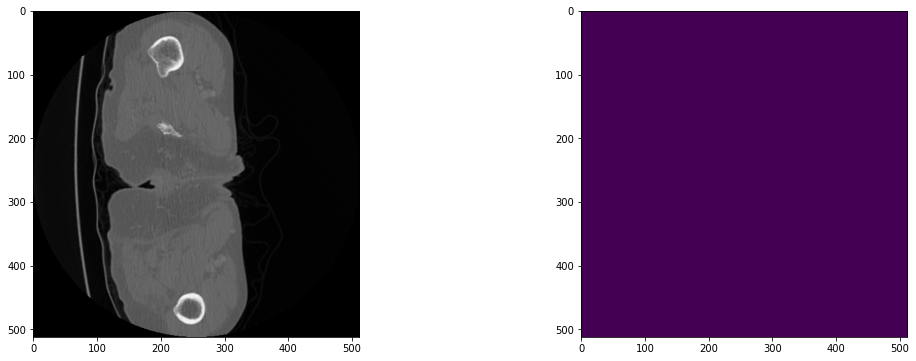

2023-03-24 11:00:56,318 INFO image_writer.py:194 - writing: out/liver_75/liver_75_seg.nii.gz


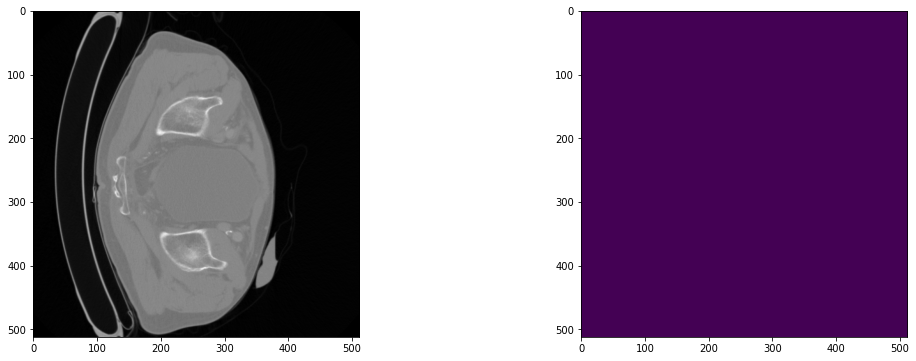

2023-03-24 11:01:02,444 INFO image_writer.py:194 - writing: out/liver_76/liver_76_seg.nii.gz


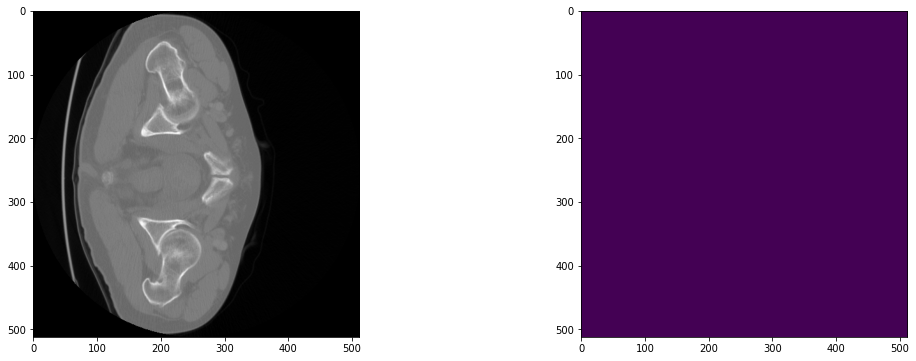

2023-03-24 11:01:13,201 INFO image_writer.py:194 - writing: out/liver_79/liver_79_seg.nii.gz


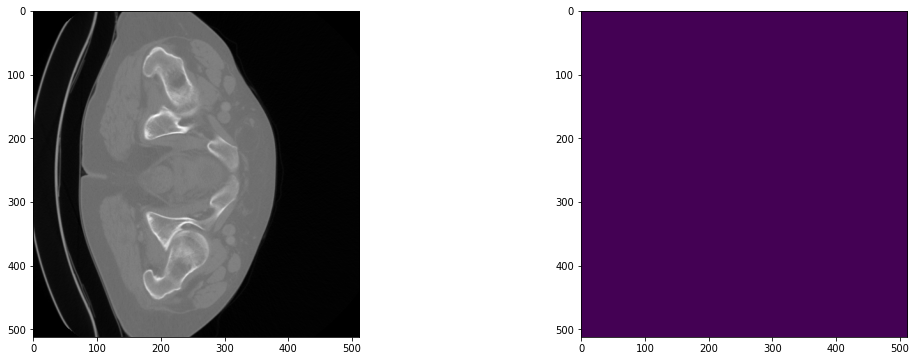

2023-03-24 11:01:23,229 INFO image_writer.py:194 - writing: out/liver_84/liver_84_seg.nii.gz


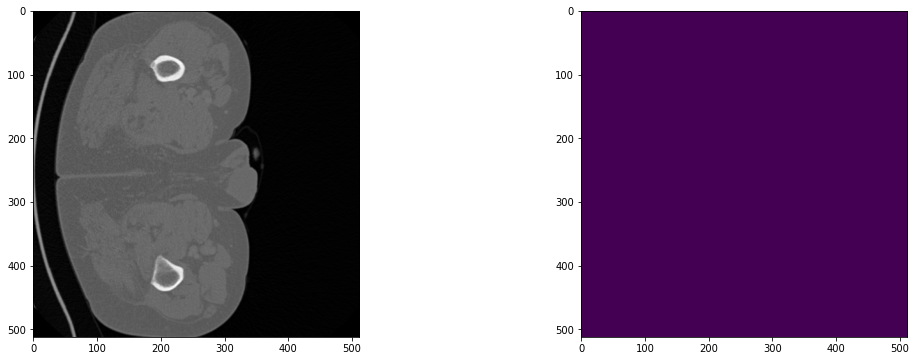

2023-03-24 11:02:07,582 INFO image_writer.py:194 - writing: out/liver_86/liver_86_seg.nii.gz


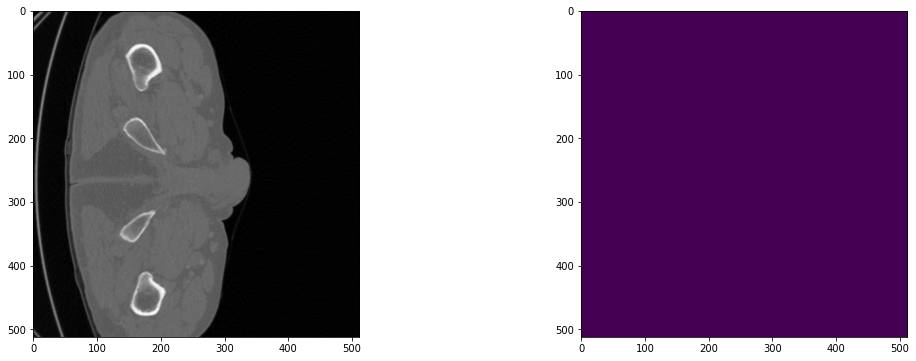

2023-03-24 11:02:48,902 INFO image_writer.py:194 - writing: out/liver_91/liver_91_seg.nii.gz


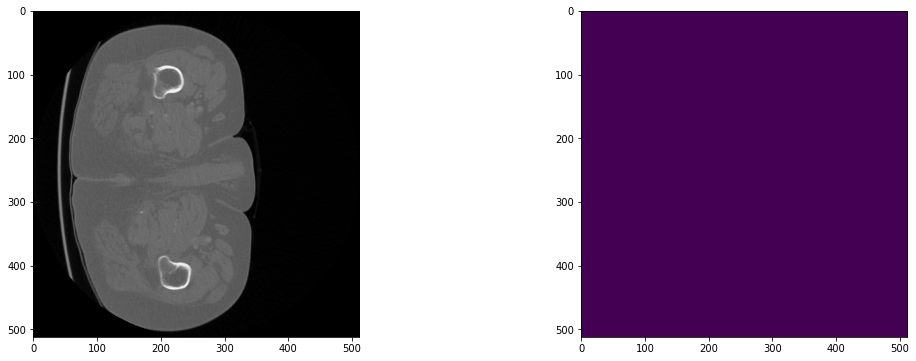

2023-03-24 11:03:34,981 INFO image_writer.py:194 - writing: out/liver_92/liver_92_seg.nii.gz


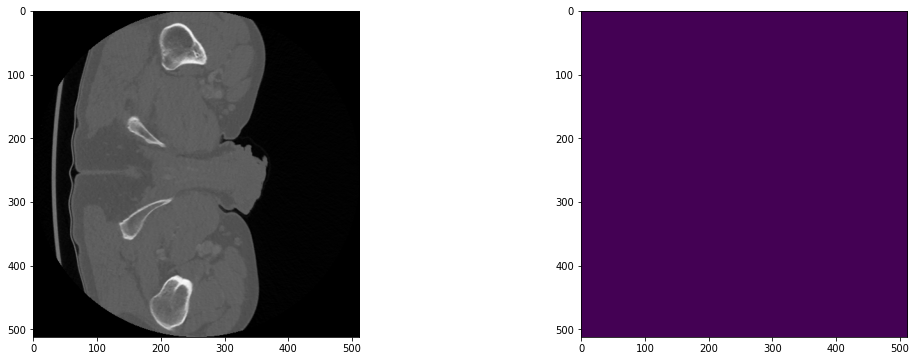

2023-03-24 11:04:25,999 INFO image_writer.py:194 - writing: out/liver_93/liver_93_seg.nii.gz


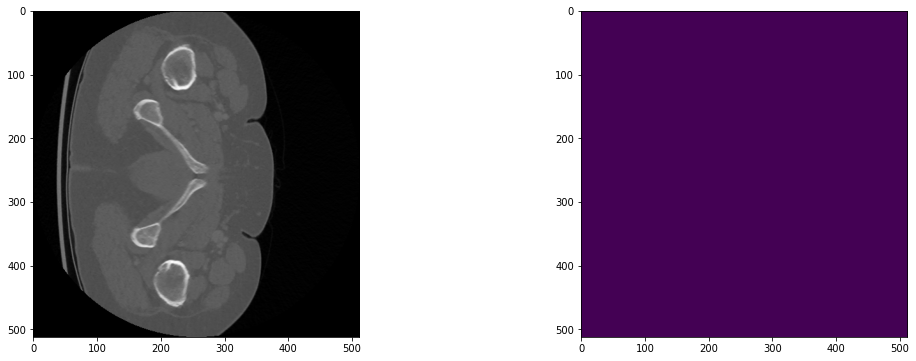

2023-03-24 11:05:06,733 INFO image_writer.py:194 - writing: out/liver_97/liver_97_seg.nii.gz


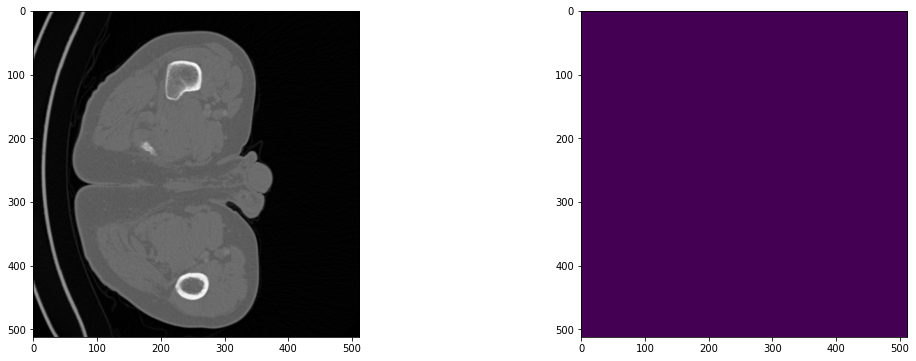

2023-03-24 11:05:48,682 INFO image_writer.py:194 - writing: out/liver_99/liver_99_seg.nii.gz


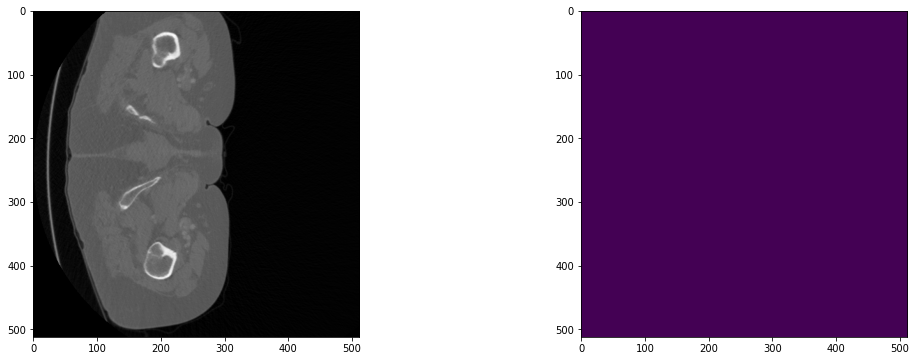

In [ ]:
# liver category is represented by channel 0 and the tumor category is represented by channel 1
model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model4.pth")))
model.eval()

with torch.no_grad():
    for test_data in test_org_loader:
        test_inputs = test_data["image"].to(device)
        roi_size = (128, 128, 64)
        sw_batch_size = 4
        test_data["pred"] = sliding_window_inference(test_inputs, roi_size, sw_batch_size, model)

        test_data = [post_transforms(i) for i in decollate_batch(test_data)]

        # Visualize the predicted results
        test_output = from_engine(["pred"])(test_data)
        original_image = nib.load(test_output[0].meta["filename_or_obj"]).get_fdata()

        plt.figure("check", (18, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(original_image[:, :, 20], cmap="gray")
        plt.subplot(1, 2, 2)
        plt.imshow(test_output[0].detach().cpu()[1, :, :, 20])
        plt.show()

2023-03-24 21:32:04,689 INFO image_writer.py:194 - writing: out/liver_0/liver_0_seg.nii.gz


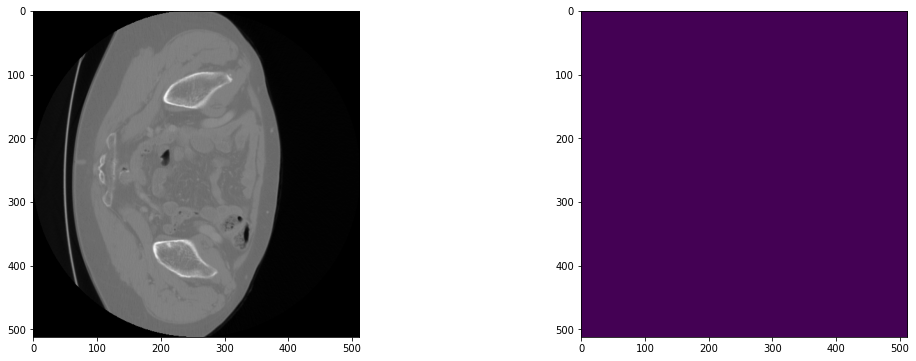

2023-03-24 21:32:09,837 INFO image_writer.py:194 - writing: out/liver_100/liver_100_seg.nii.gz


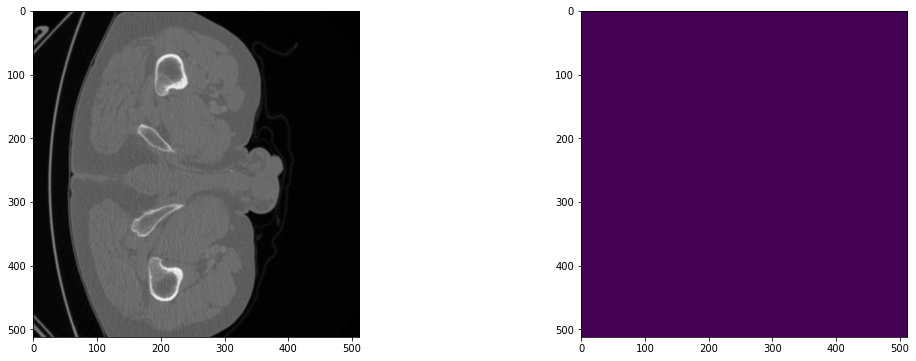

2023-03-24 21:32:44,682 INFO image_writer.py:194 - writing: out/liver_103/liver_103_seg.nii.gz


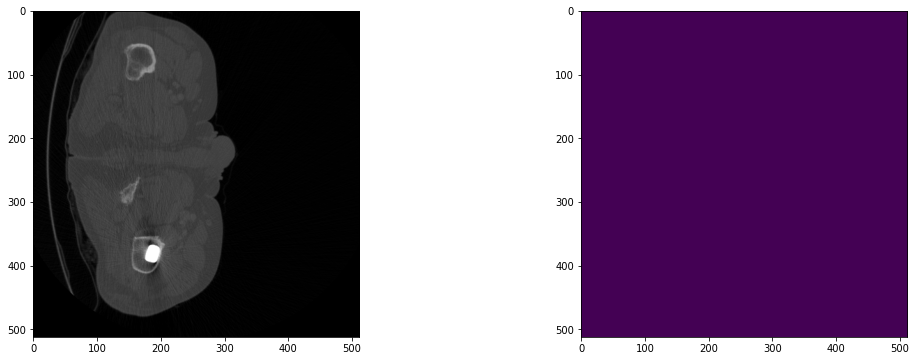

2023-03-24 21:33:20,076 INFO image_writer.py:194 - writing: out/liver_104/liver_104_seg.nii.gz


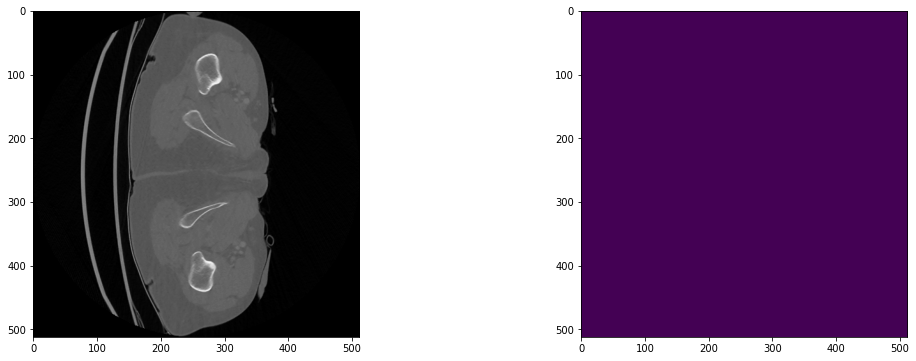

2023-03-24 21:33:58,380 INFO image_writer.py:194 - writing: out/liver_106/liver_106_seg.nii.gz


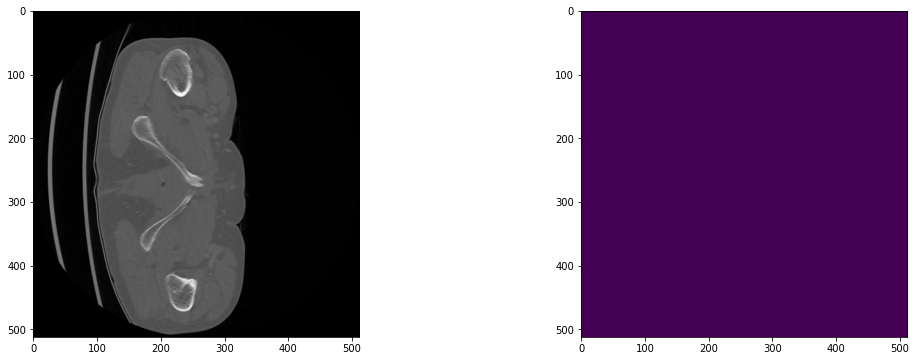

2023-03-24 21:34:37,301 INFO image_writer.py:194 - writing: out/liver_111/liver_111_seg.nii.gz


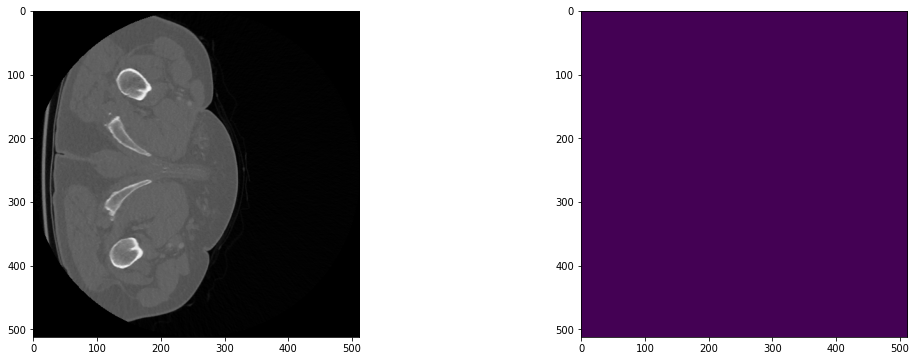

2023-03-24 21:35:16,051 INFO image_writer.py:194 - writing: out/liver_113/liver_113_seg.nii.gz


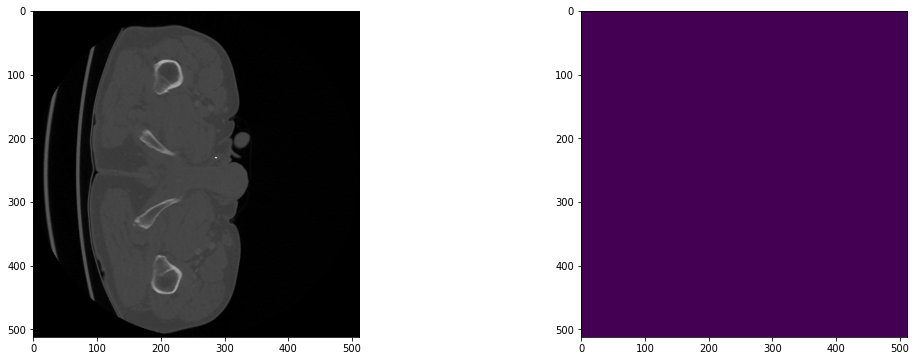

2023-03-24 21:35:58,820 INFO image_writer.py:194 - writing: out/liver_117/liver_117_seg.nii.gz


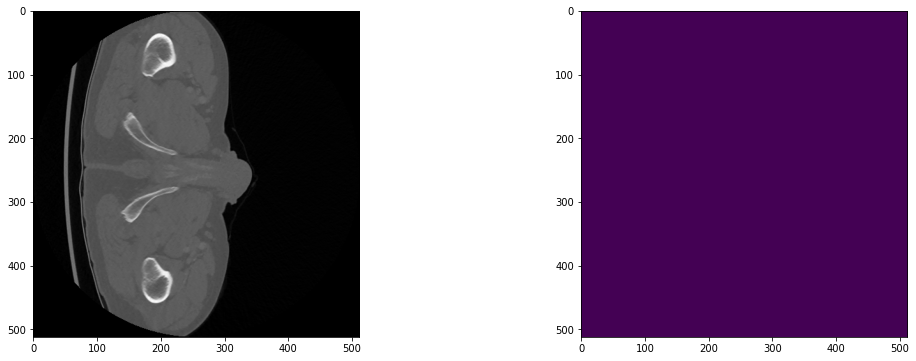

2023-03-24 21:36:42,587 INFO image_writer.py:194 - writing: out/liver_119/liver_119_seg.nii.gz


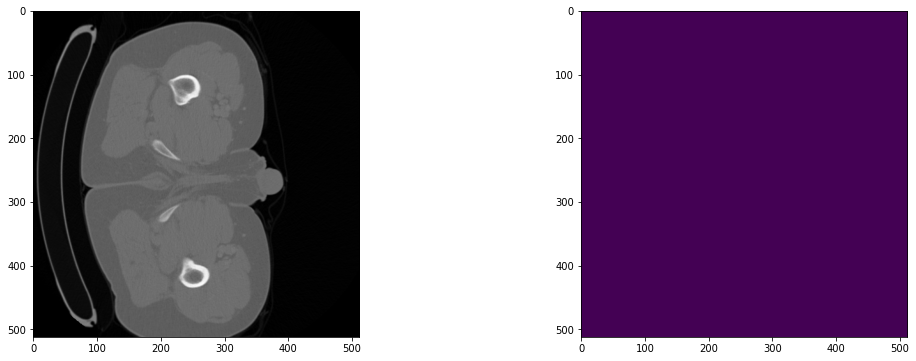

2023-03-24 21:37:06,369 INFO image_writer.py:194 - writing: out/liver_120/liver_120_seg.nii.gz


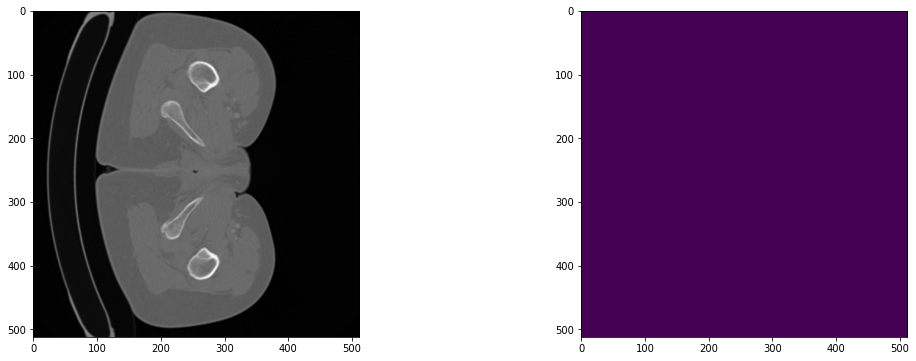

2023-03-24 21:37:30,041 INFO image_writer.py:194 - writing: out/liver_125/liver_125_seg.nii.gz


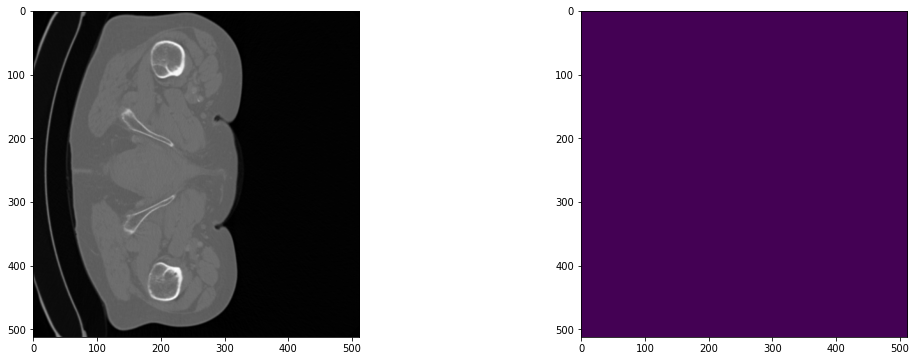

2023-03-24 21:37:53,034 INFO image_writer.py:194 - writing: out/liver_127/liver_127_seg.nii.gz


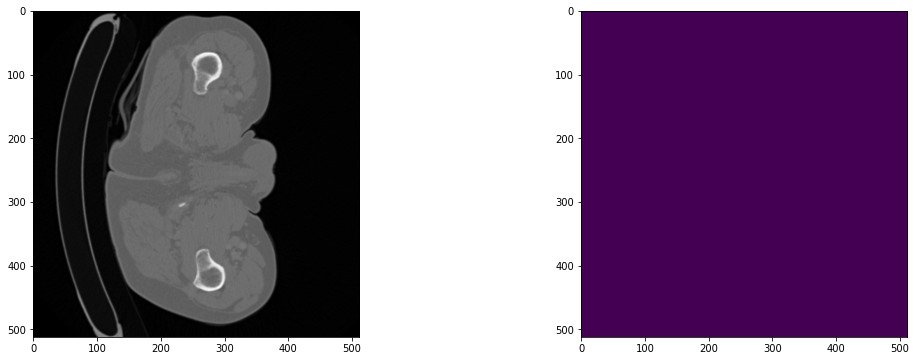

2023-03-24 21:38:41,545 INFO image_writer.py:194 - writing: out/liver_128/liver_128_seg.nii.gz


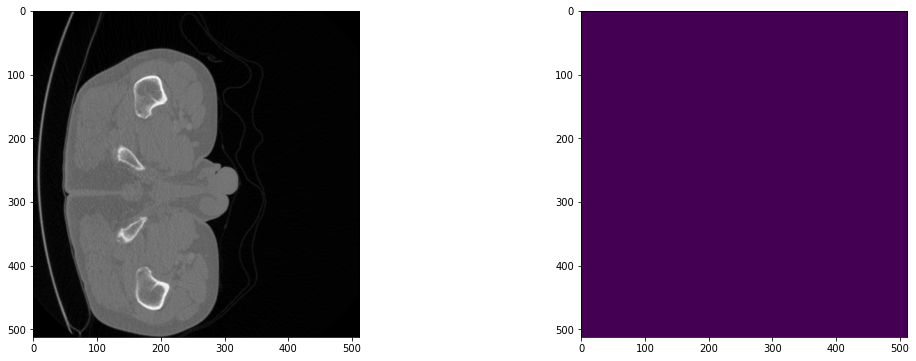

2023-03-24 21:39:16,570 INFO image_writer.py:194 - writing: out/liver_129/liver_129_seg.nii.gz


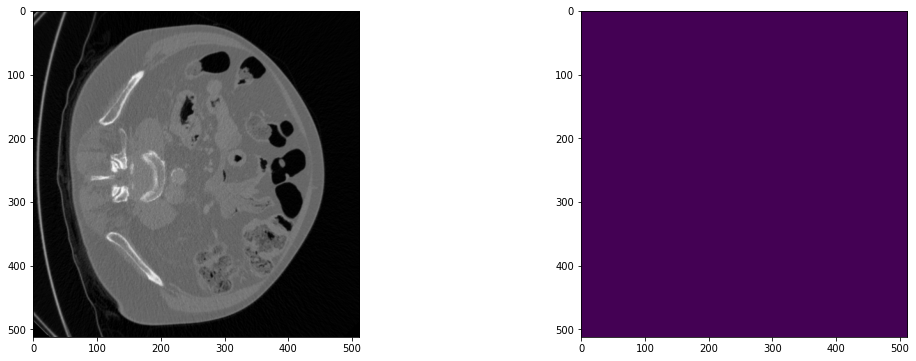

2023-03-24 21:39:35,300 INFO image_writer.py:194 - writing: out/liver_14/liver_14_seg.nii.gz


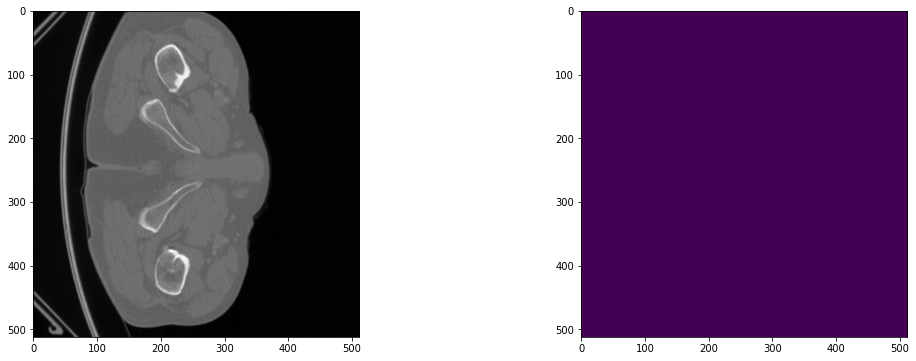

2023-03-24 21:40:05,903 INFO image_writer.py:194 - writing: out/liver_17/liver_17_seg.nii.gz


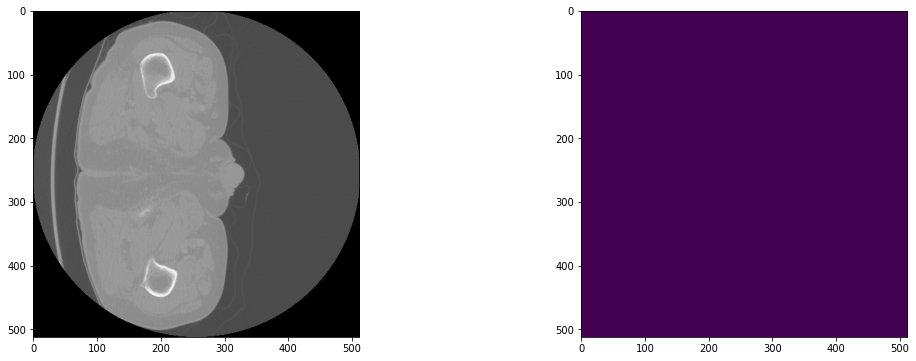

2023-03-24 21:40:50,896 INFO image_writer.py:194 - writing: out/liver_2/liver_2_seg.nii.gz


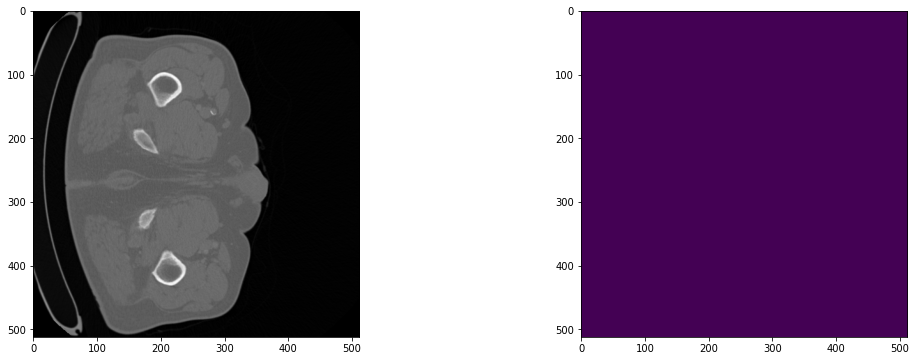

2023-03-24 21:41:17,914 INFO image_writer.py:194 - writing: out/liver_21/liver_21_seg.nii.gz


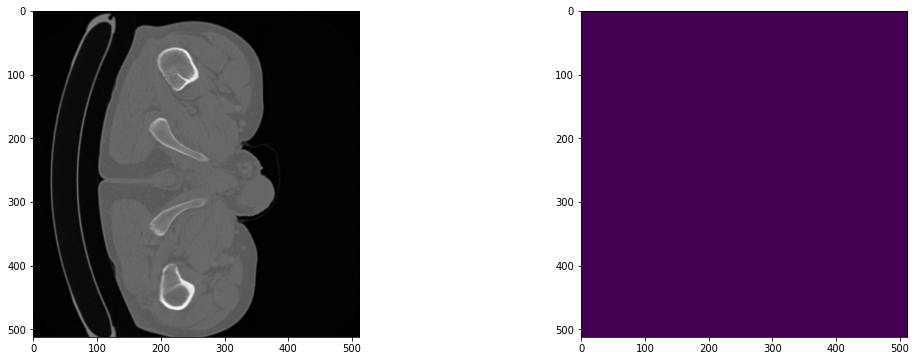

2023-03-24 21:41:40,038 INFO image_writer.py:194 - writing: out/liver_24/liver_24_seg.nii.gz


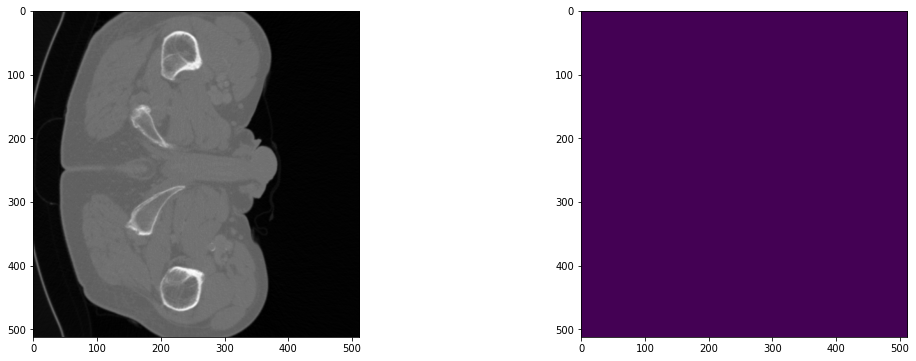

2023-03-24 21:41:55,293 INFO image_writer.py:194 - writing: out/liver_27/liver_27_seg.nii.gz


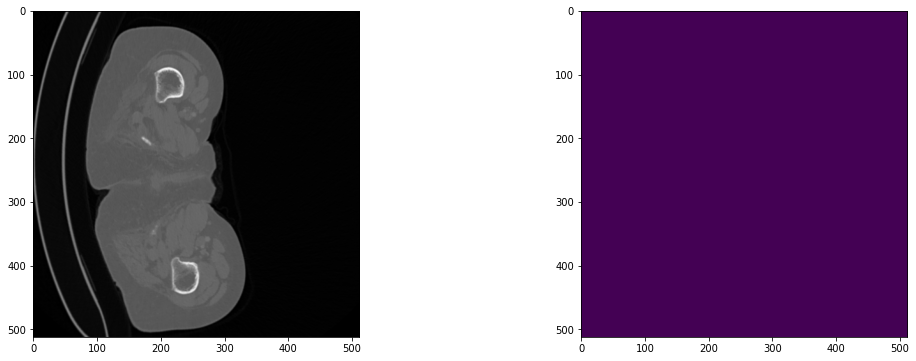

2023-03-24 21:42:41,154 INFO image_writer.py:194 - writing: out/liver_30/liver_30_seg.nii.gz


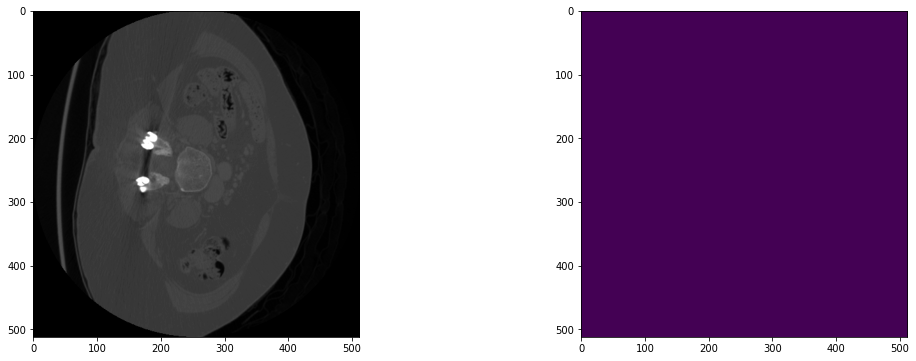

2023-03-24 21:42:50,930 INFO image_writer.py:194 - writing: out/liver_32/liver_32_seg.nii.gz


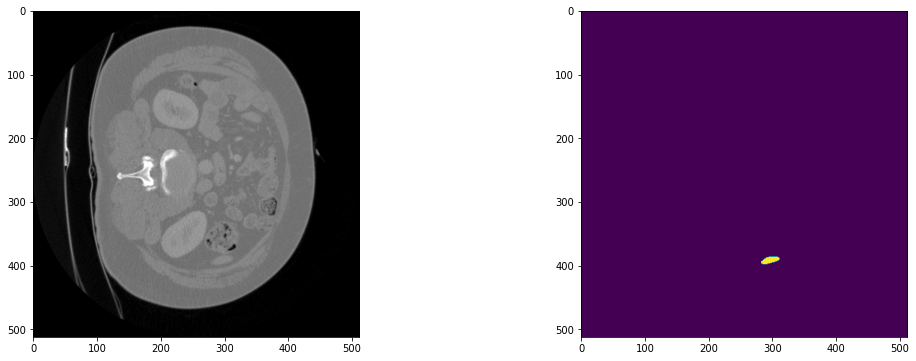

2023-03-24 21:42:58,005 INFO image_writer.py:194 - writing: out/liver_34/liver_34_seg.nii.gz


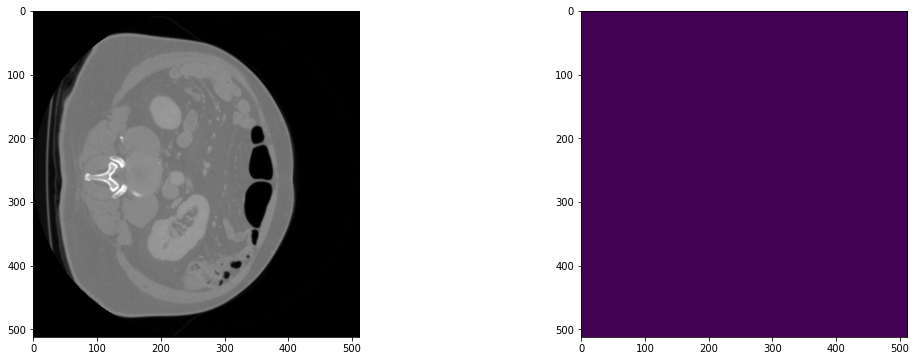

2023-03-24 21:43:05,440 INFO image_writer.py:194 - writing: out/liver_35/liver_35_seg.nii.gz


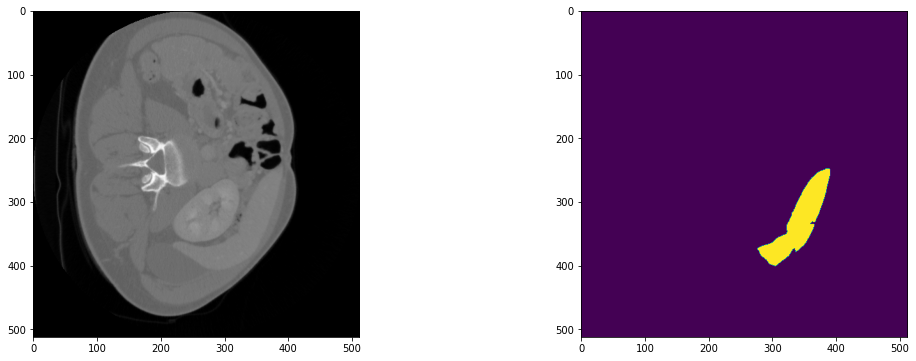

2023-03-24 21:43:11,737 INFO image_writer.py:194 - writing: out/liver_36/liver_36_seg.nii.gz


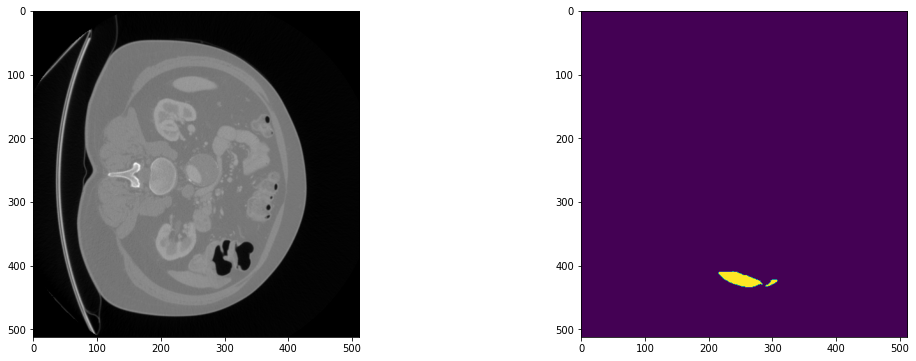

2023-03-24 21:43:17,391 INFO image_writer.py:194 - writing: out/liver_37/liver_37_seg.nii.gz


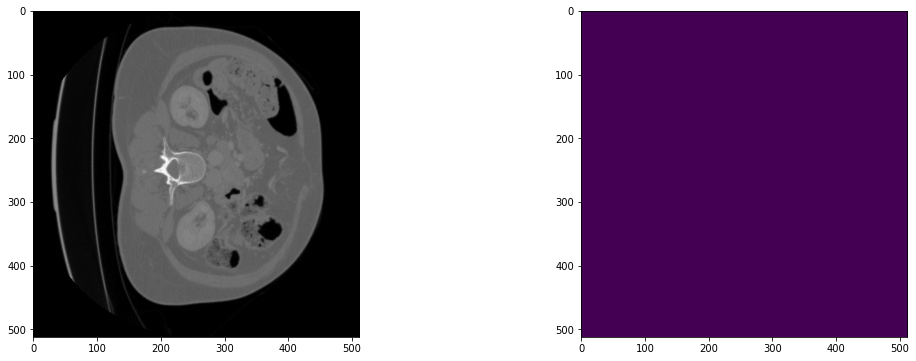

2023-03-24 21:43:23,533 INFO image_writer.py:194 - writing: out/liver_38/liver_38_seg.nii.gz


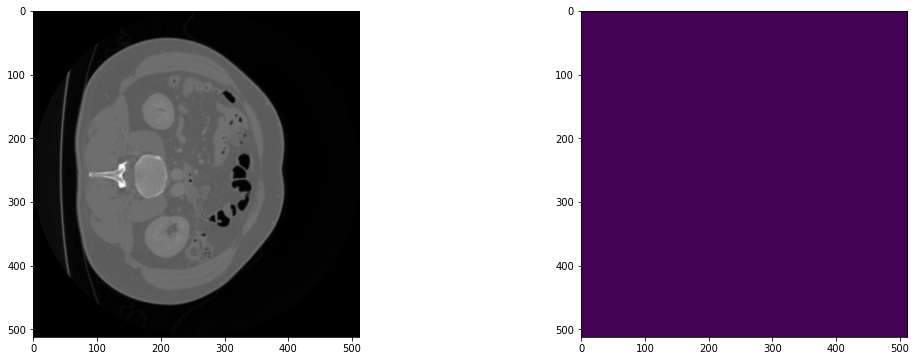

2023-03-24 21:43:30,250 INFO image_writer.py:194 - writing: out/liver_42/liver_42_seg.nii.gz


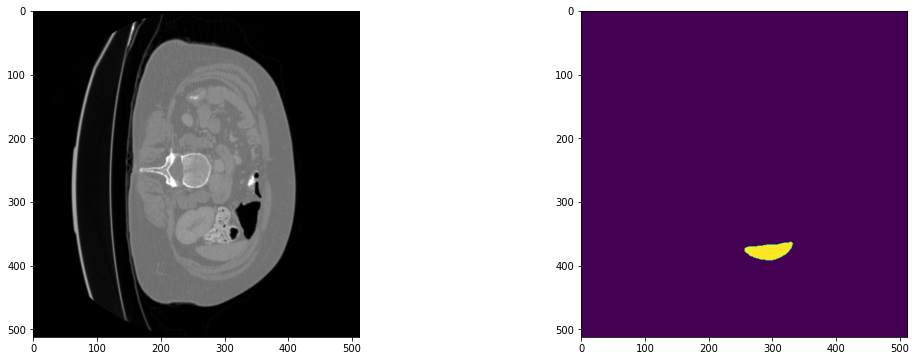

2023-03-24 21:43:36,821 INFO image_writer.py:194 - writing: out/liver_44/liver_44_seg.nii.gz


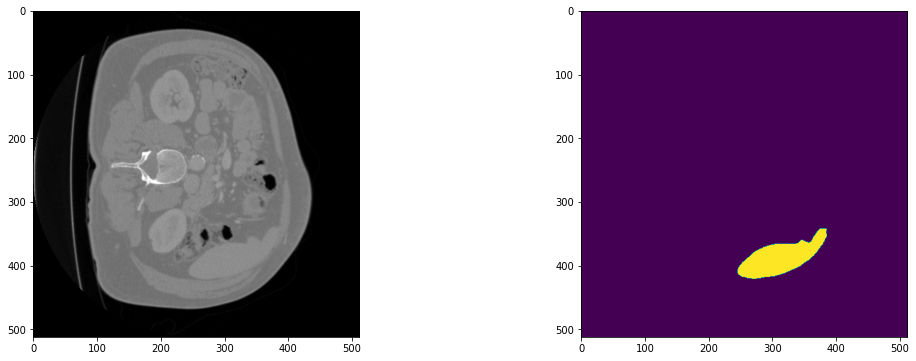

2023-03-24 21:43:44,578 INFO image_writer.py:194 - writing: out/liver_50/liver_50_seg.nii.gz


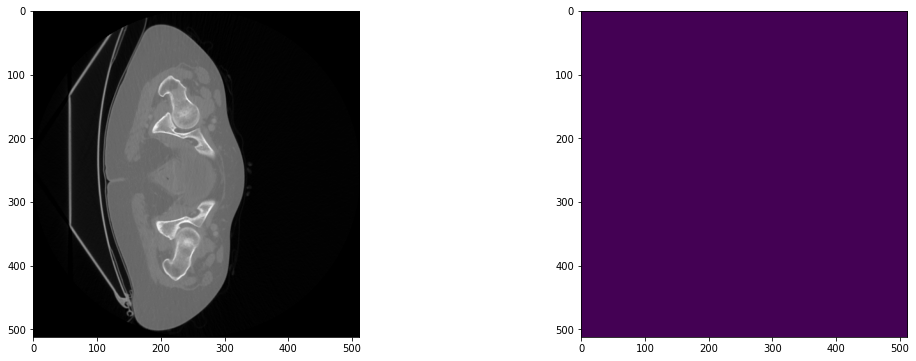

2023-03-24 21:43:57,151 INFO image_writer.py:194 - writing: out/liver_57/liver_57_seg.nii.gz


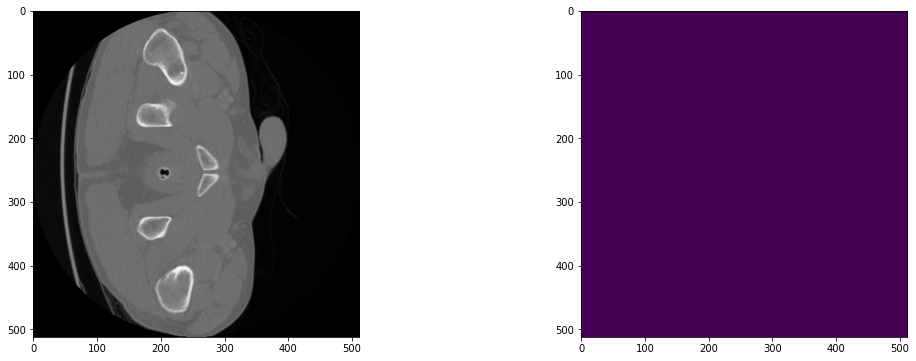

2023-03-24 21:44:15,444 INFO image_writer.py:194 - writing: out/liver_65/liver_65_seg.nii.gz


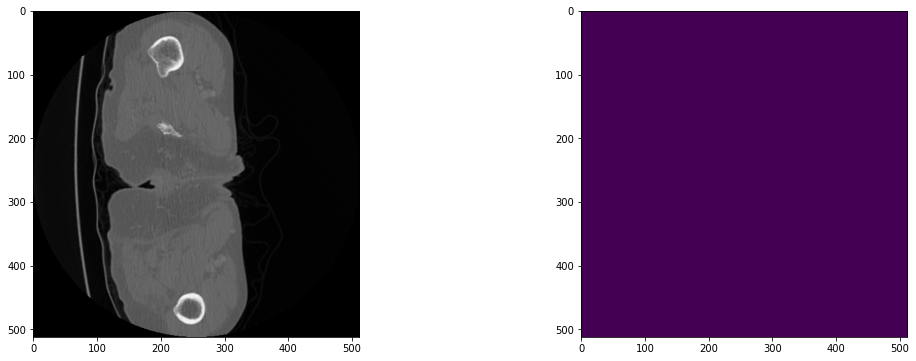

2023-03-24 21:44:42,471 INFO image_writer.py:194 - writing: out/liver_75/liver_75_seg.nii.gz


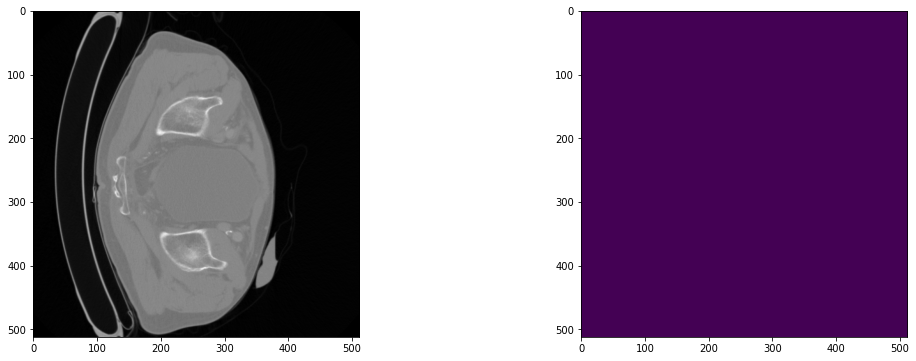

2023-03-24 21:44:48,164 INFO image_writer.py:194 - writing: out/liver_76/liver_76_seg.nii.gz


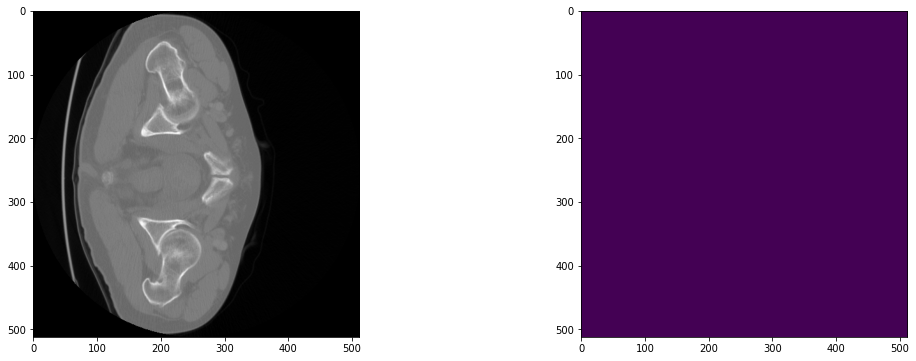

2023-03-24 21:44:58,632 INFO image_writer.py:194 - writing: out/liver_79/liver_79_seg.nii.gz


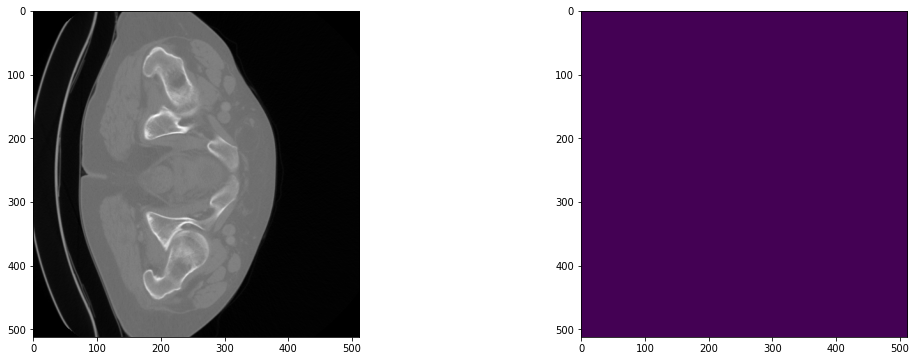

2023-03-24 21:45:08,326 INFO image_writer.py:194 - writing: out/liver_84/liver_84_seg.nii.gz


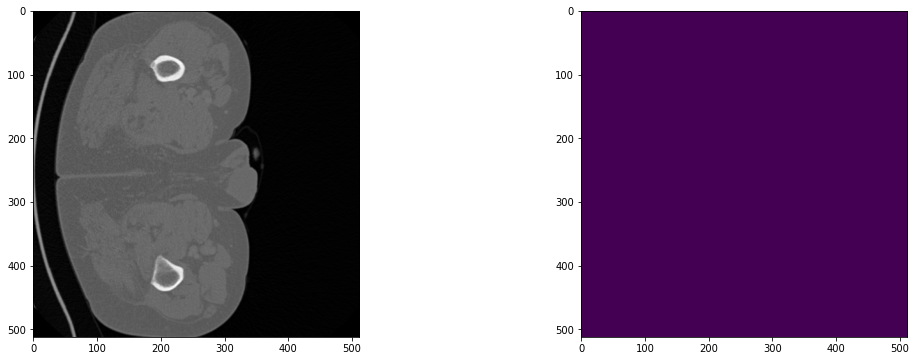

2023-03-24 21:45:45,890 INFO image_writer.py:194 - writing: out/liver_86/liver_86_seg.nii.gz


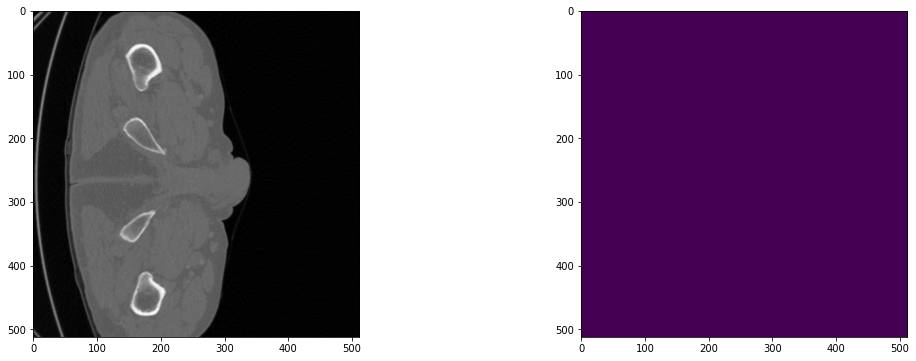

2023-03-24 21:46:21,786 INFO image_writer.py:194 - writing: out/liver_91/liver_91_seg.nii.gz


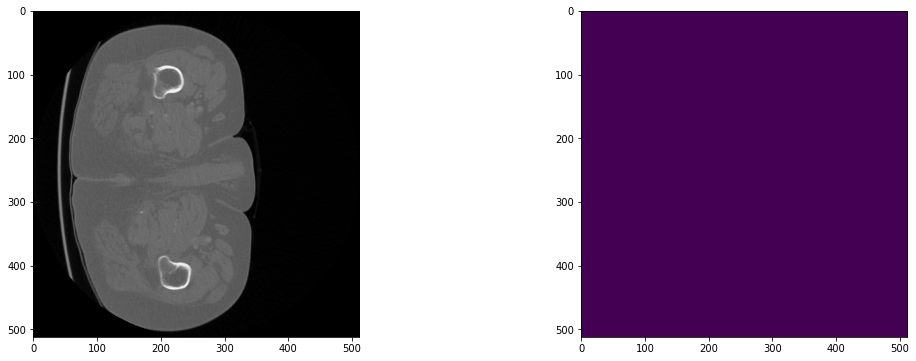

2023-03-24 21:47:00,848 INFO image_writer.py:194 - writing: out/liver_92/liver_92_seg.nii.gz


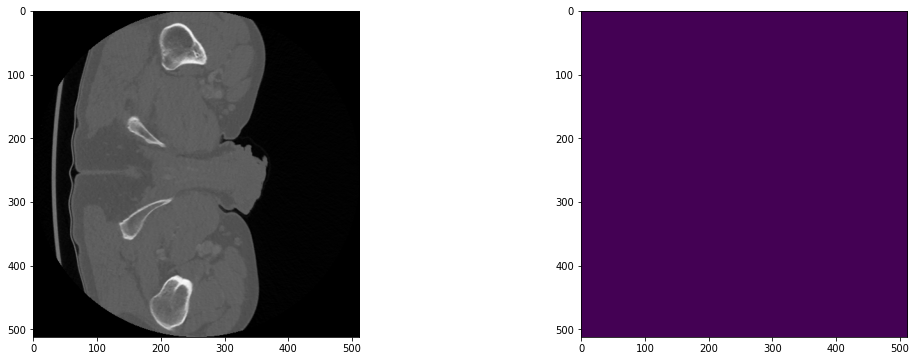

2023-03-24 21:47:43,387 INFO image_writer.py:194 - writing: out/liver_93/liver_93_seg.nii.gz


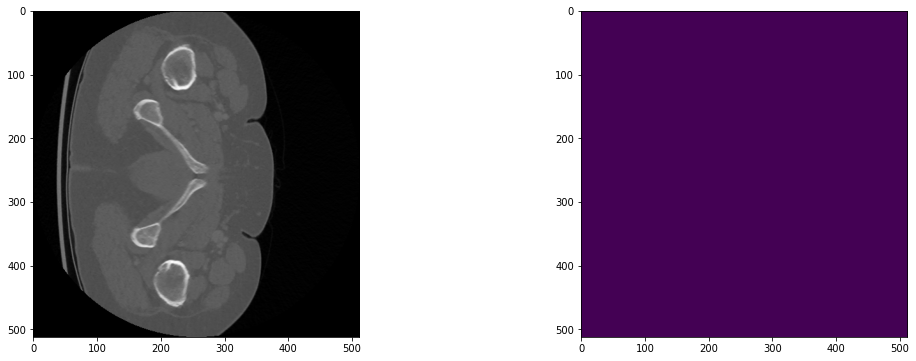

2023-03-24 21:48:18,641 INFO image_writer.py:194 - writing: out/liver_97/liver_97_seg.nii.gz


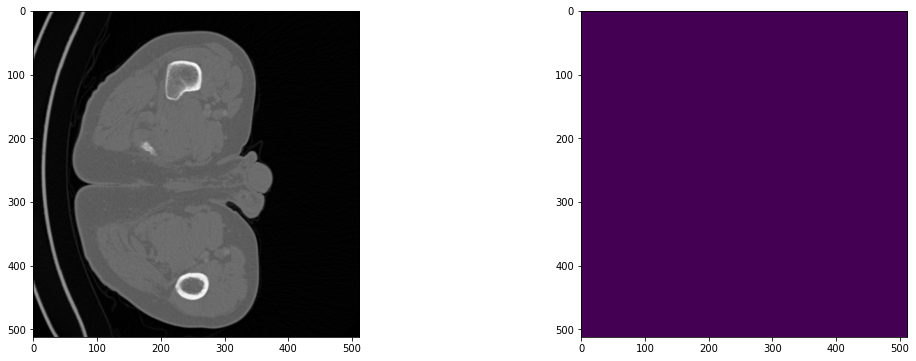

2023-03-24 21:48:54,501 INFO image_writer.py:194 - writing: out/liver_99/liver_99_seg.nii.gz


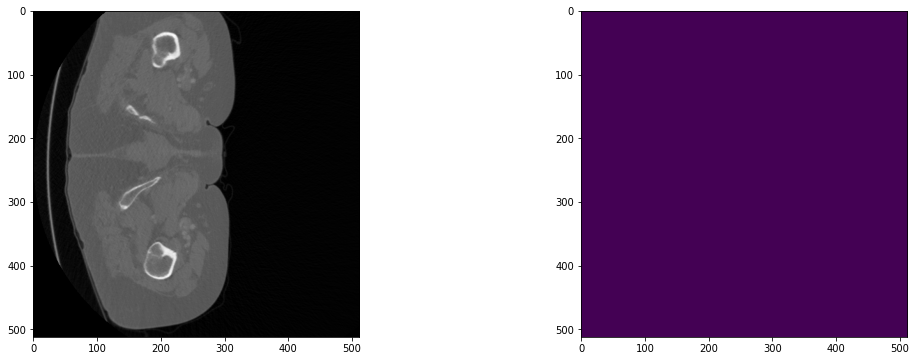

In [ ]:
# liver category is represented by channel 0 and the cancer category is represented by channel 1
model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model4.pth")))
model.eval()

with torch.no_grad():
    for test_data in test_org_loader:
        test_inputs = test_data["image"].to(device)
        roi_size = (128, 128, 64)
        sw_batch_size = 4
        test_data["pred"] = sliding_window_inference(test_inputs, roi_size, sw_batch_size, model)

        test_data = [post_transforms(i) for i in decollate_batch(test_data)]

        # Visualize the predicted results
        test_output = from_engine(["pred"])(test_data)
        original_image = nib.load(test_output[0].meta["filename_or_obj"]).get_fdata()

        plt.figure("check", (18, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(original_image[:, :, 20], cmap="gray")
        plt.subplot(1, 2, 2)
        plt.imshow(test_output[0].detach().cpu()[1, :, :, 20])
        plt.show()

## **Report**

---





For adjusting my loss function "Generalized Dice Loss", I use Focal Loss in conjunction with it. By combining the advantages of GDL and Focal Loss, this new loss function helps the model to focus on hard-to-classify examples, while also taking into account the overlap between predicted segmentation and ground truth. The loss function is calculated as GeneralisedDiceFocalLoss = (1 - GDL) * Focal Loss.

As this combination already exists in the MONAI open source library, I directly called GeneralizedDiceFocalLoss as the new loss function. the GeneralizedDiceFocalLoss function can potentially improve the network's ability to segment small tumors in imbalanced datasets. By combining the Generalized Dice Score and Focal Loss, the loss function is designed to address the class imbalance issue, which is particularly important for small tumors. By doing so, Focal Loss focuses on harder-to-classify examples, such as small tumors, which often have a higher misclassification rate. In this loss function, I set the Focal weight to [0.0, 1.0, 2.0], assigning more weights to the cancer class and weights of 0 and 1 to the background and liver classes, which allows the model to learn more effectively from the underrepresented cancer class as a way to improve the network's ability to segment small tumours.

According to the test results, the number of tumour labels displayed in the colour map has increased compared with using only the GeneralizedDiceLoss function as a loss function. The lifting effect is evident in the colour charts of liver_113_seg, liver_119_seg, liver_35_seg, liver_36_seg and liver_57_seg. As the model was previously poor at segmenting smaller liver tumours, with this combination applied, the model's ability to segment small tumours is improved.

# **Uncertainty estimates**

---


In [ ]:
from glob import glob
from monai.data import TestTimeAugmentation

In [ ]:
# Load the Test data
test_images = sorted(glob(os.path.join(data_dir, "Test/imagesTr", "*.nii.gz")))
test_labels = sorted(glob(os.path.join(data_dir, "Test/labelsTr", "*.nii.gz")))

test_data = [{"image": image, "label": label} for image, label in zip(test_images, test_labels)]

In [ ]:
# Define the test transforms for Test-time Augmentation by adding RandAffined
test_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        EnsureChannelFirstd(keys=["image", "label"]),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-200,
            a_max=200,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(keys=["image", "label"], pixdim=(1.5, 1.5, 1.0), mode=("bilinear", "nearest")),
        RandAffined(
            keys=["image", "label"],
            mode=("bilinear", "nearest"),
            prob=1.0, spatial_size=(128, 128, 64),
            rotate_range=(0, 0, np.pi/15),
            scale_range=(0.1, 0.1, 0.1),
            padding_mode="border",
            ),
    ]
)

In [ ]:
# Define transforms just to be able to show the unmodified originals
test_org_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        EnsureChannelFirstd(keys=["image", "label"]),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(keys=["image", "label"], pixdim=(1.5, 1.5, 1.0), mode="bilinear"),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-200,
            a_max=200,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
    ]
)

In [ ]:
# Set the device to GPU
device = torch.device("cuda:0")

# Load the pre-trained VNet model
model = VNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=3,
    dropout_prob=0.5,
).to(device)
model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model4.pth")))
model.eval()

VNet(
  (in_tr): InputTransition(
    (act_function): ELU(alpha=1.0, inplace=True)
    (conv_block): Convolution(
      (conv): Conv3d(1, 16, kernel_size=(5, 5, 5), stride=(1, 1, 1), padding=(2, 2, 2), bias=False)
      (adn): ADN(
        (N): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
  )
  (down_tr32): DownTransition(
    (down_conv): Conv3d(16, 32, kernel_size=(2, 2, 2), stride=(2, 2, 2), bias=False)
    (bn1): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act_function1): ELU(alpha=1.0, inplace=True)
    (act_function2): ELU(alpha=1.0, inplace=True)
    (ops): Sequential(
      (0): LUConv(
        (act_function): ELU(alpha=1.0, inplace=True)
        (conv_block): Convolution(
          (conv): Conv3d(32, 32, kernel_size=(5, 5, 5), stride=(1, 1, 1), padding=(2, 2, 2), bias=False)
          (adn): ADN(
            (N): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=Tr

In [ ]:
# Define the Visualisation function For 3D data to visualise the uncertainty estimates
def imshows(ims):
    # initialize with the length of rows and columns
    nrow = len(ims)
    ncol = len(ims[0])
    fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 3, nrow * 3), facecolor="white")

    # iterate over each row and column of the ims list
    for i, im_dict in enumerate(ims):
        for j, (title, im) in enumerate(im_dict.items()):
            # check whether the image is a torch.Tensor and converts it to a numpy array if it is
            if isinstance(im, torch.Tensor):
                im = im.detach().cpu().numpy()
            if im.ndim == 3:  # for 3D images
                im = np.transpose(im, (1, 2, 0))  # reorder dimensions to (height, width, depth)

            if im.ndim == 4:  # if multiple channels, average across channels
                im = np.mean(im, axis=0)

            # check whether there is only one row in the subplot layout
            if len(ims) == 1:
                ax = axes[j]
            else:
                ax = axes[i, j]

            # A title is set for the subplot and the image is displayed with a colorbar
            ax.set_title(f"{title}\n{im.shape}")
            im_show = ax.imshow(im[:, :, im.shape[2] // 2])  # show the middle slice along the depth dimension
            ax.axis("off")
            fig.colorbar(im_show, ax=ax)


100%|██████████| 2/2 [01:40<00:00, 50.32s/it]


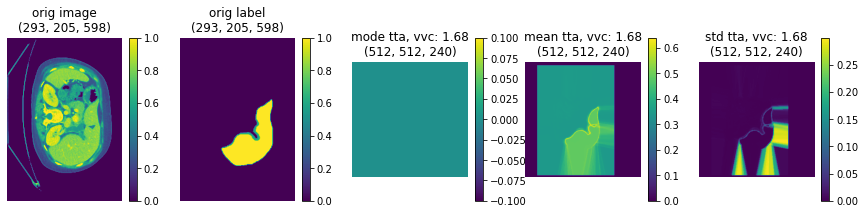

In [ ]:
# Define a instance of the TestTimeAugmentation
tta = TestTimeAugmentation(
    test_transforms, batch_size=5, num_workers=0, inferrer_fn=lambda x: torch.sigmoid(model(x)), device=device
)

# store the images to be displayed
to_imshow = []

# Get images
for file in np.random.choice(test_data, size=1, replace=False):

    mode_tta, mean_tta, std_tta, vvc_tta = tta(file, num_examples=10)
    unmodified_data = test_org_transforms(file)

    # Visualisation
    to_imshow.append(
        {
            "orig image": unmodified_data["image"],
            "orig label": unmodified_data["label"],
            "mode tta, vvc: %.2f" % vvc_tta: mode_tta,
            "mean tta, vvc: %.2f" % vvc_tta: mean_tta,
            "std tta, vvc: %.2f" % vvc_tta: std_tta,
        }
    )
imshows(to_imshow)

## **Report**

---




In the uncertainty estimation visualisation section, I implemented the method presented in the study by implementing TestTimeAugmentation in the MONAI architecture and also have defined a function to visualise the results.. The change in voxel number (vvc_tta) is a measure of the variance or uncertainty of the segmentation predictions obtained using test-time augmentation. For the test-time augmentation, I define a test transformation for TestTimeAugmentation to apply by adding RandAffined random transform to implement invertible transformations and extract the output via a sigmoid activation function as an inference function. num_examples is set to 10 and the network will, for a randomly selected image, generate 10 augmented versions while the model generates a prediction for each augmented version. The result is a segmentation due to differences caused by random transformations. Each segment is inverted and the results are averaged. The mode, mean, standard deviation and coefficient of volume change are returned and these are used later in the uncertainty estimation.


According to the visualisation of results correspond to the test-time augmentation (TTA) applied to the test dataset, vvc_tta (voxel-wise variance coefficient) is 1.68, which represents the voxel-wise variance coefficient across the TTA predictions. A higher value indicates greater uncertainty in the predictions. The voxel-wise variance coefficient of 1.68 indicates a moderate level of overall uncertainty across the TTA predictions. The value of  mode_tta is 0, which suggests that the model predicts the background (or liver) class most frequently. The value of mean_tta in other regions is around 0.3 and the value of mean_tta in liver regions is about 0.55, this suggests that the model is more confident about the liver class than cancer class. This may be due to the cancer being too small or the absence of a cancer in the selected section not being shown. The value of std_tta in liver class is about 0.05 and the value of std_tta in other regions is about 0.25 and 0.35. This suggests that the predictions for the liver class are more consistent and have less variability compared to the other classes. A higher standard deviation indicates greater uncertainty in the model's predictions for cancer class.

In summary, there is a higher level of uncertainty in the predictions for the cancer class. In the context of medical image segmentation, high uncertainty regions might correspond to areas where the model struggles to differentiate between different anatomical structures or pathologies, such as small tumour. Areas of high uncertainty in the model's predictions are generally more error-prone. High uncertainty indicates that the model is less confident in its predictions for cancer regions, which could be due to factors such as the presence of ambiguous features, artifacts, or noise in the image. As a result, the model's performance in these areas might be less accurate compared to liver areas of low uncertainty.


# **(Ensemble Method)**

---

**Each of the following is using different networks, loss functions, augmentation methods and uncertainty estimation methods:**

*   2D UNet (https://arxiv.org/abs/1505.04597) ---- Dice Score
(http://far.in.tum.de/pub/milletari2016Vnet/milletari2016Vnet.pdf)

*   HighResNet (https://arxiv.org/abs/1707.01992) ---- Generalised Dice Score (https://arxiv.org/abs/1707.03237)

*   VNet  (https://arxiv.org/abs/1606.04797) ---- Weighted Cross Entropy (https://arxiv.org/pdf/1505.04597.pdf)

*   Deep Medic (https://arxiv.org/abs/1603.05959) ---- Top-K Loss  (https://arxiv.org/pdf/1605.06885.pdf)

*   HighResNet (https://arxiv.org/abs/1707.01992) ---- Dice Score (http://far.in.tum.de/pub/milletari2016Vnet/milletari2016Vnet.pdf)


*   VNet ---- Generalised Dice Score  (My Part)





**Combine the segmentation models of everyone into a single consensus model via ensembling** (https://arxiv.org/pdf/1711.01468.pdf)


# **Loading Test Data**

---



In [ ]:
from glob import glob

In [ ]:
test_images = sorted(glob(os.path.join(data_dir, "Test/imagesTr", "*.nii.gz")))
test_labels = sorted(glob(os.path.join(data_dir, "Test/labelsTr", "*.nii.gz")))

test_data = [{"image": image, "label": label} for image, label in zip(test_images, test_labels)]

test_org_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        EnsureChannelFirstd(keys=["image", "label"]),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-200,
            a_max=200,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(keys=["image", "label"], pixdim=(1.5, 1.5, 1.0), mode=("bilinear", "nearest")),
    ]
)

# Use Cacheddataset to speed up validation of test sets
test_org_ds = CacheDataset(data=test_data, transform=test_org_transforms, cache_rate=1.0, num_workers=4)
# test_org_ds = Dataset(data=test_data, transform=test_org_transforms)

test_org_loader = DataLoader(test_org_ds, batch_size=1, num_workers=4)

Loading dataset: 100%|██████████| 42/42 [02:39<00:00,  3.79s/it]


# **Loading Pre-trained model**

---



In [ ]:
from monai.networks.nets import UNet, HighResNet
from model import DeepMedic

In [ ]:
device = torch.device("cuda:0")

model1 = VNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=3,
).to(device)

model2 = VNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=3,
).to(device)

model3 = UNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=3,
    channels=(16, 32, 64, 128, 256),
    strides=(2, 2, 2, 2),
    num_res_units=2,
    norm=Norm.BATCH,
).to(device)

model4 = HighResNet(spatial_dims=3, in_channels=1, out_channels=3).to(device)

model5 = HighResNet(spatial_dims=3, in_channels=1, out_channels=3).to(device)

model6 = DeepMedic(in_channels=1, out_channels=3).to(device)

In [ ]:
# Load pre-trained models for each individual
model1.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model4.pth"))) # My pre-trained model
model2.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model_VNet_CEL.pth")))
model3.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model_UNet_DL.pth")))
model4.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model_HighResNet_Dice_Score.pth")))
model5.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model_HighResNet_GDS.pth")))
model6.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model_deepmedic_tkl.pth")))

model1.eval()
model2.eval()
model3.eval()
model4.eval()
model5.eval()
model6.eval()

# Without Ensembling

In [ ]:
device = torch.device("cuda:0")

# My pre-trained model
model = VNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=3,
).to(device)

model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model4.pth")))
model.eval()

In [ ]:
# Use the dice score as metric
dice_score = DiceMetric(include_background=False, reduction="mean")

# Process the model's output and ground truth labels
pred = Compose([AsDiscrete(argmax=True, to_onehot=3)])
label = Compose([AsDiscrete(to_onehot=3)])
metric_values = []

with torch.no_grad():
  for test_data in test_org_loader:
    test_inputs, test_labels = (
                test_data["image"].to(device),
                test_data["label"].to(device),
    )

    roi_size = (128, 128, 64)
    sw_batch_size = 4
    test_outputs = sliding_window_inference(test_inputs, roi_size, sw_batch_size, model)


    # Calculate the Dice metric for the model's predictions
    test_outputs = [pred(i) for i in decollate_batch(test_outputs)]
    test_labels = [label(i) for i in decollate_batch(test_labels)]

    # Compute metric for current iteration
    dice_score(y_pred=test_outputs, y=test_labels)
    # Aggregate the final mean dice result
    metric = dice_score.aggregate().item()
    metric_values.append(metric)

  mean_dice = np.mean(metric_values)
  print(f"Mean Dice coefficient: {mean_dice:.4f}")

Mean Dice coefficient: 0.7757


# **Average Ensemble**

---



*   Ensemble all the models by averaging their probalility



In [ ]:
# Use the dice score as metric
dice_score = DiceMetric(include_background=False, reduction="mean")

# Process the model's output and ground truth labels
pred = Compose([AsDiscrete(argmax=True, to_onehot=3)])
label = Compose([AsDiscrete(to_onehot=3)])
metric_values = []

with torch.no_grad():
  for test_data in test_org_loader:
    test_inputs, test_labels = (
                test_data["image"].to(device),
                test_data["label"].to(device),
    )

    test_output = []
    for i, model in enumerate([model1, model2, model3, model4, model5, model6]):
        roi_size = (128, 128, 64)
        sw_batch_size = 4
        test_outputs = sliding_window_inference(test_inputs, roi_size, sw_batch_size, model)
        test_output.append(test_outputs)


    # Average the predictions from each model
    avg_preds = torch.stack(test_output).mean(dim=0)

    test_outputs_en = avg_preds

    test_outputs_en = test_outputs_en.to(device)

    # Calculate the Dice metric for the model's predictions
    test_outputs_en = [pred(i) for i in decollate_batch(test_outputs_en)]
    test_labels = [label(i) for i in decollate_batch(test_labels)]

    # Compute metric for current iteration
    dice_score(y_pred=test_outputs_en, y=test_labels)
    # Aggregate the final mean dice result
    metric = dice_score.aggregate().item()
    metric_values.append(metric)

  mean_dice = np.mean(metric_values)
  print(f"Mean Dice coefficient: {mean_dice:.4f}")

Mean Dice coefficient: 0.7835


## **Report**

---


The Dice coefficients on the test dataset were evaluated with my own pre-trained model. The Dice coefficient is calculated between these average predictions and the ground truth labels for the test dataset. According to the results, the Dice coefficient was 0.7757. By generalising to learn and predict on new unseen data, this indicates that my model predicts well on the test dataset.

For the part of average ensemble, i evaluate the Dice coefficient on a test dataset using an ensemble of six models by averaging their probalility. The models are applied to input images in a sliding window manner to generate predictions, and the average of these predictions is then calculated. The final metric value will be the mean of the Dice coefficients calculated for each image in the test dataset. The code iterates over the batches in the test dataset, and for each batch, it applies each of the six models to the input images using a sliding window approach. The resulting predictions are averaged to generate the final predictions for the batch. After iterating over all batches in the test dataset, the mean of the metric values is computed using the np.mean function, and this value is printed as the final result.

According to the results, the Dice coefficient is 0.7835, which improves the prediction of the model compared to using only my model, but the improvement is not very significant.However, it also indicates that the ensemble models have a better segmentation accuracy and result in more accurate and stable predictions.

# **Weighted Ensemble**

---

Choose to weight the different models

*   Do this either by manually choosing the weights between different models or by using the performance on the training set to define these





In [ ]:
# Use the dice score as metric
dice_score = DiceMetric(include_background=False, reduction="mean")

# Define the weights for each model
model_weights = [0.3, 0.2, 0.2, 0.1, 0.1, 0.1]

# Normalize the weights so that their sum equals 1
model_weights /= np.sum(model_weights)


# Process the model's output and ground truth labels
pred = Compose([AsDiscrete(argmax=True, to_onehot=3)])
label = Compose([AsDiscrete(to_onehot=3)])
metric_values = []

with torch.no_grad():
  for test_data in test_org_loader:
    test_inputs, test_labels = (
                test_data["image"].to(device),
                test_data["label"].to(device),
    )

    test_output = []
    for i, model in enumerate([model1, model2, model3, model4, model5, model6]):
        roi_size = (128, 128, 64)
        sw_batch_size = 4
        test_outputs = sliding_window_inference(test_inputs, roi_size, sw_batch_size, model)
        test_outputs = torch.softmax(test_outputs, dim=1)
        test_output.append(model_weights[i] * test_outputs.cpu().numpy())

    # Combine the weighted predictions into a single segmentation
    test_outputs_en = np.sum(test_output, axis=0)

    # Convert pred_ensemble to a PyTorch tensor
    test_outputs_en = torch.from_numpy(test_outputs_en)
    test_outputs_en = test_outputs_en.to(device)

    # Calculate the Dice metric for the model's predictions
    test_outputs_en = [pred(i) for i in decollate_batch(test_outputs_en)]
    test_labels = [label(i) for i in decollate_batch(test_labels)]

    # compute metric for current iteration
    dice_score(y_pred=test_outputs_en, y=test_labels)

    # aggregate the final mean dice result
    metric = dice_score.aggregate().item()
    metric_values.append(metric)

  mean_dice = np.mean(metric_values)
  print(f"Mean Dice coefficient: {mean_dice:.4f}")

Mean Dice coefficient: 0.8139


## Report

---

For the part of the weighted ensemble method, i manually choose the weights between different models. Based on each model's Dice score values from previous training and evaluation phases, I set higher weight values for the models that performed well in cancer region and set lower values for the models that performed well in other regions. The weight values for these six models correspond to 0.3, 0.2, 0.2, 0.1, 0.1 and 0.1 respectively. The predictions of each model are weighted with this predefined set of weights, and then the weighted predictions are combined into a single segmentation using the sum operation. The resulting segmentation is then evaluated using the Dice metric. Finally, the mean Dice coefficient is computed over all test samples and printed.

According to the results, a weighted ensemble was used with a Dice coefficient of 0.8139, which is better than the previous result by simply averaging the ensemble. This is because when the models have different strengths and weaknesses, and we want to emphasize the strengths of the better-performing models while downplaying the weaknesses of the worse-performing models. Moreover, weighting can also help to avoid the potential overfitting of models in the ensemble. If one model is trained on a slightly different set of training data and starts to overfit to that particular data, assigning a lower weight to that model can prevent it from dominating the ensemble and leading to suboptimal results.

Overall, weighting can help to optimize the performance of an ensemble by emphasizing the strengths of better-performing models, downplaying the weaknesses of worse-performing models, and avoiding overfitting.